In [3]:
import os
import sys
import torch
import torchvision
from pathlib import Path

print("=" * 70)
print("MODEL 3A - NEW 3-CLASS TRAINING")
print("=" * 70)

print("\nPython:")
print(sys.version)

print("\nPyTorch:")
print(torch.__version__)

print("\nTorchvision:")
print(torchvision.__version__)

print("\nCUDA available:")
print(torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

# ============================================================
# DATASET
# ============================================================

DATA_ROOT = Path("/content/data")

TRAIN_DIR = DATA_ROOT / "Training"
TEST_DIR = DATA_ROOT / "Testing"

print("\nDataset paths:")
print("Training:", TRAIN_DIR)
print("Testing :", TEST_DIR)

print("\nTraining directory exists:", TRAIN_DIR.exists())
print("Testing directory exists :", TEST_DIR.exists())

# ============================================================
# CLASS COUNTS
# ============================================================

CLASSES = [
    "glioma",
    "meningioma",
    "pituitary"
]

print("\n" + "=" * 70)
print("DATASET COUNTS")
print("=" * 70)

for split_name, split_dir in [
    ("Training", TRAIN_DIR),
    ("Testing", TEST_DIR)
]:

    print(f"\n{split_name}:")

    for class_name in CLASSES:

        class_dir = split_dir / class_name

        if not class_dir.exists():
            print(
                f"  {class_name:12s}: DIRECTORY NOT FOUND"
            )
            continue

        files = [
            f for f in class_dir.iterdir()
            if f.is_file()
        ]

        print(
            f"  {class_name:12s}: {len(files)} images"
        )

print("\n" + "=" * 70)

MODEL 3A - NEW 3-CLASS TRAINING

Python:
3.13.15 (main, Aug  6 2026, 11:06:23) [GCC 11.4.0]

PyTorch:
2.11.0+cu128

Torchvision:
0.26.0+cu128

CUDA available:
True
GPU: Tesla T4

Dataset paths:
Training: /content/data/Training
Testing : /content/data/Testing

Training directory exists: False
Testing directory exists : False

DATASET COUNTS

Training:
  glioma      : DIRECTORY NOT FOUND
  meningioma  : DIRECTORY NOT FOUND
  pituitary   : DIRECTORY NOT FOUND

Testing:
  glioma      : DIRECTORY NOT FOUND
  meningioma  : DIRECTORY NOT FOUND
  pituitary   : DIRECTORY NOT FOUND



In [4]:
# ============================================================
# KAGGLE API SETUP
# ============================================================

from google.colab import files
import os
from pathlib import Path

print("=" * 70)
print("KAGGLE API SETUP")
print("=" * 70)

print("""
Upload your Kaggle API key file:

    kaggle.json

You can get it from:

Kaggle → Settings → API → Create New Token

Do NOT paste your username or key into the notebook.
Upload the kaggle.json file instead.
""")

uploaded = files.upload()

if "kaggle.json" not in uploaded:
    raise FileNotFoundError(
        "kaggle.json was not uploaded."
    )

# Create Kaggle directory
kaggle_dir = Path("/root/.config/kaggle")
kaggle_dir.mkdir(
    parents=True,
    exist_ok=True
)

# Save API key
with open(
    kaggle_dir / "kaggle.json",
    "wb"
) as f:
    f.write(
        uploaded["kaggle.json"]
    )

# Secure permissions
os.chmod(
    kaggle_dir / "kaggle.json",
    0o600
)

print("\nKaggle API configured successfully.")
print("Location:", kaggle_dir / "kaggle.json")

KAGGLE API SETUP

Upload your Kaggle API key file:

    kaggle.json

You can get it from:

Kaggle → Settings → API → Create New Token

Do NOT paste your username or key into the notebook.
Upload the kaggle.json file instead.



Saving kaggle.json to kaggle.json

Kaggle API configured successfully.
Location: /root/.config/kaggle/kaggle.json


In [5]:
# ============================================================
# VERIFY KAGGLE API
# ============================================================

!pip -q install kaggle

import kaggle

print("Kaggle API is working.")

Kaggle API is working.


In [6]:
# ============================================================
# FIND KAGGLE DATASET
# ============================================================

!kaggle datasets list -s "brain tumor classification" --max-size 10000


ref                                                            title                                                   size  lastUpdated                 downloadCount  voteCount  usabilityRating  
-------------------------------------------------------------  ------------------------------------------------  ----------  --------------------------  -------------  ---------  ---------------  
waqi786/brain-tumor-dataset                                    🧠 Brain Tumor Dataset 🧠                                 7351  2024-08-04 11:52:16.247000           2679         46                1  
mpwolke/cusersmarildownloadstumorcsv                           Glioblastoma and Solitary Metastasis                     493  2021-07-16 13:28:07.150000            231         24                1  
researchnurse/who-2016-cns-tumor-classifications               WHO 2016 CNS Tumor Classifications                      2599  2019-12-22 22:50:35.143000            173          6       0.88235295  
ruheezainab/bon

In [7]:
# ============================================================
# DOWNLOAD MASOUD NICKPARVAR BRAIN TUMOR MRI DATASET
# ============================================================

from pathlib import Path
import shutil
import zipfile
import os

DATASET_DIR = Path("/content/data")

# Remove any old incomplete dataset
if DATASET_DIR.exists():
    shutil.rmtree(DATASET_DIR)

DATASET_DIR.mkdir(parents=True, exist_ok=True)

print("=" * 70)
print("DOWNLOADING BRAIN TUMOR MRI DATASET")
print("=" * 70)

!kaggle datasets download \
    -d masoudnickparvar/brain-tumor-mri-dataset \
    -p /content/kaggle_download

print("\nDownload complete.")

DOWNLOADING BRAIN TUMOR MRI DATASET
Dataset URL: https://www.kaggle.com/datasets/masoudnickparvar/brain-tumor-mri-dataset
License(s): Attribution 4.0 International (CC BY 4.0)
100% 157M/157M [00:00<00:00, 201MB/s]


Download complete.


In [8]:
# ============================================================
# EXTRACT DATASET
# ============================================================

DOWNLOAD_DIR = Path("/content/kaggle_download")

zip_files = list(
    DOWNLOAD_DIR.glob("*.zip")
)

print("ZIP files found:")

for f in zip_files:
    print(
        f"  {f.name} - "
        f"{f.stat().st_size / (1024 * 1024):.2f} MB"
    )

if not zip_files:
    raise FileNotFoundError(
        "Kaggle dataset ZIP was not found."
    )

zip_path = zip_files[0]

print("\nExtracting:")
print(zip_path)

with zipfile.ZipFile(
    zip_path,
    "r"
) as z:

    z.extractall(
        DATASET_DIR
    )

print("\nExtraction complete.")

ZIP files found:
  brain-tumor-mri-dataset.zip - 157.04 MB

Extracting:
/content/kaggle_download/brain-tumor-mri-dataset.zip

Extraction complete.


In [9]:
# ============================================================
# VERIFY DATASET STRUCTURE
# ============================================================

from pathlib import Path

print("=" * 70)
print("VERIFYING DATASET")
print("=" * 70)

for path in sorted(DATASET_DIR.rglob("*")):

    if path.is_dir():

        # Only show directories containing images
        image_count = sum(
            1
            for f in path.iterdir()
            if f.is_file()
        )

        if image_count > 0:
            print(
                f"{path} -> {image_count} files"
            )

VERIFYING DATASET
/content/data/Testing/glioma -> 400 files
/content/data/Testing/meningioma -> 400 files
/content/data/Testing/notumor -> 400 files
/content/data/Testing/pituitary -> 400 files
/content/data/Training/glioma -> 1400 files
/content/data/Training/meningioma -> 1400 files
/content/data/Training/notumor -> 1400 files
/content/data/Training/pituitary -> 1400 files


In [10]:
# ============================================================
# MODEL 3A — CREATE 3-CLASS DATASETS
# ============================================================

from pathlib import Path
from torchvision import datasets, transforms

DATA_ROOT = Path("/content/data")

TRAIN_DIR = DATA_ROOT / "Training"
TEST_DIR = DATA_ROOT / "Testing"

# Only these three classes will be used by Model 3A
TUMOR_CLASSES = [
    "glioma",
    "meningioma",
    "pituitary"
]

IMAGE_SIZE = 224

print("=" * 70)
print("MODEL 3A — 3-CLASS DATASET")
print("=" * 70)

# ============================================================
# TRANSFORMS
# ============================================================

train_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),

    transforms.RandomHorizontalFlip(
        p=0.5
    ),

    transforms.RandomRotation(
        degrees=10
    ),

    transforms.ColorJitter(
        brightness=0.10,
        contrast=0.10
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[
            0.485,
            0.456,
            0.406
        ],
        std=[
            0.229,
            0.224,
            0.225
        ]
    )
])

test_transform = transforms.Compose([
    transforms.Resize(
        (IMAGE_SIZE, IMAGE_SIZE)
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[
            0.485,
            0.456,
            0.406
        ],
        std=[
            0.229,
            0.224,
            0.225
        ]
    )
])

# ============================================================
# IMAGEFOLDER
# ============================================================

full_train_dataset = datasets.ImageFolder(
    TRAIN_DIR,
    transform=train_transform
)

full_test_dataset = datasets.ImageFolder(
    TEST_DIR,
    transform=test_transform
)

print("\nOriginal classes:")
print(full_train_dataset.classes)

print("\nOriginal mapping:")
print(full_train_dataset.class_to_idx)

# ============================================================
# VERIFY CLASS ORDER
# ============================================================

expected_classes = [
    "glioma",
    "meningioma",
    "notumor",
    "pituitary"
]

if full_train_dataset.classes != expected_classes:
    raise RuntimeError(
        f"Unexpected class order: "
        f"{full_train_dataset.classes}"
    )

print("\nOriginal class order verified.")

# ============================================================
# CREATE INDICES FOR ONLY TUMOR CLASSES
# ============================================================

tumor_indices_train = [
    idx
    for idx, (_, label) in enumerate(
        full_train_dataset.samples
    )
    if full_train_dataset.classes[label]
    in TUMOR_CLASSES
]

tumor_indices_test = [
    idx
    for idx, (_, label) in enumerate(
        full_test_dataset.samples
    )
    if full_test_dataset.classes[label]
    in TUMOR_CLASSES
]

print("\n3-class dataset:")
print(
    "Training images:",
    len(tumor_indices_train)
)

print(
    "Testing images :",
    len(tumor_indices_test)
)

# ============================================================
# REMAPPED CLASS IDS
# ============================================================

CLASS_NAMES = [
    "glioma",
    "meningioma",
    "pituitary"
]

CLASS_TO_INDEX = {
    name: i
    for i, name in enumerate(CLASS_NAMES)
}

print("\nFINAL MODEL 3A CLASS MAPPING:")

for i, name in enumerate(CLASS_NAMES):
    print(
        f"  {i} -> {name}"
    )

# ============================================================
# VERIFY COUNTS
# ============================================================

print("\nTraining counts:")

for class_name in CLASS_NAMES:

    count = sum(
        1
        for idx in tumor_indices_train
        if full_train_dataset.classes[
            full_train_dataset.samples[idx][1]
        ] == class_name
    )

    print(
        f"  {class_name:12s}: {count}"
    )

print("\nTesting counts:")

for class_name in CLASS_NAMES:

    count = sum(
        1
        for idx in tumor_indices_test
        if full_test_dataset.classes[
            full_test_dataset.samples[idx][1]
        ] == class_name
    )

    print(
        f"  {class_name:12s}: {count}"
    )

print("\n" + "=" * 70)

MODEL 3A — 3-CLASS DATASET

Original classes:
['glioma', 'meningioma', 'notumor', 'pituitary']

Original mapping:
{'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}

Original class order verified.

3-class dataset:
Training images: 4200
Testing images : 1200

FINAL MODEL 3A CLASS MAPPING:
  0 -> glioma
  1 -> meningioma
  2 -> pituitary

Training counts:
  glioma      : 1400
  meningioma  : 1400
  pituitary   : 1400

Testing counts:
  glioma      : 400
  meningioma  : 400
  pituitary   : 400



In [11]:
# ============================================================
# MODEL 3A — CLEAN 3-CLASS DATASET + DATALOADERS
# ============================================================

import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image

# ============================================================
# CUSTOM DATASET
# ============================================================

class Tumor3ClassDataset(Dataset):

    def __init__(
        self,
        imagefolder,
        indices,
        class_names,
        transform=None
    ):
        self.imagefolder = imagefolder
        self.indices = indices
        self.class_names = class_names
        self.transform = transform

        self.class_to_idx = {
            name: i
            for i, name in enumerate(class_names)
        }

        self.samples = []

        for idx in indices:

            image_path, original_label = (
                imagefolder.samples[idx]
            )

            original_class = (
                imagefolder.classes[original_label]
            )

            if original_class not in self.class_to_idx:
                continue

            new_label = self.class_to_idx[
                original_class
            ]

            self.samples.append(
                (
                    image_path,
                    new_label
                )
            )

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, index):

        image_path, label = self.samples[index]

        image = Image.open(
            image_path
        ).convert("RGB")

        if self.transform is not None:
            image = self.transform(image)

        return image, label


# ============================================================
# CREATE DATASETS
# ============================================================

train_dataset = Tumor3ClassDataset(
    imagefolder=full_train_dataset,
    indices=tumor_indices_train,
    class_names=CLASS_NAMES,
    transform=train_transform
)

test_dataset = Tumor3ClassDataset(
    imagefolder=full_test_dataset,
    indices=tumor_indices_test,
    class_names=CLASS_NAMES,
    transform=test_transform
)

print("=" * 70)
print("3-CLASS DATASETS")
print("=" * 70)

print(
    "\nTraining dataset:",
    len(train_dataset)
)

print(
    "Testing dataset :",
    len(test_dataset)
)

# ============================================================
# VERIFY LABEL DISTRIBUTION
# ============================================================

from collections import Counter

train_counts = Counter(
    label
    for _, label in train_dataset.samples
)

test_counts = Counter(
    label
    for _, label in test_dataset.samples
)

print("\nTraining label distribution:")

for class_id, class_name in enumerate(CLASS_NAMES):

    print(
        f"  {class_id} -> "
        f"{class_name:12s}: "
        f"{train_counts[class_id]}"
    )

print("\nTesting label distribution:")

for class_id, class_name in enumerate(CLASS_NAMES):

    print(
        f"  {class_id} -> "
        f"{class_name:12s}: "
        f"{test_counts[class_id]}"
    )

# ============================================================
# DATALOADERS
# ============================================================

BATCH_SIZE = 32

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

print("\nDataLoaders:")
print(
    "  Train batches:",
    len(train_loader)
)

print(
    "  Test batches :",
    len(test_loader)
)

# ============================================================
# VERIFY ONE BATCH
# ============================================================

images, labels = next(
    iter(train_loader)
)

print("\nFirst training batch:")
print(
    "  Image shape:",
    images.shape
)

print(
    "  Labels shape:",
    labels.shape
)

print(
    "  Labels:",
    labels.tolist()[:20]
)

print(
    "  Image dtype:",
    images.dtype
)

print("\n" + "=" * 70)

3-CLASS DATASETS

Training dataset: 4200
Testing dataset : 1200

Training label distribution:
  0 -> glioma      : 1400
  1 -> meningioma  : 1400
  2 -> pituitary   : 1400

Testing label distribution:
  0 -> glioma      : 400
  1 -> meningioma  : 400
  2 -> pituitary   : 400

DataLoaders:
  Train batches: 132
  Test batches : 38

First training batch:
  Image shape: torch.Size([32, 3, 224, 224])
  Labels shape: torch.Size([32])
  Labels: [2, 2, 2, 2, 0, 2, 0, 0, 1, 1, 0, 0, 1, 2, 2, 0, 0, 0, 1, 2]
  Image dtype: torch.float32



In [12]:
# ============================================================
# MODEL 3A — EFFICIENTNET-B0 ARCHITECTURE
# ============================================================

import torch
import torch.nn as nn
from torchvision.models import (
    efficientnet_b0,
    EfficientNet_B0_Weights
)

# ============================================================
# DEVICE
# ============================================================

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("=" * 70)
print("MODEL 3A — MODEL ARCHITECTURE")
print("=" * 70)

print("\nDevice:", device)

if device.type == "cuda":
    print(
        "GPU:",
        torch.cuda.get_device_name(0)
    )

# ============================================================
# LOAD IMAGENET-PRETRAINED EFFICIENTNET-B0
# ============================================================

weights = EfficientNet_B0_Weights.IMAGENET1K_V1

model = efficientnet_b0(
    weights=weights
)

# ============================================================
# ORIGINAL CLASSIFIER
# ============================================================

print("\nOriginal classifier:")
print(model.classifier)

# ============================================================
# REPLACE CLASSIFIER
# ============================================================

in_features = (
    model.classifier[1].in_features
)

model.classifier = nn.Sequential(
    nn.Dropout(
        p=0.30
    ),

    nn.Linear(
        in_features,
        3
    )
)

# ============================================================
# MOVE TO GPU
# ============================================================

model = model.to(device)

# ============================================================
# MODEL INFORMATION
# ============================================================

print("\nNew classifier:")
print(model.classifier)

print("\nModel:")
print("  Architecture : EfficientNet-B0")
print("  Input        : 3 × 224 × 224")
print("  Output       : 3 classes")
print("  Classes      :", CLASS_NAMES)
print("  Device       :", device)

# ============================================================
# PARAMETER COUNT
# ============================================================

total_params = sum(
    p.numel()
    for p in model.parameters()
)

trainable_params = sum(
    p.numel()
    for p in model.parameters()
    if p.requires_grad
)

print("\nParameters:")
print(
    f"  Total     : {total_params:,}"
)

print(
    f"  Trainable : {trainable_params:,}"
)

# ============================================================
# SANITY CHECK
# ============================================================

dummy_input = torch.randn(
    2,
    3,
    224,
    224,
    device=device
)

with torch.no_grad():

    dummy_output = model(
        dummy_input
    )

print("\nSanity check:")
print(
    "  Input shape :",
    dummy_input.shape
)

print(
    "  Output shape:",
    dummy_output.shape
)

if dummy_output.shape != (2, 3):

    raise RuntimeError(
        f"Unexpected output shape: "
        f"{dummy_output.shape}"
    )

print("\n✓ Architecture verified.")

print("=" * 70)

MODEL 3A — MODEL ARCHITECTURE

Device: cuda
GPU: Tesla T4
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 53.8MB/s]



Original classifier:
Sequential(
  (0): Dropout(p=0.2, inplace=True)
  (1): Linear(in_features=1280, out_features=1000, bias=True)
)

New classifier:
Sequential(
  (0): Dropout(p=0.3, inplace=False)
  (1): Linear(in_features=1280, out_features=3, bias=True)
)

Model:
  Architecture : EfficientNet-B0
  Input        : 3 × 224 × 224
  Output       : 3 classes
  Classes      : ['glioma', 'meningioma', 'pituitary']
  Device       : cuda

Parameters:
  Total     : 4,011,391
  Trainable : 4,011,391

Sanity check:
  Input shape : torch.Size([2, 3, 224, 224])
  Output shape: torch.Size([2, 3])

✓ Architecture verified.


In [13]:
# ============================================================
# MODEL 3A — TRAIN / VALIDATION SPLIT
# ============================================================

from torch.utils.data import Subset
from sklearn.model_selection import train_test_split
from collections import Counter
import numpy as np

# ============================================================
# IMPORTANT:
# Keep the existing test_dataset completely untouched.
# We only split train_dataset here.
# ============================================================

all_indices = np.arange(
    len(train_dataset)
)

all_labels = np.array([
    label
    for _, label in train_dataset.samples
])

# ============================================================
# STRATIFIED 90/10 SPLIT
# ============================================================

train_indices, val_indices = train_test_split(
    all_indices,
    test_size=0.10,
    random_state=42,
    stratify=all_labels
)

# ============================================================
# CREATE SUBSETS
# ============================================================

train_subset = Subset(
    train_dataset,
    train_indices
)

val_subset = Subset(
    train_dataset,
    val_indices
)

print("=" * 70)
print("MODEL 3A — TRAIN / VALIDATION SPLIT")
print("=" * 70)

print("\nTraining images   :", len(train_subset))
print("Validation images :", len(val_subset))
print("Test images       :", len(test_dataset))

# ============================================================
# VERIFY STRATIFICATION
# ============================================================

train_labels = [
    all_labels[i]
    for i in train_indices
]

val_labels = [
    all_labels[i]
    for i in val_indices
]

print("\nTraining distribution:")

for class_id, class_name in enumerate(CLASS_NAMES):

    print(
        f"  {class_id} -> "
        f"{class_name:12s}: "
        f"{train_labels.count(class_id)}"
    )

print("\nValidation distribution:")

for class_id, class_name in enumerate(CLASS_NAMES):

    print(
        f"  {class_id} -> "
        f"{class_name:12s}: "
        f"{val_labels.count(class_id)}"
    )

# ============================================================
# IMPORTANT PREPROCESSING NOTE
# ============================================================
#
# train_dataset uses augmentation.
# Validation MUST NOT use random augmentation.
#
# Therefore we create a second clean dataset using
# test_transform and use the same validation indices.
# ============================================================

clean_train_dataset = Tumor3ClassDataset(
    imagefolder=full_train_dataset,
    indices=tumor_indices_train,
    class_names=CLASS_NAMES,
    transform=test_transform
)

val_subset_clean = Subset(
    clean_train_dataset,
    val_indices
)

# ============================================================
# DATALOADERS
# ============================================================

BATCH_SIZE = 32

train_loader = DataLoader(
    train_subset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

val_loader = DataLoader(
    val_subset_clean,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

print("\nDataLoaders:")
print(
    "  Train batches      :",
    len(train_loader)
)

print(
    "  Validation batches:",
    len(val_loader)
)

print(
    "  Test batches      :",
    len(test_loader)
)

print("\n✓ Train/validation split verified.")
print("=" * 70)

MODEL 3A — TRAIN / VALIDATION SPLIT

Training images   : 3780
Validation images : 420
Test images       : 1200

Training distribution:
  0 -> glioma      : 1260
  1 -> meningioma  : 1260
  2 -> pituitary   : 1260

Validation distribution:
  0 -> glioma      : 140
  1 -> meningioma  : 140
  2 -> pituitary   : 140

DataLoaders:
  Train batches      : 119
  Validation batches: 14
  Test batches      : 38

✓ Train/validation split verified.


In [14]:
# ============================================================
# MODEL 3A — TRAINING CONFIGURATION
# ============================================================

import copy
import torch.optim as optim

# ============================================================
# STAGE 1 — FREEZE BACKBONE
# ============================================================

for param in model.features.parameters():
    param.requires_grad = False

for param in model.classifier.parameters():
    param.requires_grad = True

print("=" * 70)
print("MODEL 3A — STAGE 1 TRAINING CONFIGURATION")
print("=" * 70)

print("\nBackbone frozen : True")
print("Classifier trainable : True")

# ============================================================
# LOSS
# ============================================================

criterion = nn.CrossEntropyLoss()

# ============================================================
# OPTIMIZER
# ============================================================

optimizer = optim.AdamW(
    model.classifier.parameters(),
    lr=1e-3,
    weight_decay=1e-4
)

# ============================================================
# LEARNING RATE SCHEDULER
# ============================================================

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.5,
    patience=2
)

# ============================================================
# TRAINING PARAMETERS
# ============================================================

STAGE1_EPOCHS = 8

EARLY_STOPPING_PATIENCE = 4

best_val_accuracy = 0.0
best_val_loss = float("inf")

best_model_state = None

epochs_without_improvement = 0

# ============================================================
# PARAMETER COUNTS
# ============================================================

total_params = sum(
    p.numel()
    for p in model.parameters()
)

trainable_params = sum(
    p.numel()
    for p in model.parameters()
    if p.requires_grad
)

print("\nParameters:")
print(
    f"  Total     : {total_params:,}"
)

print(
    f"  Trainable : {trainable_params:,}"
)

print("\nOptimizer:")
print(optimizer)

print("\nLoss:")
print(criterion)

print("\nScheduler:")
print(scheduler)

print("\nStage 1 epochs:")
print(STAGE1_EPOCHS)

print("\n✓ Training configuration ready.")
print("=" * 70)

MODEL 3A — STAGE 1 TRAINING CONFIGURATION

Backbone frozen : True
Classifier trainable : True

Parameters:
  Total     : 4,011,391
  Trainable : 3,843

Optimizer:
AdamW (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: True
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.001
    maximize: False
    weight_decay: 0.0001
)

Loss:
CrossEntropyLoss()

Scheduler:

Stage 1 epochs:
8

✓ Training configuration ready.


In [15]:
# ============================================================
# MODEL 3A — STAGE 1 TRAINING
# ============================================================

import time
import numpy as np

print("=" * 70)
print("MODEL 3A — STAGE 1: CLASSIFIER HEAD TRAINING")
print("=" * 70)

history_stage1 = []

best_val_accuracy = 0.0
best_val_loss = float("inf")

best_model_state = copy.deepcopy(
    model.state_dict()
)

epochs_without_improvement = 0

for epoch in range(
    STAGE1_EPOCHS
):

    start_time = time.time()

    # ========================================================
    # TRAIN
    # ========================================================

    model.train()

    # Keep frozen backbone in evaluation mode
    # so BatchNorm statistics don't change.
    model.features.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_loader:

        images = images.to(
            device,
            non_blocking=True
        )

        labels = labels.to(
            device,
            non_blocking=True
        )

        optimizer.zero_grad(
            set_to_none=True
        )

        outputs = model(
            images
        )

        loss = criterion(
            outputs,
            labels
        )

        loss.backward()

        optimizer.step()

        running_loss += (
            loss.item()
            * images.size(0)
        )

        predictions = torch.argmax(
            outputs,
            dim=1
        )

        correct += (
            predictions == labels
        ).sum().item()

        total += labels.size(0)

    train_loss = (
        running_loss / total
    )

    train_accuracy = (
        correct / total
    )

    # ========================================================
    # VALIDATION
    # ========================================================

    model.eval()

    val_running_loss = 0.0
    val_correct = 0
    val_total = 0

    with torch.no_grad():

        for images, labels in val_loader:

            images = images.to(
                device,
                non_blocking=True
            )

            labels = labels.to(
                device,
                non_blocking=True
            )

            outputs = model(
                images
            )

            loss = criterion(
                outputs,
                labels
            )

            val_running_loss += (
                loss.item()
                * images.size(0)
            )

            predictions = torch.argmax(
                outputs,
                dim=1
            )

            val_correct += (
                predictions == labels
            ).sum().item()

            val_total += labels.size(0)

    val_loss = (
        val_running_loss / val_total
    )

    val_accuracy = (
        val_correct / val_total
    )

    # ========================================================
    # SCHEDULER
    # ========================================================

    scheduler.step(
        val_accuracy
    )

    current_lr = optimizer.param_groups[0]["lr"]

    epoch_time = (
        time.time()
        - start_time
    )

    # ========================================================
    # RECORD HISTORY
    # ========================================================

    history_stage1.append({
        "epoch": epoch + 1,
        "train_loss": train_loss,
        "train_accuracy": train_accuracy,
        "val_loss": val_loss,
        "val_accuracy": val_accuracy,
        "learning_rate": current_lr,
        "time": epoch_time
    })

    # ========================================================
    # CHECKPOINT
    # ========================================================

    improved = (
        val_accuracy
        > best_val_accuracy
    )

    if improved:

        best_val_accuracy = val_accuracy
        best_val_loss = val_loss

        best_model_state = copy.deepcopy(
            model.state_dict()
        )

        epochs_without_improvement = 0

        marker = "  ← BEST"

    else:

        epochs_without_improvement += 1

        marker = ""

    # ========================================================
    # OUTPUT
    # ========================================================

    print(
        f"Epoch {epoch + 1:02d}/{STAGE1_EPOCHS} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_accuracy * 100:.2f}% | "
        f"Val Loss: {val_loss:.4f} | "
        f"Val Acc: {val_accuracy * 100:.2f}% | "
        f"LR: {current_lr:.6f} | "
        f"Time: {epoch_time:.1f}s"
        f"{marker}"
    )

    # ========================================================
    # EARLY STOPPING
    # ========================================================

    if (
        epochs_without_improvement
        >= EARLY_STOPPING_PATIENCE
    ):

        print(
            f"\nEarly stopping triggered "
            f"after {epoch + 1} epochs."
        )

        break

# ============================================================
# RESTORE BEST MODEL
# ============================================================

model.load_state_dict(
    best_model_state
)

print("\n" + "=" * 70)
print("STAGE 1 COMPLETE")
print("=" * 70)

print(
    f"Best validation accuracy: "
    f"{best_val_accuracy * 100:.2f}%"
)

print(
    f"Best validation loss: "
    f"{best_val_loss:.4f}"
)

print(
    "Best model restored."
)

print("=" * 70)

MODEL 3A — STAGE 1: CLASSIFIER HEAD TRAINING
Epoch 01/8 | Train Loss: 0.5693 | Train Acc: 78.47% | Val Loss: 0.4237 | Val Acc: 85.24% | LR: 0.001000 | Time: 24.1s  ← BEST
Epoch 02/8 | Train Loss: 0.3847 | Train Acc: 85.93% | Val Loss: 0.3788 | Val Acc: 84.76% | LR: 0.001000 | Time: 25.2s
Epoch 03/8 | Train Loss: 0.3421 | Train Acc: 87.17% | Val Loss: 0.3150 | Val Acc: 88.33% | LR: 0.001000 | Time: 24.1s  ← BEST
Epoch 04/8 | Train Loss: 0.3109 | Train Acc: 88.78% | Val Loss: 0.3203 | Val Acc: 87.14% | LR: 0.001000 | Time: 24.0s
Epoch 05/8 | Train Loss: 0.3052 | Train Acc: 88.10% | Val Loss: 0.2840 | Val Acc: 89.76% | LR: 0.001000 | Time: 22.5s  ← BEST
Epoch 06/8 | Train Loss: 0.2814 | Train Acc: 89.44% | Val Loss: 0.2852 | Val Acc: 90.00% | LR: 0.001000 | Time: 24.0s  ← BEST
Epoch 07/8 | Train Loss: 0.2704 | Train Acc: 89.92% | Val Loss: 0.2643 | Val Acc: 90.24% | LR: 0.001000 | Time: 24.3s  ← BEST
Epoch 08/8 | Train Loss: 0.2686 | Train Acc: 89.68% | Val Loss: 0.2611 | Val Acc: 90.95% 

In [16]:
# ============================================================
# MODEL 3A — STAGE 2 FINE-TUNING CONFIGURATION
# ============================================================

import torch
import torch.nn as nn
import torch.optim as optim
import copy

print("=" * 70)
print("MODEL 3A — STAGE 2 FINE-TUNING CONFIGURATION")
print("=" * 70)

# ============================================================
# START FROM BEST STAGE 1 MODEL
# ============================================================

model.load_state_dict(
    best_model_state
)

# ============================================================
# FREEZE EVERYTHING FIRST
# ============================================================

for param in model.parameters():
    param.requires_grad = False

# ============================================================
# UNFREEZE LATER EFFICIENTNET BLOCKS
#
# EfficientNet-B0:
# features.0
# features.1
# ...
# features.8
#
# We'll fine-tune the later blocks:
# features.6, features.7, features.8
#
# Classifier remains trainable.
# ============================================================

for layer_index in [6, 7, 8]:

    for param in model.features[
        layer_index
    ].parameters():

        param.requires_grad = True

# Classifier
for param in model.classifier.parameters():
    param.requires_grad = True

# ============================================================
# KEEP BATCH NORMALIZATION FROZEN
# ============================================================

for module in model.modules():

    if isinstance(
        module,
        nn.BatchNorm2d
    ):
        module.eval()

        for param in module.parameters():
            param.requires_grad = False

# ============================================================
# MOVE TO DEVICE
# ============================================================

model = model.to(device)

# ============================================================
# COUNT PARAMETERS
# ============================================================

total_params = sum(
    p.numel()
    for p in model.parameters()
)

trainable_params = sum(
    p.numel()
    for p in model.parameters()
    if p.requires_grad
)

print("\nArchitecture:")
print("  EfficientNet-B0")

print("\nFine-tuned blocks:")
print("  features.6")
print("  features.7")
print("  features.8")

print("\nFrozen:")
print("  features.0 → features.5")
print("  BatchNorm layers")

print("\nTrainable parameters:")
print(
    f"  {trainable_params:,}"
)

print(
    f"  Total parameters: "
    f"{total_params:,}"
)

# ============================================================
# STAGE 2 LOSS
# ============================================================

criterion_stage2 = nn.CrossEntropyLoss()

# ============================================================
# STAGE 2 OPTIMIZER
#
# Smaller LR for pretrained backbone.
# Slightly larger LR for classifier.
# ============================================================

backbone_params = []
classifier_params = []

for name, param in model.named_parameters():

    if not param.requires_grad:
        continue

    if name.startswith("classifier"):
        classifier_params.append(param)

    else:
        backbone_params.append(param)

optimizer_stage2 = optim.AdamW(
    [
        {
            "params": backbone_params,
            "lr": 1e-5
        },
        {
            "params": classifier_params,
            "lr": 1e-4
        }
    ],
    weight_decay=1e-4
)

# ============================================================
# LR SCHEDULER
# ============================================================

scheduler_stage2 = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_stage2,
    mode="max",
    factor=0.5,
    patience=2
)

# ============================================================
# TRAINING SETTINGS
# ============================================================

STAGE2_EPOCHS = 15

STAGE2_PATIENCE = 5

best_stage2_accuracy = best_val_accuracy

best_stage2_loss = best_val_loss

best_stage2_state = copy.deepcopy(
    model.state_dict()
)

epochs_without_improvement = 0

# ============================================================
# OUTPUT
# ============================================================

print("\nOptimizer:")
print(optimizer_stage2)

print("\nInitial learning rates:")
for i, group in enumerate(
    optimizer_stage2.param_groups
):
    print(
        f"  Group {i}: "
        f"{group['lr']}"
    )

print("\nStage 2 maximum epochs:")
print(STAGE2_EPOCHS)

print("\nEarly stopping patience:")
print(STAGE2_PATIENCE)

print("\nStarting validation accuracy:")
print(
    f"{best_val_accuracy * 100:.2f}%"
)

print("\n✓ Stage 2 configuration ready.")
print("=" * 70)

MODEL 3A — STAGE 2 FINE-TUNING CONFIGURATION

Architecture:
  EfficientNet-B0

Fine-tuned blocks:
  features.6
  features.7
  features.8

Frozen:
  features.0 → features.5
  BatchNorm layers

Trainable parameters:
  3,133,727
  Total parameters: 4,011,391

Optimizer:
AdamW (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: True
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 1e-05
    maximize: False
    weight_decay: 0.0001

Parameter Group 1
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: True
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0.0001
)

Initial learning rates:
  Group 0: 1e-05
  Group 1: 0.0001

Stage 2 maximum epochs:
15

Early stopping patience:
5

Starting validation accuracy:
90.95%

✓ Stage 2 configuration ready.


In [17]:
# ============================================================
# MODEL 3A — STAGE 2 FINE-TUNING
# ============================================================

import time
import copy
import torch

print("=" * 70)
print("MODEL 3A — STAGE 2: EFFICIENTNET FINE-TUNING")
print("=" * 70)

history_stage2 = []

epochs_without_improvement = 0

for epoch in range(STAGE2_EPOCHS):

    start_time = time.time()

    # ========================================================
    # TRAIN
    # ========================================================

    model.train()

    # Keep BatchNorm frozen
    for module in model.modules():

        if isinstance(
            module,
            torch.nn.BatchNorm2d
        ):
            module.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_loader:

        images = images.to(
            device,
            non_blocking=True
        )

        labels = labels.to(
            device,
            non_blocking=True
        )

        optimizer_stage2.zero_grad(
            set_to_none=True
        )

        outputs = model(images)

        loss = criterion_stage2(
            outputs,
            labels
        )

        loss.backward()

        optimizer_stage2.step()

        running_loss += (
            loss.item()
            * images.size(0)
        )

        predictions = torch.argmax(
            outputs,
            dim=1
        )

        correct += (
            predictions == labels
        ).sum().item()

        total += labels.size(0)

    train_loss = (
        running_loss / total
    )

    train_accuracy = (
        correct / total
    )

    # ========================================================
    # VALIDATION
    # ========================================================

    model.eval()

    val_running_loss = 0.0
    val_correct = 0
    val_total = 0

    with torch.no_grad():

        for images, labels in val_loader:

            images = images.to(
                device,
                non_blocking=True
            )

            labels = labels.to(
                device,
                non_blocking=True
            )

            outputs = model(images)

            loss = criterion_stage2(
                outputs,
                labels
            )

            val_running_loss += (
                loss.item()
                * images.size(0)
            )

            predictions = torch.argmax(
                outputs,
                dim=1
            )

            val_correct += (
                predictions == labels
            ).sum().item()

            val_total += labels.size(0)

    val_loss = (
        val_running_loss / val_total
    )

    val_accuracy = (
        val_correct / val_total
    )

    # ========================================================
    # LEARNING RATE SCHEDULER
    # ========================================================

    scheduler_stage2.step(
        val_accuracy
    )

    backbone_lr = (
        optimizer_stage2
        .param_groups[0]["lr"]
    )

    classifier_lr = (
        optimizer_stage2
        .param_groups[1]["lr"]
    )

    epoch_time = (
        time.time()
        - start_time
    )

    # ========================================================
    # SAVE HISTORY
    # ========================================================

    history_stage2.append({
        "epoch": epoch + 1,
        "train_loss": train_loss,
        "train_accuracy": train_accuracy,
        "val_loss": val_loss,
        "val_accuracy": val_accuracy,
        "backbone_lr": backbone_lr,
        "classifier_lr": classifier_lr,
        "time": epoch_time
    })

    # ========================================================
    # BEST MODEL
    # ========================================================

    improved = (
        val_accuracy
        > best_stage2_accuracy
    )

    if improved:

        best_stage2_accuracy = val_accuracy
        best_stage2_loss = val_loss

        best_stage2_state = copy.deepcopy(
            model.state_dict()
        )

        epochs_without_improvement = 0

        marker = "  ← BEST"

    else:

        epochs_without_improvement += 1

        marker = ""

    # ========================================================
    # PRINT
    # ========================================================

    print(
        f"Epoch {epoch + 1:02d}/{STAGE2_EPOCHS} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_accuracy * 100:.2f}% | "
        f"Val Loss: {val_loss:.4f} | "
        f"Val Acc: {val_accuracy * 100:.2f}% | "
        f"Backbone LR: {backbone_lr:.1e} | "
        f"Classifier LR: {classifier_lr:.1e} | "
        f"Time: {epoch_time:.1f}s"
        f"{marker}"
    )

    # ========================================================
    # EARLY STOPPING
    # ========================================================

    if (
        epochs_without_improvement
        >= STAGE2_PATIENCE
    ):

        print(
            f"\nEarly stopping triggered "
            f"after {epoch + 1} epochs."
        )

        break


# ============================================================
# RESTORE BEST STAGE 2 MODEL
# ============================================================

model.load_state_dict(
    best_stage2_state
)

print("\n" + "=" * 70)
print("STAGE 2 COMPLETE")
print("=" * 70)

print(
    f"Stage 1 best validation accuracy: "
    f"{best_val_accuracy * 100:.2f}%"
)

print(
    f"Stage 2 best validation accuracy: "
    f"{best_stage2_accuracy * 100:.2f}%"
)

print(
    f"Stage 2 best validation loss: "
    f"{best_stage2_loss:.4f}"
)

improvement = (
    best_stage2_accuracy
    - best_val_accuracy
) * 100

print(
    f"Improvement over Stage 1: "
    f"{improvement:+.2f} percentage points"
)

print("\nBest Stage 2 model restored.")

print("=" * 70)

MODEL 3A — STAGE 2: EFFICIENTNET FINE-TUNING
Epoch 01/15 | Train Loss: 0.2789 | Train Acc: 88.99% | Val Loss: 0.2386 | Val Acc: 91.19% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 23.9s  ← BEST
Epoch 02/15 | Train Loss: 0.2433 | Train Acc: 90.50% | Val Loss: 0.2130 | Val Acc: 92.14% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 24.6s  ← BEST
Epoch 03/15 | Train Loss: 0.2061 | Train Acc: 91.75% | Val Loss: 0.1956 | Val Acc: 92.14% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 24.6s
Epoch 04/15 | Train Loss: 0.2008 | Train Acc: 91.85% | Val Loss: 0.1872 | Val Acc: 92.62% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 24.9s  ← BEST
Epoch 05/15 | Train Loss: 0.1867 | Train Acc: 93.07% | Val Loss: 0.1708 | Val Acc: 92.86% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 24.5s  ← BEST
Epoch 06/15 | Train Loss: 0.1667 | Train Acc: 94.15% | Val Loss: 0.1674 | Val Acc: 94.05% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 25.1s  ← BEST
Epo

In [18]:
# ============================================================
# MODEL 3A — FINAL TEST SET EVALUATION
# ============================================================

import numpy as np
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix
)

print("=" * 70)
print("MODEL 3A — FINAL TEST SET EVALUATION")
print("=" * 70)

model.eval()

all_predictions = []
all_labels = []
all_probabilities = []

with torch.no_grad():

    for images, labels in test_loader:

        images = images.to(
            device,
            non_blocking=True
        )

        outputs = model(images)

        probabilities = torch.softmax(
            outputs,
            dim=1
        )

        predictions = torch.argmax(
            probabilities,
            dim=1
        )

        all_predictions.extend(
            predictions.cpu().numpy()
        )

        all_labels.extend(
            labels.numpy()
        )

        all_probabilities.extend(
            probabilities.cpu().numpy()
        )

all_predictions = np.array(
    all_predictions
)

all_labels = np.array(
    all_labels
)

all_probabilities = np.array(
    all_probabilities
)

# ============================================================
# OVERALL ACCURACY
# ============================================================

accuracy = accuracy_score(
    all_labels,
    all_predictions
)

print(
    f"\nOverall Test Accuracy: "
    f"{accuracy * 100:.2f}%"
)

# ============================================================
# CLASSIFICATION REPORT
# ============================================================

print("\nClassification Report:\n")

print(
    classification_report(
        all_labels,
        all_predictions,
        target_names=CLASS_NAMES,
        digits=4
    )
)

# ============================================================
# CONFUSION MATRIX
# ============================================================

cm = confusion_matrix(
    all_labels,
    all_predictions
)

print("Confusion Matrix:")

print(
    "Rows    = Actual"
)

print(
    "Columns = Predicted\n"
)

print(
    f"{'':15s}" +
    "".join(
        f"{name:15s}"
        for name in CLASS_NAMES
    )
)

for i, row in enumerate(cm):

    print(
        f"{CLASS_NAMES[i]:15s}" +
        "".join(
            f"{value:<15d}"
            for value in row
        )
    )

# ============================================================
# PER-CLASS ACCURACY
# ============================================================

print("\nPer-class accuracy:")

for i, class_name in enumerate(
    CLASS_NAMES
):

    class_total = cm[i].sum()

    class_correct = cm[i, i]

    class_accuracy = (
        class_correct / class_total
        if class_total > 0
        else 0
    )

    print(
        f"  {class_name:12s}: "
        f"{class_accuracy * 100:.2f}% "
        f"({class_correct}/{class_total})"
    )

# ============================================================
# MEAN CONFIDENCE
# ============================================================

predicted_confidences = (
    all_probabilities[
        np.arange(
            len(all_predictions)
        ),
        all_predictions
    ]
)

print(
    f"\nMean prediction confidence: "
    f"{predicted_confidences.mean():.4f}"
)

# ============================================================
# FINAL SUMMARY
# ============================================================

print("\n" + "=" * 70)
print("TEST EVALUATION COMPLETE")
print("=" * 70)

print(
    f"Test images : {len(all_labels)}"
)

print(
    f"Accuracy    : {accuracy * 100:.2f}%"
)

print("=" * 70)

MODEL 3A — FINAL TEST SET EVALUATION

Overall Test Accuracy: 92.08%

Classification Report:

              precision    recall  f1-score   support

      glioma     0.9876    0.7975    0.8824       400
  meningioma     0.8319    0.9775    0.8989       400
   pituitary     0.9705    0.9875    0.9789       400

    accuracy                         0.9208      1200
   macro avg     0.9300    0.9208    0.9201      1200
weighted avg     0.9300    0.9208    0.9201      1200

Confusion Matrix:
Rows    = Actual
Columns = Predicted

               glioma         meningioma     pituitary      
glioma         319            74             7              
meningioma     4              391            5              
pituitary      0              5              395            

Per-class accuracy:
  glioma      : 79.75% (319/400)
  meningioma  : 97.75% (391/400)
  pituitary   : 98.75% (395/400)

Mean prediction confidence: 0.9505

TEST EVALUATION COMPLETE
Test images : 1200
Accuracy    : 92.08%


In [19]:
# ============================================================
# MODEL 3A — GLIOMA ERROR ANALYSIS
# ============================================================

import numpy as np
from collections import Counter

print("=" * 70)
print("MODEL 3A — GLIOMA ERROR ANALYSIS")
print("=" * 70)

# ============================================================
# GLIOMA INDICES
# ============================================================

glioma_id = CLASS_NAMES.index("glioma")

glioma_indices = np.where(
    all_labels == glioma_id
)[0]

glioma_predictions = all_predictions[
    glioma_indices
]

glioma_probabilities = all_probabilities[
    glioma_indices
]

# ============================================================
# GLIOMA PREDICTION DISTRIBUTION
# ============================================================

print("\nActual Glioma predictions:")

prediction_counts = Counter(
    glioma_predictions.tolist()
)

for class_id, class_name in enumerate(
    CLASS_NAMES
):

    count = prediction_counts.get(
        class_id,
        0
    )

    print(
        f"  {class_name:12s}: "
        f"{count}"
    )

# ============================================================
# CONFIDENCE FOR CORRECT GLIOMA
# ============================================================

correct_mask = (
    glioma_predictions
    == glioma_id
)

correct_glioma_conf = (
    glioma_probabilities[
        correct_mask,
        glioma_id
    ]
)

print(
    "\nCorrect Glioma predictions:"
)

print(
    f"  Count: "
    f"{len(correct_glioma_conf)}"
)

print(
    f"  Mean confidence: "
    f"{correct_glioma_conf.mean():.4f}"
)

print(
    f"  Minimum confidence: "
    f"{correct_glioma_conf.min():.4f}"
)

print(
    f"  Maximum confidence: "
    f"{correct_glioma_conf.max():.4f}"
)

# ============================================================
# MISCLASSIFIED GLIOMA
# ============================================================

wrong_mask = (
    glioma_predictions
    != glioma_id
)

wrong_glioma_probs = (
    glioma_probabilities[
        wrong_mask
    ]
)

wrong_glioma_predictions = (
    glioma_predictions[
        wrong_mask
    ]
)

print(
    "\nMisclassified Glioma:"
)

print(
    f"  Count: "
    f"{len(wrong_glioma_predictions)}"
)

# ============================================================
# WRONG GLIOMA → EACH CLASS
# ============================================================

for class_id, class_name in enumerate(
    CLASS_NAMES
):

    if class_id == glioma_id:
        continue

    mask = (
        wrong_glioma_predictions
        == class_id
    )

    if mask.sum() == 0:
        continue

    confidence = (
        wrong_glioma_probs[
            mask,
            class_id
        ]
    )

    print(
        f"\n  Glioma → {class_name}"
    )

    print(
        f"    Count: "
        f"{mask.sum()}"
    )

    print(
        f"    Mean confidence: "
        f"{confidence.mean():.4f}"
    )

    print(
        f"    Min confidence: "
        f"{confidence.min():.4f}"
    )

    print(
        f"    Max confidence: "
        f"{confidence.max():.4f}"
    )

# ============================================================
# LOW-CONFIDENCE GLIOMA
# ============================================================

glioma_confidence = (
    glioma_probabilities[
        :,
        glioma_id
    ]
)

print(
    "\nGlioma probability statistics:"
)

for threshold in [
    0.50,
    0.60,
    0.70,
    0.80,
    0.90
]:

    count = (
        glioma_confidence
        < threshold
    ).sum()

    print(
        f"  P(Glioma) < {threshold:.2f}: "
        f"{count}/400"
    )

# ============================================================
# TOP CONFUSION
# ============================================================

confusion_pairs = Counter()

for true_label, pred_label in zip(
    all_labels,
    all_predictions
):

    if true_label != pred_label:

        confusion_pairs[
            (
                CLASS_NAMES[true_label],
                CLASS_NAMES[pred_label]
            )
        ] += 1

print(
    "\nTop confusion pairs:"
)

for (
    true_class,
    predicted_class
), count in confusion_pairs.most_common():

    print(
        f"  {true_class:12s} → "
        f"{predicted_class:12s}: "
        f"{count}"
    )

print("\n" + "=" * 70)

MODEL 3A — GLIOMA ERROR ANALYSIS

Actual Glioma predictions:
  glioma      : 319
  meningioma  : 74
  pituitary   : 7

Correct Glioma predictions:
  Count: 319
  Mean confidence: 0.9368
  Minimum confidence: 0.5009
  Maximum confidence: 1.0000

Misclassified Glioma:
  Count: 81

  Glioma → meningioma
    Count: 74
    Mean confidence: 0.8839
    Min confidence: 0.5055
    Max confidence: 0.9998

  Glioma → pituitary
    Count: 7
    Mean confidence: 0.6599
    Min confidence: 0.4870
    Max confidence: 0.9792

Glioma probability statistics:
  P(Glioma) < 0.50: 81/400
  P(Glioma) < 0.60: 95/400
  P(Glioma) < 0.70: 105/400
  P(Glioma) < 0.80: 125/400
  P(Glioma) < 0.90: 144/400

Top confusion pairs:
  glioma       → meningioma  : 74
  glioma       → pituitary   : 7
  meningioma   → pituitary   : 5
  pituitary    → meningioma  : 5
  meningioma   → glioma      : 4



GLIOMA → MENINGIOMA MISCLASSIFICATIONS

Found 74 Glioma → Meningioma errors.


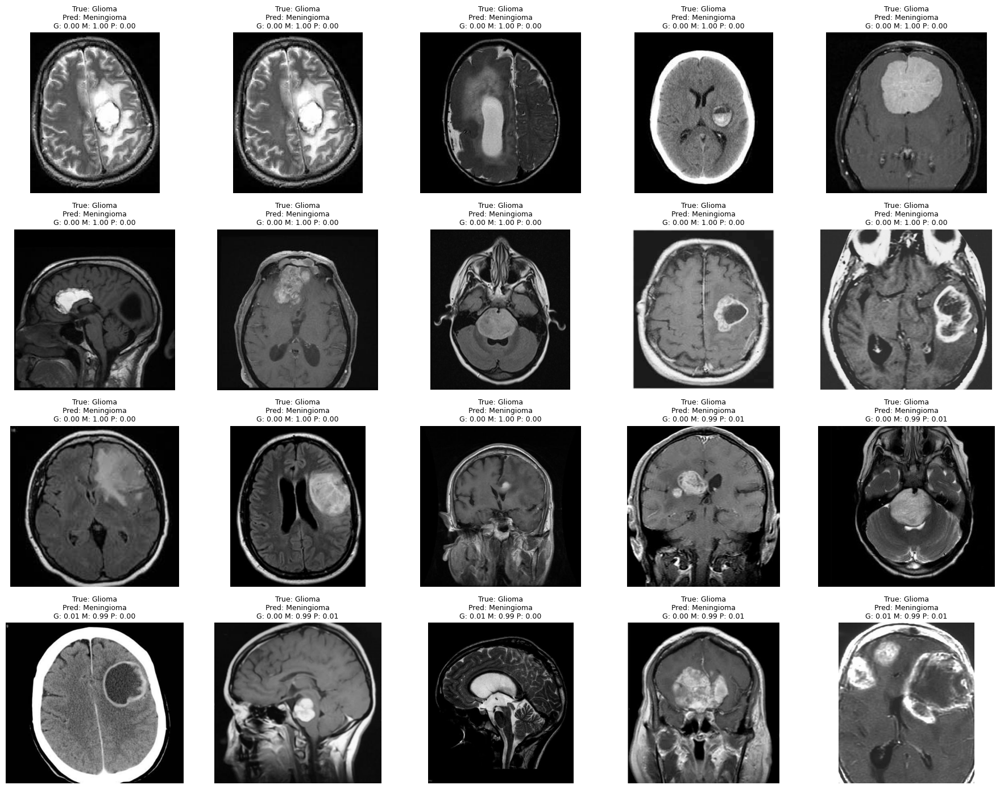


Highest-confidence errors displayed first.


In [20]:
# ============================================================
# MODEL 3A — VISUALIZE GLIOMA → MENINGIOMA ERRORS
# ============================================================

import matplotlib.pyplot as plt
import math
from PIL import Image

print("=" * 70)
print("GLIOMA → MENINGIOMA MISCLASSIFICATIONS")
print("=" * 70)

# ------------------------------------------------------------
# Find all Glioma → Meningioma errors
# ------------------------------------------------------------

glioma_id = CLASS_NAMES.index("glioma")
meningioma_id = CLASS_NAMES.index("meningioma")

error_indices = np.where(
    (all_labels == glioma_id) &
    (all_predictions == meningioma_id)
)[0]

print(
    f"\nFound {len(error_indices)} "
    "Glioma → Meningioma errors."
)

# ------------------------------------------------------------
# Sort by confidence
# Highest-confidence mistakes first
# ------------------------------------------------------------

error_confidences = (
    all_probabilities[
        error_indices,
        meningioma_id
    ]
)

sorted_order = np.argsort(
    error_confidences
)[::-1]

error_indices = error_indices[
    sorted_order
]

# ------------------------------------------------------------
# Display first 20
# ------------------------------------------------------------

N = min(
    20,
    len(error_indices)
)

cols = 5
rows = math.ceil(
    N / cols
)

plt.figure(
    figsize=(18, 14)
)

for plot_index in range(N):

    dataset_index = int(
        error_indices[plot_index]
    )

    image_path, true_label = (
        test_dataset.samples[dataset_index]
    )

    image = Image.open(
        image_path
    ).convert("RGB")

    predicted_id = int(
        all_predictions[
            dataset_index
        ]
    )

    probs = all_probabilities[
        dataset_index
    ]

    plt.subplot(
        rows,
        cols,
        plot_index + 1
    )

    plt.imshow(image)

    plt.axis("off")

    plt.title(
        f"True: Glioma\n"
        f"Pred: Meningioma\n"
        f"G: {probs[0]:.2f} "
        f"M: {probs[1]:.2f} "
        f"P: {probs[2]:.2f}",
        fontsize=9
    )

plt.tight_layout()

plt.show()

print("\nHighest-confidence errors displayed first.")

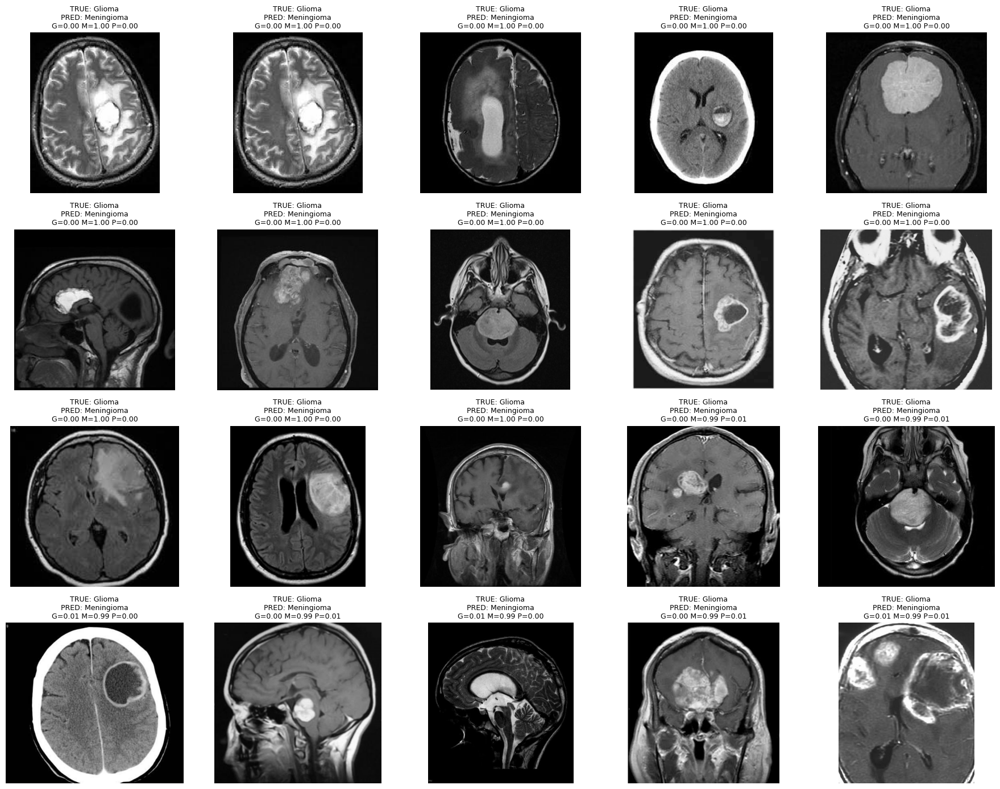


Saved: /content/glioma_meningioma_errors.png


In [21]:
# ============================================================
# SAVE GLIOMA → MENINGIOMA ERROR GRID
# ============================================================

import matplotlib.pyplot as plt
import math
from PIL import Image

N = min(20, len(error_indices))

cols = 5
rows = math.ceil(N / cols)

fig = plt.figure(figsize=(18, 14))

for plot_index in range(N):

    dataset_index = int(
        error_indices[plot_index]
    )

    image_path, true_label = (
        test_dataset.samples[dataset_index]
    )

    image = Image.open(
        image_path
    ).convert("RGB")

    probs = all_probabilities[
        dataset_index
    ]

    plt.subplot(
        rows,
        cols,
        plot_index + 1
    )

    plt.imshow(image)
    plt.axis("off")

    plt.title(
        f"TRUE: Glioma\n"
        f"PRED: Meningioma\n"
        f"G={probs[0]:.2f} "
        f"M={probs[1]:.2f} "
        f"P={probs[2]:.2f}",
        fontsize=9
    )

plt.tight_layout()

error_grid_path = (
    "/content/glioma_meningioma_errors.png"
)

plt.savefig(
    error_grid_path,
    dpi=150,
    bbox_inches="tight"
)

plt.show()

print(
    "\nSaved:",
    error_grid_path
)

GLIOMA → MENINGIOMA ERROR GRID

File: /content/glioma_meningioma_errors.png
Size: 2184.3 KB


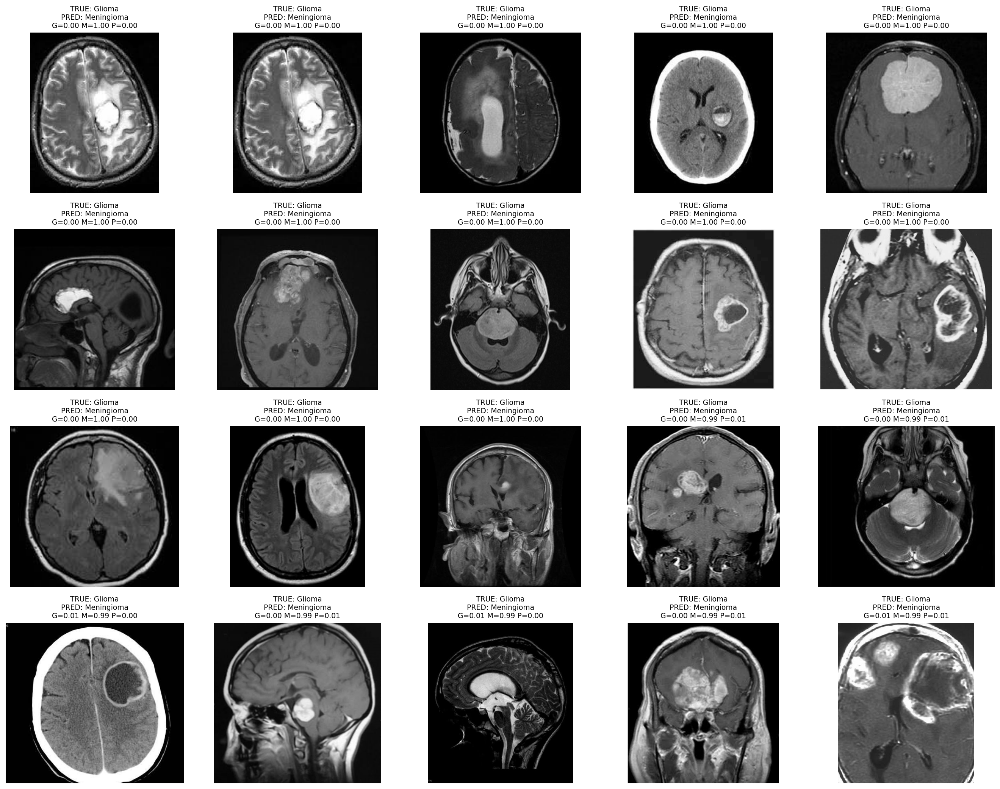

In [22]:
# ============================================================
# DISPLAY GLIOMA → MENINGIOMA ERROR GRID
# ============================================================

from IPython.display import display, Image as IPImage
from pathlib import Path

error_grid_path = Path(
    "/content/glioma_meningioma_errors.png"
)

if not error_grid_path.exists():
    raise FileNotFoundError(
        f"File not found: {error_grid_path}"
    )

print("=" * 70)
print("GLIOMA → MENINGIOMA ERROR GRID")
print("=" * 70)

print(
    f"\nFile: {error_grid_path}"
)

print(
    f"Size: "
    f"{error_grid_path.stat().st_size / 1024:.1f} KB"
)

display(
    IPImage(
        filename=str(error_grid_path)
    )
)

In [23]:
# ============================================================
# MODEL 3A — DATASET QUALITY AUDIT
# ============================================================

import os
import hashlib
from pathlib import Path
from collections import Counter, defaultdict

print("=" * 70)
print("MODEL 3A — DATASET QUALITY AUDIT")
print("=" * 70)


# ============================================================
# 1. EXACT DUPLICATE FILE HASHES
# ============================================================

def file_hash(path):
    h = hashlib.sha256()

    with open(path, "rb") as f:
        while True:
            chunk = f.read(1024 * 1024)

            if not chunk:
                break

            h.update(chunk)

    return h.hexdigest()


def scan_directory(directory):

    records = []

    directory = Path(directory)

    for class_dir in sorted(directory.iterdir()):

        if not class_dir.is_dir():
            continue

        for path in class_dir.rglob("*"):

            if path.is_file():

                try:
                    records.append({
                        "path": str(path),
                        "class": class_dir.name,
                        "hash": file_hash(path)
                    })

                except Exception:
                    pass

    return records


print("\nScanning training dataset...")

train_records = scan_directory(
    "/content/data/Training"
)

print(
    f"Training files scanned: "
    f"{len(train_records)}"
)


print("\nScanning testing dataset...")

test_records = scan_directory(
    "/content/data/Testing"
)

print(
    f"Testing files scanned: "
    f"{len(test_records)}"
)


# ============================================================
# 2. DUPLICATES INSIDE TRAINING
# ============================================================

def find_duplicates(records):

    hash_groups = defaultdict(list)

    for record in records:

        hash_groups[
            record["hash"]
        ].append(record)

    return {
        h: items
        for h, items in hash_groups.items()
        if len(items) > 1
    }


train_duplicates = find_duplicates(
    train_records
)

test_duplicates = find_duplicates(
    test_records
)


print("\n" + "-" * 70)
print("EXACT DUPLICATES")
print("-" * 70)

print(
    f"Training duplicate groups: "
    f"{len(train_duplicates)}"
)

print(
    f"Testing duplicate groups: "
    f"{len(test_duplicates)}"
)


# ============================================================
# 3. TRAIN ↔ TEST DUPLICATES
# ============================================================

train_hashes = defaultdict(list)

for record in train_records:

    train_hashes[
        record["hash"]
    ].append(record)


cross_duplicates = []

for record in test_records:

    if record["hash"] in train_hashes:

        cross_duplicates.append(
            (
                record,
                train_hashes[
                    record["hash"]
                ]
            )
        )


print(
    f"\nTraining ↔ Testing exact duplicates: "
    f"{len(cross_duplicates)}"
)


if cross_duplicates:

    print(
        "\nFirst 10 cross-dataset duplicates:"
    )

    for test_record, train_matches in (
        cross_duplicates[:10]
    ):

        print(
            "\nTEST:"
        )

        print(
            test_record["path"]
        )

        print(
            "TRAIN:"
        )

        for match in train_matches:

            print(
                f"  {match['path']}"
            )


# ============================================================
# 4. CLASS DISTRIBUTION
# ============================================================

print("\n" + "-" * 70)
print("CLASS DISTRIBUTION")
print("-" * 70)

for dataset_name, records in [
    ("Training", train_records),
    ("Testing", test_records)
]:

    counts = Counter(
        r["class"]
        for r in records
    )

    print(
        f"\n{dataset_name}:"
    )

    for class_name in sorted(counts):

        print(
            f"  {class_name:12s}: "
            f"{counts[class_name]}"
        )


# ============================================================
# 5. IMAGE DIMENSION / FORMAT DISTRIBUTION
# ============================================================

from PIL import Image

def image_statistics(records):

    dimensions = Counter()
    modes = Counter()
    extensions = Counter()

    for record in records:

        path = record["path"]

        extensions[
            Path(path).suffix.lower()
        ] += 1

        try:

            with Image.open(path) as img:

                dimensions[
                    img.size
                ] += 1

                modes[
                    img.mode
                ] += 1

        except Exception:
            pass

    return dimensions, modes, extensions


train_dimensions, train_modes, train_extensions = (
    image_statistics(train_records)
)

test_dimensions, test_modes, test_extensions = (
    image_statistics(test_records)
)


print("\n" + "-" * 70)
print("TRAINING IMAGE PROPERTIES")
print("-" * 70)

print("\nMost common dimensions:")

for dim, count in train_dimensions.most_common(15):

    print(
        f"  {dim}: {count}"
    )

print("\nImage modes:")

for mode, count in train_modes.items():

    print(
        f"  {mode}: {count}"
    )


print("\n" + "-" * 70)
print("TEST IMAGE PROPERTIES")
print("-" * 70)

print("\nMost common dimensions:")

for dim, count in test_dimensions.most_common(15):

    print(
        f"  {dim}: {count}"
    )

print("\nImage modes:")

for mode, count in test_modes.items():

    print(
        f"  {mode}: {count}"
    )


# ============================================================
# 6. CLASS-SPECIFIC FILE HASH DUPLICATES
# ============================================================

print("\n" + "-" * 70)
print("DUPLICATES BY CLASS")
print("-" * 70)

for class_name in [
    "glioma",
    "meningioma",
    "pituitary"
]:

    class_records = [
        r
        for r in train_records
        if r["class"] == class_name
    ]

    class_duplicates = find_duplicates(
        class_records
    )

    duplicate_files = sum(
        len(v)
        for v in class_duplicates.values()
    )

    print(
        f"{class_name:12s}: "
        f"{len(class_duplicates)} duplicate groups, "
        f"{duplicate_files} duplicate files"
    )


print("\n" + "=" * 70)
print("DATASET AUDIT COMPLETE")
print("=" * 70)

MODEL 3A — DATASET QUALITY AUDIT

Scanning training dataset...
Training files scanned: 5600

Scanning testing dataset...
Testing files scanned: 1600

----------------------------------------------------------------------
EXACT DUPLICATES
----------------------------------------------------------------------
Training duplicate groups: 138
Testing duplicate groups: 15

Training ↔ Testing exact duplicates: 0

----------------------------------------------------------------------
CLASS DISTRIBUTION
----------------------------------------------------------------------

Training:
  glioma      : 1400
  meningioma  : 1400
  notumor     : 1400
  pituitary   : 1400

Testing:
  glioma      : 400
  meningioma  : 400
  notumor     : 400
  pituitary   : 400

----------------------------------------------------------------------
TRAINING IMAGE PROPERTIES
----------------------------------------------------------------------

Most common dimensions:
  (512, 512): 4012
  (225, 225): 253
  (630, 630):

In [24]:
# ============================================================
# MODEL 3A — CROSS-CLASS DUPLICATE / LABEL CONFLICT AUDIT
# ============================================================

from collections import defaultdict

print("=" * 70)
print("MODEL 3A — CROSS-CLASS DUPLICATE AUDIT")
print("=" * 70)

# ------------------------------------------------------------
# Group all training files by exact SHA256 hash
# ------------------------------------------------------------

hash_groups = defaultdict(list)

for record in train_records:

    hash_groups[
        record["hash"]
    ].append(record)


# ------------------------------------------------------------
# Find hashes appearing in MORE THAN ONE class
# ------------------------------------------------------------

cross_class_groups = []

for image_hash, records in hash_groups.items():

    classes = set(
        record["class"]
        for record in records
    )

    if len(classes) > 1:

        cross_class_groups.append(
            (
                image_hash,
                records
            )
        )


print(
    f"\nCross-class duplicate groups: "
    f"{len(cross_class_groups)}"
)


# ------------------------------------------------------------
# Count affected files
# ------------------------------------------------------------

affected_files = sum(
    len(records)
    for _, records in cross_class_groups
)

print(
    f"Files involved in cross-class duplicates: "
    f"{affected_files}"
)


# ------------------------------------------------------------
# Show the conflicts
# ------------------------------------------------------------

if cross_class_groups:

    print("\n" + "-" * 70)
    print("CROSS-CLASS DUPLICATE EXAMPLES")
    print("-" * 70)

    for image_hash, records in (
        cross_class_groups[:30]
    ):

        print("\nHASH:")
        print(image_hash)

        for record in records:

            print(
                f"  [{record['class']:12s}] "
                f"{record['path']}"
            )

else:

    print(
        "\n✓ No exact image exists under "
        "multiple class labels."
    )


# ------------------------------------------------------------
# Summary by class pair
# ------------------------------------------------------------

pair_counts = defaultdict(int)

for _, records in cross_class_groups:

    classes = sorted(
        set(
            record["class"]
            for record in records
        )
    )

    if len(classes) >= 2:

        for i in range(len(classes)):

            for j in range(
                i + 1,
                len(classes)
            ):

                pair = (
                    classes[i],
                    classes[j]
                )

                pair_counts[pair] += 1


print("\n" + "-" * 70)
print("CROSS-CLASS CONFLICT SUMMARY")
print("-" * 70)

if pair_counts:

    for pair, count in sorted(
        pair_counts.items(),
        key=lambda x: x[1],
        reverse=True
    ):

        print(
            f"  {pair[0]:12s} ↔ "
            f"{pair[1]:12s}: "
            f"{count}"
        )

else:

    print(
        "No cross-class conflicts found."
    )


print("\n" + "=" * 70)
print("CROSS-CLASS DUPLICATE AUDIT COMPLETE")
print("=" * 70)

MODEL 3A — CROSS-CLASS DUPLICATE AUDIT

Cross-class duplicate groups: 0
Files involved in cross-class duplicates: 0

✓ No exact image exists under multiple class labels.

----------------------------------------------------------------------
CROSS-CLASS CONFLICT SUMMARY
----------------------------------------------------------------------
No cross-class conflicts found.

CROSS-CLASS DUPLICATE AUDIT COMPLETE


In [25]:
# ============================================================
# MODEL 3A — CLASS-WISE IMAGE DISTRIBUTION AUDIT
# ============================================================

from collections import Counter
from pathlib import Path
from PIL import Image

print("=" * 70)
print("MODEL 3A — CLASS-WISE IMAGE DISTRIBUTION AUDIT")
print("=" * 70)


def analyze_class(records, class_name):

    class_records = [
        r for r in records
        if r["class"] == class_name
    ]

    dimensions = Counter()
    modes = Counter()
    extensions = Counter()

    widths = []
    heights = []

    for record in class_records:

        path = record["path"]

        extensions[
            Path(path).suffix.lower()
        ] += 1

        try:

            with Image.open(path) as img:

                dimensions[
                    img.size
                ] += 1

                modes[
                    img.mode
                ] += 1

                widths.append(img.width)
                heights.append(img.height)

        except Exception:
            pass

    print(
        f"\n{'-' * 70}"
    )

    print(
        f"{class_name.upper()}"
    )

    print(
        f"{'-' * 70}"
    )

    print(
        f"Files: {len(class_records)}"
    )

    print("\nModes:")

    for mode, count in modes.most_common():

        print(
            f"  {mode:6s}: "
            f"{count:4d} "
            f"({count / len(class_records) * 100:.1f}%)"
        )

    print("\nTop dimensions:")

    for dim, count in dimensions.most_common(10):

        print(
            f"  {str(dim):15s}: "
            f"{count:4d} "
            f"({count / len(class_records) * 100:.1f}%)"
        )

    print("\nExtensions:")

    for ext, count in extensions.most_common():

        print(
            f"  {ext:6s}: "
            f"{count:4d}"
        )

    if widths:

        print("\nDimension statistics:")

        print(
            f"  Width  min/max: "
            f"{min(widths)} / {max(widths)}"
        )

        print(
            f"  Height min/max: "
            f"{min(heights)} / {max(heights)}"
        )


# ============================================================
# TRAINING
# ============================================================

print("\n" + "=" * 70)
print("TRAINING DATA")
print("=" * 70)

for class_name in [
    "glioma",
    "meningioma",
    "pituitary"
]:

    analyze_class(
        train_records,
        class_name
    )


# ============================================================
# TESTING
# ============================================================

print("\n" + "=" * 70)
print("TESTING DATA")
print("=" * 70)

for class_name in [
    "glioma",
    "meningioma",
    "pituitary"
]:

    analyze_class(
        test_records,
        class_name
    )


print("\n" + "=" * 70)
print("CLASS-WISE AUDIT COMPLETE")
print("=" * 70)

MODEL 3A — CLASS-WISE IMAGE DISTRIBUTION AUDIT

TRAINING DATA

----------------------------------------------------------------------
GLIOMA
----------------------------------------------------------------------
Files: 1400

Modes:
  L     : 1173 (83.8%)
  RGB   :  227 (16.2%)

Top dimensions:
  (512, 512)     : 1400 (100.0%)

Extensions:
  .jpg  : 1400

Dimension statistics:
  Width  min/max: 512 / 512
  Height min/max: 512 / 512

----------------------------------------------------------------------
MENINGIOMA
----------------------------------------------------------------------
Files: 1400

Modes:
  RGB   :  845 (60.4%)
  L     :  555 (39.6%)

Top dimensions:
  (512, 512)     : 1267 (90.5%)
  (225, 225)     :    8 (0.6%)
  (442, 442)     :    4 (0.3%)
  (455, 500)     :    3 (0.2%)
  (554, 554)     :    2 (0.1%)
  (212, 237)     :    2 (0.1%)
  (341, 395)     :    2 (0.1%)
  (201, 251)     :    2 (0.1%)
  (200, 223)     :    2 (0.1%)
  (213, 237)     :    2 (0.1%)

Extensions:
  .j

In [26]:
# ============================================================
# MODEL 3A — IMPROVED MRI PREPROCESSING PIPELINE
# ============================================================

import torch
import torchvision.transforms as transforms

print("=" * 70)
print("MODEL 3A — IMPROVED MRI PREPROCESSING")
print("=" * 70)

IMAGE_SIZE = 224
RESIZE_SIZE = 256


# ============================================================
# IMPORTANT:
# Convert ALL images to grayscale first.
#
# Then convert grayscale -> RGB because EfficientNet-B0
# requires 3 input channels.
# ============================================================

train_transforms_v2 = transforms.Compose([

    # Force every image into a consistent grayscale modality
    transforms.Grayscale(num_output_channels=3),

    # Preserve aspect ratio
    transforms.Resize(
        RESIZE_SIZE
    ),

    # Standard spatial crop
    transforms.CenterCrop(
        IMAGE_SIZE
    ),

    # Mild MRI-safe augmentation
    transforms.RandomHorizontalFlip(
        p=0.5
    ),

    transforms.RandomRotation(
        degrees=8
    ),

    transforms.RandomAffine(
        degrees=0,
        translate=(0.05, 0.05),
        scale=(0.95, 1.05)
    ),

    # Mild intensity augmentation
    transforms.ColorJitter(
        brightness=0.10,
        contrast=0.10
    ),

    transforms.ToTensor(),

    # ImageNet normalization
    transforms.Normalize(
        mean=[
            0.485,
            0.456,
            0.406
        ],
        std=[
            0.229,
            0.224,
            0.225
        ]
    )
])


# ============================================================
# VALIDATION / TEST
# NO RANDOM AUGMENTATION
# ============================================================

eval_transforms_v2 = transforms.Compose([

    # Force everything to grayscale
    transforms.Grayscale(
        num_output_channels=3
    ),

    # Preserve aspect ratio
    transforms.Resize(
        RESIZE_SIZE
    ),

    # Same deterministic crop
    transforms.CenterCrop(
        IMAGE_SIZE
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[
            0.485,
            0.456,
            0.406
        ],
        std=[
            0.229,
            0.224,
            0.225
        ]
    )
])


# ============================================================
# TEST THE TRANSFORMS
# ============================================================

from PIL import Image
import random

sample_record = random.choice(
    train_records
)

sample_path = sample_record["path"]

print("\nSample image:")
print(
    f"  Class: {sample_record['class']}"
)

print(
    f"  Path : {sample_path}"
)

image = Image.open(
    sample_path
)

print(
    f"\nOriginal:"
)

print(
    f"  Mode: {image.mode}"
)

print(
    f"  Size: {image.size}"
)


transformed = eval_transforms_v2(
    image
)

print(
    "\nAfter preprocessing:"
)

print(
    f"  Shape: {transformed.shape}"
)

print(
    f"  Dtype: {transformed.dtype}"
)

print(
    f"  Min: {transformed.min().item():.4f}"
)

print(
    f"  Max: {transformed.max().item():.4f}"
)

print(
    f"  Mean: {transformed.mean().item():.4f}"
)

# Verify 3 channels
assert transformed.shape == (
    3,
    224,
    224
)

print(
    "\n✓ Output is exactly "
    "(3, 224, 224)"
)

print(
    "✓ All images will use grayscale → 3-channel input"
)

print(
    "✓ Aspect ratio is preserved before cropping"
)

print(
    "✓ Validation/test pipeline is deterministic"
)

print("\n" + "=" * 70)
print("PREPROCESSING PIPELINE READY")
print("=" * 70)

MODEL 3A — IMPROVED MRI PREPROCESSING

Sample image:
  Class: meningioma
  Path : /content/data/Training/meningioma/Tr-me_483.jpg

Original:
  Mode: RGB
  Size: (512, 512)

After preprocessing:
  Shape: torch.Size([3, 224, 224])
  Dtype: torch.float32
  Min: -2.1008
  Max: 2.3263
  Mean: -0.9990

✓ Output is exactly (3, 224, 224)
✓ All images will use grayscale → 3-channel input
✓ Aspect ratio is preserved before cropping
✓ Validation/test pipeline is deterministic

PREPROCESSING PIPELINE READY


In [27]:
# ============================================================
# MODEL 3A — BUILD V2 DATASETS + DATALOADERS
# ============================================================

import torch
from torch.utils.data import DataLoader, Subset
from torchvision import datasets
from sklearn.model_selection import train_test_split
import numpy as np

print("=" * 70)
print("MODEL 3A — BUILDING V2 DATASETS")
print("=" * 70)

# ============================================================
# PATHS
# ============================================================

TRAIN_DIR = "/content/data/Training"
TEST_DIR = "/content/data/Testing"

BATCH_SIZE = 32
NUM_WORKERS = 2

# ============================================================
# FULL TRAIN DATASET
#
# We create TWO versions:
# 1. augmented version
# 2. deterministic validation version
# ============================================================

train_dataset_full = datasets.ImageFolder(
    TRAIN_DIR,
    transform=train_transforms_v2
)

train_dataset_clean = datasets.ImageFolder(
    TRAIN_DIR,
    transform=eval_transforms_v2
)

test_dataset_v2 = datasets.ImageFolder(
    TEST_DIR,
    transform=eval_transforms_v2
)

# ============================================================
# VERIFY CLASS ORDER
# ============================================================

print("\nClasses:")
print(
    train_dataset_full.classes
)

print("\nClass mapping:")
print(
    train_dataset_full.class_to_idx
)

EXPECTED_CLASSES = [
    "glioma",
    "meningioma",
    "pituitary"
]

assert (
    train_dataset_full.classes
    == EXPECTED_CLASSES
), (
    "Unexpected class order! "
    f"Found: {train_dataset_full.classes}"
)

assert (
    test_dataset_v2.classes
    == EXPECTED_CLASSES
), (
    "Unexpected test class order! "
    f"Found: {test_dataset_v2.classes}"
)

# ============================================================
# CREATE STRATIFIED TRAIN / VALIDATION SPLIT
# ============================================================

all_indices = np.arange(
    len(train_dataset_full)
)

all_labels = np.array(
    train_dataset_full.targets
)

train_indices, val_indices = train_test_split(
    all_indices,
    test_size=0.10,
    random_state=42,
    stratify=all_labels
)

# ============================================================
# CREATE SUBSETS
# ============================================================

train_dataset_v2 = Subset(
    train_dataset_full,
    train_indices
)

val_dataset_v2 = Subset(
    train_dataset_clean,
    val_indices
)

# ============================================================
# DATALOADERS
# ============================================================

train_loader_v2 = DataLoader(
    train_dataset_v2,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

val_loader_v2 = DataLoader(
    val_dataset_v2,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

test_loader_v2 = DataLoader(
    test_dataset_v2,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

# ============================================================
# DATASET SIZES
# ============================================================

print("\n" + "=" * 70)
print("DATASET SIZES")
print("=" * 70)

print(
    f"Training   : {len(train_dataset_v2)}"
)

print(
    f"Validation : {len(val_dataset_v2)}"
)

print(
    f"Testing    : {len(test_dataset_v2)}"
)

# ============================================================
# LABEL DISTRIBUTION
# ============================================================

def get_subset_labels(subset):

    return np.array([
        train_dataset_full.targets[
            subset.indices[i]
        ]
        for i in range(
            len(subset)
        )
    ])


train_labels_v2 = get_subset_labels(
    train_dataset_v2
)

val_labels_v2 = get_subset_labels(
    val_dataset_v2
)

print("\nTraining distribution:")

for class_id, class_name in enumerate(
    EXPECTED_CLASSES
):

    count = (
        train_labels_v2
        == class_id
    ).sum()

    print(
        f"  {class_id} -> "
        f"{class_name:12s}: "
        f"{count}"
    )

print("\nValidation distribution:")

for class_id, class_name in enumerate(
    EXPECTED_CLASSES
):

    count = (
        val_labels_v2
        == class_id
    ).sum()

    print(
        f"  {class_id} -> "
        f"{class_name:12s}: "
        f"{count}"
    )

print("\nTest distribution:")

for class_id, class_name in enumerate(
    EXPECTED_CLASSES
):

    count = (
        np.array(test_dataset_v2.targets)
        == class_id
    ).sum()

    print(
        f"  {class_id} -> "
        f"{class_name:12s}: "
        f"{count}"
    )

# ============================================================
# FIRST BATCH SANITY CHECK
# ============================================================

images, labels = next(
    iter(train_loader_v2)
)

print("\n" + "=" * 70)
print("FIRST TRAINING BATCH")
print("=" * 70)

print(
    f"Image shape : {images.shape}"
)

print(
    f"Labels shape: {labels.shape}"
)

print(
    f"Image dtype : {images.dtype}"
)

print(
    f"Image min   : {images.min().item():.4f}"
)

print(
    f"Image max   : {images.max().item():.4f}"
)

print(
    f"Image mean  : {images.mean().item():.4f}"
)

print(
    f"Labels      : {labels.tolist()}"
)

assert images.shape[1:] == (
    3,
    224,
    224
)

assert labels.min() >= 0
assert labels.max() <= 2

print(
    "\n✓ Dataset class order verified."
)

print(
    "✓ Train/validation split is stratified."
)

print(
    "✓ All inputs are 3 × 224 × 224."
)

print(
    "✓ Only three tumor classes are present."
)

print("\n" + "=" * 70)
print("V2 DATASETS READY")
print("=" * 70)

MODEL 3A — BUILDING V2 DATASETS

Classes:
['glioma', 'meningioma', 'notumor', 'pituitary']

Class mapping:
{'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}


AssertionError: Unexpected class order! Found: ['glioma', 'meningioma', 'notumor', 'pituitary']

In [28]:
# ============================================================
# MODEL 3A — BUILD 3-CLASS DATASETS V2
# ============================================================

import torch
from torch.utils.data import DataLoader, Subset
from torchvision import datasets
from sklearn.model_selection import train_test_split
import numpy as np

print("=" * 70)
print("MODEL 3A — BUILDING 3-CLASS DATASETS V2")
print("=" * 70)

# ============================================================
# PATHS
# ============================================================

TRAIN_DIR = "/content/data/Training"
TEST_DIR = "/content/data/Testing"

BATCH_SIZE = 32
NUM_WORKERS = 2

EXPECTED_CLASSES = [
    "glioma",
    "meningioma",
    "pituitary"
]

# ============================================================
# LOAD ORIGINAL DATASET
#
# ImageFolder will detect all 4 folders.
# We will remove "notumor" from the samples.
# ============================================================

full_train_aug = datasets.ImageFolder(
    TRAIN_DIR,
    transform=train_transforms_v2
)

full_train_clean = datasets.ImageFolder(
    TRAIN_DIR,
    transform=eval_transforms_v2
)

full_test_clean = datasets.ImageFolder(
    TEST_DIR,
    transform=eval_transforms_v2
)

print("\nOriginal classes:")
print(
    full_train_aug.classes
)

print("\nOriginal mapping:")
print(
    full_train_aug.class_to_idx
)

# ============================================================
# VERIFY ORIGINAL DATASET
# ============================================================

assert full_train_aug.classes == [
    "glioma",
    "meningioma",
    "notumor",
    "pituitary"
], (
    "Unexpected original class order: "
    f"{full_train_aug.classes}"
)

# ============================================================
# ORIGINAL CLASS IDs
# ============================================================

GLIOMA_ID = full_train_aug.class_to_idx["glioma"]
MENINGIOMA_ID = full_train_aug.class_to_idx["meningioma"]
NOTUMOR_ID = full_train_aug.class_to_idx["notumor"]
PITUITARY_ID = full_train_aug.class_to_idx["pituitary"]

KEEP_IDS = {
    GLIOMA_ID,
    MENINGIOMA_ID,
    PITUITARY_ID
}

print("\nOriginal IDs:")
print(
    f"  glioma     -> {GLIOMA_ID}"
)
print(
    f"  meningioma -> {MENINGIOMA_ID}"
)
print(
    f"  notumor    -> {NOTUMOR_ID}"
)
print(
    f"  pituitary  -> {PITUITARY_ID}"
)

# ============================================================
# CREATE 3-CLASS SAMPLE LISTS
# ============================================================

def filter_samples(dataset):

    return [
        sample
        for sample in dataset.samples
        if sample[1] in KEEP_IDS
    ]


train_samples_aug = filter_samples(
    full_train_aug
)

train_samples_clean = filter_samples(
    full_train_clean
)

test_samples_clean = filter_samples(
    full_test_clean
)

print("\nFiltered dataset sizes:")

print(
    f"Training samples : "
    f"{len(train_samples_aug)}"
)

print(
    f"Testing samples  : "
    f"{len(test_samples_clean)}"
)

# ============================================================
# CREATE NEW CLASS MAPPING
#
# IMPORTANT:
#
# Original:
#   0 -> glioma
#   1 -> meningioma
#   2 -> notumor
#   3 -> pituitary
#
# New:
#   0 -> glioma
#   1 -> meningioma
#   2 -> pituitary
# ============================================================

OLD_TO_NEW = {
    GLIOMA_ID: 0,
    MENINGIOMA_ID: 1,
    PITUITARY_ID: 2
}

CLASS_NAMES_V2 = [
    "glioma",
    "meningioma",
    "pituitary"
]

# ============================================================
# CUSTOM DATASET
# ============================================================

class FilteredBrainTumorDataset(torch.utils.data.Dataset):

    def __init__(
        self,
        samples,
        transform,
        old_to_new
    ):

        self.samples = samples
        self.transform = transform
        self.old_to_new = old_to_new

    def __len__(self):

        return len(self.samples)

    def __getitem__(self, index):

        path, old_label = self.samples[index]

        image = self._load_image(path)

        if self.transform is not None:

            image = self.transform(image)

        new_label = self.old_to_new[
            old_label
        ]

        return image, new_label

    @staticmethod
    def _load_image(path):

        from PIL import Image

        return Image.open(
            path
        ).convert("RGB")


# ============================================================
# BUILD TRAIN / TEST DATASETS
# ============================================================

train_dataset_all_v2 = FilteredBrainTumorDataset(
    samples=train_samples_aug,
    transform=train_transforms_v2,
    old_to_new=OLD_TO_NEW
)

train_dataset_clean_v2 = FilteredBrainTumorDataset(
    samples=train_samples_clean,
    transform=eval_transforms_v2,
    old_to_new=OLD_TO_NEW
)

test_dataset_v2 = FilteredBrainTumorDataset(
    samples=test_samples_clean,
    transform=eval_transforms_v2,
    old_to_new=OLD_TO_NEW
)

# ============================================================
# STRATIFIED TRAIN / VALIDATION SPLIT
# ============================================================

all_labels_v2 = np.array([
    OLD_TO_NEW[
        sample[1]
    ]
    for sample in train_samples_aug
])

all_indices_v2 = np.arange(
    len(train_samples_aug)
)

train_indices_v2, val_indices_v2 = (
    train_test_split(
        all_indices_v2,
        test_size=0.10,
        random_state=42,
        stratify=all_labels_v2
    )
)

# ============================================================
# SUBSETS
# ============================================================

train_dataset_v2 = Subset(
    train_dataset_all_v2,
    train_indices_v2
)

val_dataset_v2 = Subset(
    train_dataset_clean_v2,
    val_indices_v2
)

# ============================================================
# DATALOADERS
# ============================================================

train_loader_v2 = DataLoader(
    train_dataset_v2,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

val_loader_v2 = DataLoader(
    val_dataset_v2,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

test_loader_v2 = DataLoader(
    test_dataset_v2,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

# ============================================================
# DATASET COUNTS
# ============================================================

print("\n" + "=" * 70)
print("3-CLASS DATASET COUNTS")
print("=" * 70)

print(
    f"Training   : {len(train_dataset_v2)}"
)

print(
    f"Validation : {len(val_dataset_v2)}"
)

print(
    f"Testing    : {len(test_dataset_v2)}"
)

# ============================================================
# LABEL DISTRIBUTION
# ============================================================

train_labels_final = np.array([
    all_labels_v2[i]
    for i in train_indices_v2
])

val_labels_final = np.array([
    all_labels_v2[i]
    for i in val_indices_v2
])

test_labels_final = np.array([
    OLD_TO_NEW[
        sample[1]
    ]
    for sample in test_samples_clean
])

print("\nTraining distribution:")

for class_id, class_name in enumerate(
    CLASS_NAMES_V2
):

    count = (
        train_labels_final == class_id
    ).sum()

    print(
        f"  {class_id} -> "
        f"{class_name:12s}: "
        f"{count}"
    )

print("\nValidation distribution:")

for class_id, class_name in enumerate(
    CLASS_NAMES_V2
):

    count = (
        val_labels_final == class_id
    ).sum()

    print(
        f"  {class_id} -> "
        f"{class_name:12s}: "
        f"{count}"
    )

print("\nTesting distribution:")

for class_id, class_name in enumerate(
    CLASS_NAMES_V2
):

    count = (
        test_labels_final == class_id
    ).sum()

    print(
        f"  {class_id} -> "
        f"{class_name:12s}: "
        f"{count}"
    )

# ============================================================
# DATALOADER INFO
# ============================================================

print("\n" + "=" * 70)
print("DATALOADERS")
print("=" * 70)

print(
    f"Train batches      : "
    f"{len(train_loader_v2)}"
)

print(
    f"Validation batches : "
    f"{len(val_loader_v2)}"
)

print(
    f"Test batches       : "
    f"{len(test_loader_v2)}"
)

# ============================================================
# FIRST BATCH SANITY CHECK
# ============================================================

images, labels = next(
    iter(train_loader_v2)
)

print("\n" + "=" * 70)
print("FIRST TRAINING BATCH")
print("=" * 70)

print(
    f"Image shape : {images.shape}"
)

print(
    f"Labels shape: {labels.shape}"
)

print(
    f"Image dtype : {images.dtype}"
)

print(
    f"Image min   : {images.min().item():.4f}"
)

print(
    f"Image max   : {images.max().item():.4f}"
)

print(
    f"Image mean  : {images.mean().item():.4f}"
)

print(
    f"Labels      : {labels.tolist()}"
)

# ============================================================
# ASSERTIONS
# ============================================================

assert len(train_dataset_v2) == 3780
assert len(val_dataset_v2) == 420
assert len(test_dataset_v2) == 1200

assert images.shape[1:] == (
    3,
    224,
    224
)

assert labels.min().item() >= 0
assert labels.max().item() <= 2

assert CLASS_NAMES_V2 == [
    "glioma",
    "meningioma",
    "pituitary"
]

print("\n✓ notumor successfully excluded.")

print(
    "✓ Final mapping:"
)

for i, name in enumerate(
    CLASS_NAMES_V2
):

    print(
        f"    {i} -> {name}"
    )

print(
    "\n✓ Train/validation/test datasets verified."
)

print(
    "✓ Input shape verified: "
    "(3, 224, 224)"
)

print("\n" + "=" * 70)
print("V2 3-CLASS DATASETS READY")
print("=" * 70)

MODEL 3A — BUILDING 3-CLASS DATASETS V2

Original classes:
['glioma', 'meningioma', 'notumor', 'pituitary']

Original mapping:
{'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}

Original IDs:
  glioma     -> 0
  meningioma -> 1
  notumor    -> 2
  pituitary  -> 3

Filtered dataset sizes:
Training samples : 4200
Testing samples  : 1200

3-CLASS DATASET COUNTS
Training   : 3780
Validation : 420
Testing    : 1200

Training distribution:
  0 -> glioma      : 1260
  1 -> meningioma  : 1260
  2 -> pituitary   : 1260

Validation distribution:
  0 -> glioma      : 140
  1 -> meningioma  : 140
  2 -> pituitary   : 140

Testing distribution:
  0 -> glioma      : 400
  1 -> meningioma  : 400
  2 -> pituitary   : 400

DATALOADERS
Train batches      : 119
Validation batches : 14
Test batches       : 38

FIRST TRAINING BATCH
Image shape : torch.Size([32, 3, 224, 224])
Labels shape: torch.Size([32])
Image dtype : torch.float32
Image min   : -2.1179
Image max   : 2.6400
Image mean  : -1.147

MODEL 3A — VISUAL CHECK OF V2 PREPROCESSING


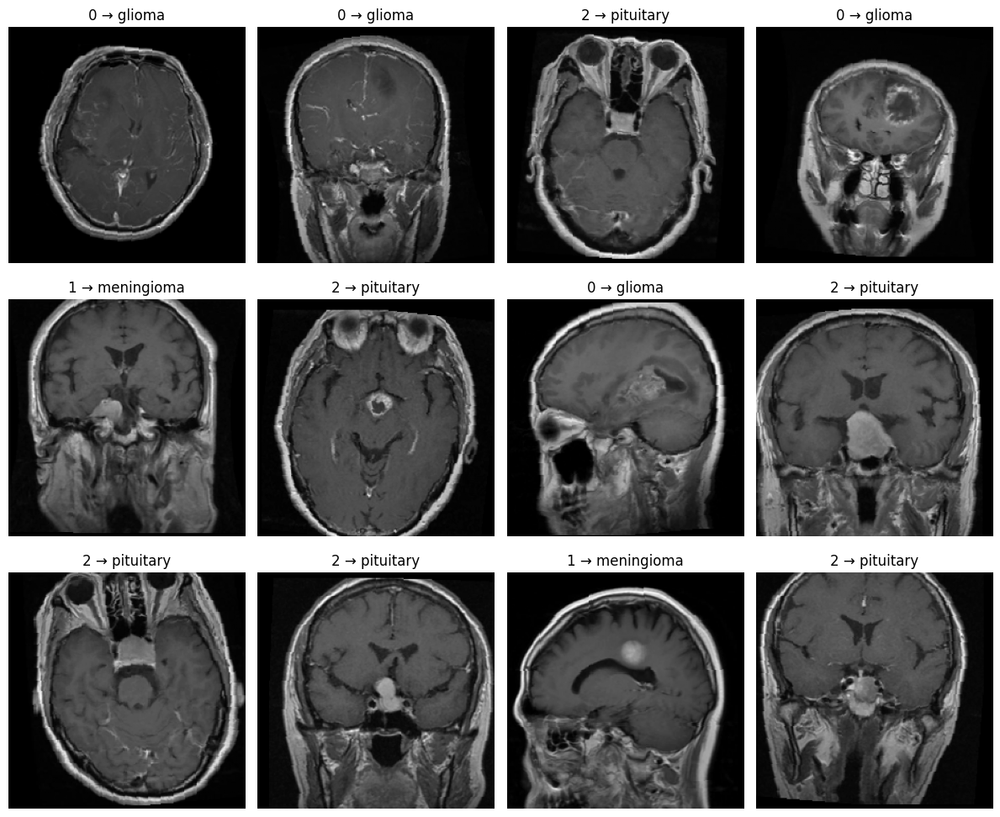


✓ Displayed 12 training images.
✓ Images are shown after V2 preprocessing.
✓ Grayscale conversion verified visually.
✓ Normalization was reversed only for visualization.

VISUAL CHECK COMPLETE


In [29]:
# ============================================================
# MODEL 3A — VISUAL VERIFY V2 PREPROCESSING
# ============================================================

import matplotlib.pyplot as plt
import torch

print("=" * 70)
print("MODEL 3A — VISUAL CHECK OF V2 PREPROCESSING")
print("=" * 70)

# ------------------------------------------------------------
# Get one batch
# ------------------------------------------------------------

images, labels = next(
    iter(train_loader_v2)
)

# ------------------------------------------------------------
# ImageNet normalization values
# Undo normalization for visualization
# ------------------------------------------------------------

mean = torch.tensor(
    [0.485, 0.456, 0.406]
).view(3, 1, 1)

std = torch.tensor(
    [0.229, 0.224, 0.225]
).view(3, 1, 1)

images_display = (
    images.cpu() * std + mean
)

images_display = torch.clamp(
    images_display,
    0,
    1
)

# ------------------------------------------------------------
# Display 12 images
# ------------------------------------------------------------

fig, axes = plt.subplots(
    3,
    4,
    figsize=(12, 10)
)

for i, ax in enumerate(
    axes.flat
):

    image = images_display[i]

    # Since grayscale was converted to 3 identical channels,
    # display only the first channel.
    ax.imshow(
        image[0].numpy(),
        cmap="gray"
    )

    class_id = int(
        labels[i].item()
    )

    class_name = CLASS_NAMES_V2[
        class_id
    ]

    ax.set_title(
        f"{class_id} → {class_name}"
    )

    ax.axis("off")

plt.tight_layout()

plt.show()

print("\n✓ Displayed 12 training images.")
print("✓ Images are shown after V2 preprocessing.")
print("✓ Grayscale conversion verified visually.")
print("✓ Normalization was reversed only for visualization.")

print("\n" + "=" * 70)
print("VISUAL CHECK COMPLETE")
print("=" * 70)

In [30]:
# ============================================================
# MODEL 3A — V2 EFFICIENTNET-B0 ARCHITECTURE
# ============================================================

import torch
import torch.nn as nn
from torchvision.models import (
    efficientnet_b0,
    EfficientNet_B0_Weights
)

print("=" * 70)
print("MODEL 3A — V2 MODEL ARCHITECTURE")
print("=" * 70)

# ============================================================
# DEVICE
# ============================================================

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("\nDevice:", device)

if torch.cuda.is_available():
    print(
        "GPU:",
        torch.cuda.get_device_name(0)
    )

# ============================================================
# LOAD IMAGENET-PRETRAINED EFFICIENTNET-B0
# ============================================================

weights = EfficientNet_B0_Weights.IMAGENET1K_V1

model_v2 = efficientnet_b0(
    weights=weights
)

print("\nOriginal classifier:")
print(
    model_v2.classifier
)

# ============================================================
# REPLACE CLASSIFIER
#
# 3 classes:
#   0 -> glioma
#   1 -> meningioma
#   2 -> pituitary
# ============================================================

NUM_CLASSES_V2 = 3

in_features = (
    model_v2.classifier[1].in_features
)

model_v2.classifier = nn.Sequential(
    nn.Dropout(
        p=0.3
    ),
    nn.Linear(
        in_features,
        NUM_CLASSES_V2
    )
)

print("\nNew classifier:")
print(
    model_v2.classifier
)

# ============================================================
# MOVE TO GPU
# ============================================================

model_v2 = model_v2.to(device)

# ============================================================
# PARAMETER COUNTS
# ============================================================

total_params = sum(
    p.numel()
    for p in model_v2.parameters()
)

trainable_params = sum(
    p.numel()
    for p in model_v2.parameters()
    if p.requires_grad
)

# ============================================================
# SANITY CHECK
# ============================================================

dummy_input = torch.randn(
    2,
    3,
    224,
    224,
    device=device
)

with torch.no_grad():

    dummy_output = model_v2(
        dummy_input
    )

print("\n" + "=" * 70)
print("MODEL INFORMATION")
print("=" * 70)

print(
    "\nArchitecture : EfficientNet-B0"
)

print(
    "Input        : 3 × 224 × 224"
)

print(
    "Output       : 3 classes"
)

print(
    "Classes      :",
    CLASS_NAMES_V2
)

print(
    "Device       :",
    device
)

print("\nParameters:")

print(
    f"  Total     : {total_params:,}"
)

print(
    f"  Trainable : {trainable_params:,}"
)

print("\nSanity check:")

print(
    "  Input shape :",
    dummy_input.shape
)

print(
    "  Output shape:",
    dummy_output.shape
)

assert dummy_output.shape == (
    2,
    3
)

assert total_params > 0
assert trainable_params > 0

print(
    "\n✓ EfficientNet-B0 loaded."
)

print(
    "✓ ImageNet pretrained weights loaded."
)

print(
    "✓ 3-class classifier installed."
)

print(
    "✓ Output shape verified: (2, 3)"
)

print("\n" + "=" * 70)
print("V2 MODEL ARCHITECTURE READY")
print("=" * 70)

MODEL 3A — V2 MODEL ARCHITECTURE

Device: cuda
GPU: Tesla T4

Original classifier:
Sequential(
  (0): Dropout(p=0.2, inplace=True)
  (1): Linear(in_features=1280, out_features=1000, bias=True)
)

New classifier:
Sequential(
  (0): Dropout(p=0.3, inplace=False)
  (1): Linear(in_features=1280, out_features=3, bias=True)
)

MODEL INFORMATION

Architecture : EfficientNet-B0
Input        : 3 × 224 × 224
Output       : 3 classes
Classes      : ['glioma', 'meningioma', 'pituitary']
Device       : cuda

Parameters:
  Total     : 4,011,391
  Trainable : 4,011,391

Sanity check:
  Input shape : torch.Size([2, 3, 224, 224])
  Output shape: torch.Size([2, 3])

✓ EfficientNet-B0 loaded.
✓ ImageNet pretrained weights loaded.
✓ 3-class classifier installed.
✓ Output shape verified: (2, 3)

V2 MODEL ARCHITECTURE READY


In [31]:
# ============================================================
# MODEL 3A — V2 STAGE 1 TRAINING CONFIGURATION
# ============================================================

import copy
import torch
import torch.nn as nn
import torch.optim as optim

print("=" * 70)
print("MODEL 3A — V2 STAGE 1 TRAINING CONFIGURATION")
print("=" * 70)

# ============================================================
# FREEZE BACKBONE
# ============================================================

for param in model_v2.features.parameters():
    param.requires_grad = False

# Classifier remains trainable
for param in model_v2.classifier.parameters():
    param.requires_grad = True


# ============================================================
# PARAMETER COUNTS
# ============================================================

total_params = sum(
    p.numel()
    for p in model_v2.parameters()
)

trainable_params = sum(
    p.numel()
    for p in model_v2.parameters()
    if p.requires_grad
)

print("\nBackbone frozen       : True")
print("Classifier trainable  : True")

print("\nParameters:")
print(
    f"  Total     : {total_params:,}"
)

print(
    f"  Trainable : {trainable_params:,}"
)


# ============================================================
# LOSS
# ============================================================

criterion_v2 = nn.CrossEntropyLoss()

print("\nLoss:")
print(
    criterion_v2
)


# ============================================================
# OPTIMIZER
# ============================================================

optimizer_v2 = optim.AdamW(
    model_v2.classifier.parameters(),
    lr=1e-3,
    weight_decay=1e-4
)

print("\nOptimizer:")
print(
    optimizer_v2
)


# ============================================================
# LEARNING-RATE SCHEDULER
# ============================================================

scheduler_v2 = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_v2,
    mode="min",
    factor=0.5,
    patience=2
)

print("\nScheduler:")
print(
    scheduler_v2
)


# ============================================================
# TRAINING SETTINGS
# ============================================================

STAGE1_EPOCHS = 8

best_val_accuracy_v2 = 0.0
best_val_loss_v2 = float("inf")

best_model_state_v2 = None

print("\nStage 1 epochs:")
print(
    STAGE1_EPOCHS
)


# ============================================================
# SANITY CHECK — TRAINABLE PARAMETERS
# ============================================================

trainable_parameter_names = [
    name
    for name, param in model_v2.named_parameters()
    if param.requires_grad
]

frozen_parameter_names = [
    name
    for name, param in model_v2.named_parameters()
    if not param.requires_grad
]

print("\nTrainable parameter groups:")

for name in trainable_parameter_names:
    print(
        f"  ✓ {name}"
    )

print(
    f"\nTrainable tensors: "
    f"{len(trainable_parameter_names)}"
)

print(
    f"Frozen tensors: "
    f"{len(frozen_parameter_names)}"
)


# ============================================================
# ASSERTIONS
# ============================================================

assert all(
    not param.requires_grad
    for param in model_v2.features.parameters()
)

assert all(
    param.requires_grad
    for param in model_v2.classifier.parameters()
)

assert trainable_params < total_params

assert STAGE1_EPOCHS == 8


print("\n✓ EfficientNet backbone is frozen.")
print("✓ Classifier is trainable.")
print("✓ AdamW configured.")
print("✓ CrossEntropyLoss configured.")
print("✓ ReduceLROnPlateau configured.")

print("\n" + "=" * 70)
print("V2 STAGE 1 CONFIGURATION READY")
print("=" * 70)

MODEL 3A — V2 STAGE 1 TRAINING CONFIGURATION

Backbone frozen       : True
Classifier trainable  : True

Parameters:
  Total     : 4,011,391
  Trainable : 3,843

Loss:
CrossEntropyLoss()

Optimizer:
AdamW (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: True
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.001
    maximize: False
    weight_decay: 0.0001
)

Scheduler:

Stage 1 epochs:
8

Trainable parameter groups:
  ✓ classifier.1.weight
  ✓ classifier.1.bias

Trainable tensors: 2
Frozen tensors: 211

✓ EfficientNet backbone is frozen.
✓ Classifier is trainable.
✓ AdamW configured.
✓ CrossEntropyLoss configured.
✓ ReduceLROnPlateau configured.

V2 STAGE 1 CONFIGURATION READY


In [32]:
# ============================================================
# MODEL 3A — V2 STAGE 1 TRAINING
# ============================================================

import time
import copy
import torch

print("=" * 70)
print("MODEL 3A — V2 STAGE 1 TRAINING")
print("=" * 70)


# ============================================================
# TRAINING FUNCTION
# ============================================================

def run_epoch(
    model,
    loader,
    criterion,
    optimizer=None,
    device="cuda"
):
    """
    Runs one training or validation epoch.
    """

    is_training = optimizer is not None

    if is_training:
        model.train()
    else:
        model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:

        images = images.to(
            device,
            non_blocking=True
        )

        labels = labels.to(
            device,
            non_blocking=True
        )

        # ----------------------------------------------------
        # Training
        # ----------------------------------------------------

        if is_training:
            optimizer.zero_grad(
                set_to_none=True
            )

        # ----------------------------------------------------
        # Forward pass
        # ----------------------------------------------------

        with torch.set_grad_enabled(
            is_training
        ):

            outputs = model(images)

            loss = criterion(
                outputs,
                labels
            )

            # ------------------------------------------------
            # Backpropagation
            # ------------------------------------------------

            if is_training:

                loss.backward()

                optimizer.step()

        # ----------------------------------------------------
        # Statistics
        # ----------------------------------------------------

        batch_size = images.size(0)

        running_loss += (
            loss.item() * batch_size
        )

        predictions = torch.argmax(
            outputs,
            dim=1
        )

        correct += (
            predictions == labels
        ).sum().item()

        total += batch_size

    epoch_loss = (
        running_loss / total
    )

    epoch_accuracy = (
        correct / total
    )

    return (
        epoch_loss,
        epoch_accuracy
    )


# ============================================================
# STAGE 1
# ============================================================

best_val_accuracy_v2 = 0.0
best_val_loss_v2 = float("inf")

best_model_state_v2 = copy.deepcopy(
    model_v2.state_dict()
)

stage1_history_v2 = []


for epoch in range(
    STAGE1_EPOCHS
):

    start_time = time.time()

    # --------------------------------------------------------
    # TRAIN
    # --------------------------------------------------------

    train_loss, train_accuracy = run_epoch(
        model=model_v2,
        loader=train_loader_v2,
        criterion=criterion_v2,
        optimizer=optimizer_v2,
        device=device
    )

    # --------------------------------------------------------
    # VALIDATION
    # --------------------------------------------------------

    val_loss, val_accuracy = run_epoch(
        model=model_v2,
        loader=val_loader_v2,
        criterion=criterion_v2,
        optimizer=None,
        device=device
    )

    # --------------------------------------------------------
    # Scheduler
    # --------------------------------------------------------

    scheduler_v2.step(
        val_loss
    )

    current_lr = (
        optimizer_v2.param_groups[0]["lr"]
    )

    elapsed = (
        time.time() - start_time
    )

    # --------------------------------------------------------
    # Save history
    # --------------------------------------------------------

    stage1_history_v2.append({
        "epoch": epoch + 1,
        "train_loss": train_loss,
        "train_accuracy": train_accuracy,
        "val_loss": val_loss,
        "val_accuracy": val_accuracy,
        "lr": current_lr
    })

    # --------------------------------------------------------
    # Best model
    # --------------------------------------------------------

    is_best = False

    if val_accuracy > best_val_accuracy_v2:

        best_val_accuracy_v2 = val_accuracy
        best_val_loss_v2 = val_loss

        best_model_state_v2 = copy.deepcopy(
            model_v2.state_dict()
        )

        is_best = True

    # --------------------------------------------------------
    # Print
    # --------------------------------------------------------

    best_marker = "  ← BEST" if is_best else ""

    print(
        f"Epoch {epoch + 1:02d}/{STAGE1_EPOCHS} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_accuracy * 100:.2f}% | "
        f"Val Loss: {val_loss:.4f} | "
        f"Val Acc: {val_accuracy * 100:.2f}% | "
        f"LR: {current_lr:.6f} | "
        f"Time: {elapsed:.1f}s"
        f"{best_marker}"
    )


# ============================================================
# RESTORE BEST MODEL
# ============================================================

model_v2.load_state_dict(
    best_model_state_v2
)

model_v2.eval()


# ============================================================
# FINAL STAGE 1 RESULT
# ============================================================

print("\n" + "=" * 70)
print("STAGE 1 COMPLETE")
print("=" * 70)

print(
    f"Best validation accuracy: "
    f"{best_val_accuracy_v2 * 100:.2f}%"
)

print(
    f"Best validation loss: "
    f"{best_val_loss_v2:.4f}"
)

print(
    "Best model restored."
)

print("=" * 70)

MODEL 3A — V2 STAGE 1 TRAINING
Epoch 01/8 | Train Loss: 0.5976 | Train Acc: 79.15% | Val Loss: 0.4508 | Val Acc: 83.57% | LR: 0.001000 | Time: 29.6s  ← BEST
Epoch 02/8 | Train Loss: 0.4255 | Train Acc: 84.74% | Val Loss: 0.3881 | Val Acc: 85.00% | LR: 0.001000 | Time: 29.5s  ← BEST
Epoch 03/8 | Train Loss: 0.3775 | Train Acc: 86.48% | Val Loss: 0.3556 | Val Acc: 86.67% | LR: 0.001000 | Time: 29.3s  ← BEST
Epoch 04/8 | Train Loss: 0.3643 | Train Acc: 86.77% | Val Loss: 0.3383 | Val Acc: 87.14% | LR: 0.001000 | Time: 30.4s  ← BEST
Epoch 05/8 | Train Loss: 0.3584 | Train Acc: 86.43% | Val Loss: 0.3245 | Val Acc: 87.38% | LR: 0.001000 | Time: 30.2s  ← BEST
Epoch 06/8 | Train Loss: 0.3495 | Train Acc: 87.22% | Val Loss: 0.3244 | Val Acc: 88.10% | LR: 0.001000 | Time: 29.5s  ← BEST
Epoch 07/8 | Train Loss: 0.3318 | Train Acc: 87.57% | Val Loss: 0.3115 | Val Acc: 89.05% | LR: 0.001000 | Time: 30.7s  ← BEST
Epoch 08/8 | Train Loss: 0.3606 | Train Acc: 86.88% | Val Loss: 0.3080 | Val Acc: 89.29

In [33]:
# ============================================================
# MODEL 3A — V2 STAGE 2 FINE-TUNING CONFIGURATION
# ============================================================

import torch
import torch.nn as nn
import torch.optim as optim

print("=" * 70)
print("MODEL 3A — V2 STAGE 2 FINE-TUNING CONFIGURATION")
print("=" * 70)

# ============================================================
# START FROM BEST STAGE 1 MODEL
# ============================================================

model_v2.load_state_dict(
    best_model_state_v2
)

# ============================================================
# FREEZE EVERYTHING FIRST
# ============================================================

for param in model_v2.parameters():
    param.requires_grad = False


# ============================================================
# UNFREEZE LAST EFFICIENTNET BLOCKS
#
# EfficientNet-B0:
#
# features.0 -> features.5 : frozen
# features.6 -> features.8 : fine-tuned
# ============================================================

for block_id in [6, 7, 8]:

    for param in model_v2.features[
        block_id
    ].parameters():

        param.requires_grad = True


# ============================================================
# KEEP BATCH NORMALIZATION FROZEN
# ============================================================

for module in model_v2.modules():

    if isinstance(
        module,
        nn.BatchNorm2d
    ):

        module.eval()

        for param in module.parameters():
            param.requires_grad = False


# ============================================================
# CLASSIFIER TRAINABLE
# ============================================================

for param in model_v2.classifier.parameters():

    param.requires_grad = True


# ============================================================
# PARAMETER COUNTS
# ============================================================

total_params_v2 = sum(
    p.numel()
    for p in model_v2.parameters()
)

trainable_params_v2 = sum(
    p.numel()
    for p in model_v2.parameters()
    if p.requires_grad
)

print("\nArchitecture:")
print("  EfficientNet-B0")

print("\nFine-tuned blocks:")
print("  features.6")
print("  features.7")
print("  features.8")

print("\nFrozen:")
print("  features.0 → features.5")
print("  BatchNorm layers")

print("\nParameters:")
print(
    f"  Total     : {total_params_v2:,}"
)

print(
    f"  Trainable : {trainable_params_v2:,}"
)


# ============================================================
# LOSS
# ============================================================

criterion_v2 = nn.CrossEntropyLoss()


# ============================================================
# SEPARATE LEARNING RATES
# ============================================================

backbone_parameters = []

for block_id in [6, 7, 8]:

    backbone_parameters.extend(
        list(
            model_v2.features[
                block_id
            ].parameters()
        )
    )


classifier_parameters = list(
    model_v2.classifier.parameters()
)


# ============================================================
# OPTIMIZER
# ============================================================

optimizer_stage2_v2 = optim.AdamW(
    [
        {
            "params": backbone_parameters,
            "lr": 1e-5
        },
        {
            "params": classifier_parameters,
            "lr": 1e-4
        }
    ],
    weight_decay=1e-4
)


# ============================================================
# SCHEDULER
# ============================================================

scheduler_stage2_v2 = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_stage2_v2,
    mode="min",
    factor=0.5,
    patience=2
)


# ============================================================
# TRAINING SETTINGS
# ============================================================

STAGE2_EPOCHS_V2 = 15
STAGE2_PATIENCE_V2 = 5

best_stage2_accuracy_v2 = (
    best_val_accuracy_v2
)

best_stage2_loss_v2 = (
    best_val_loss_v2
)

best_stage2_model_state_v2 = (
    copy.deepcopy(
        model_v2.state_dict()
    )
)

epochs_without_improvement_v2 = 0


# ============================================================
# DISPLAY LR
# ============================================================

print("\nOptimizer:")
print(
    optimizer_stage2_v2
)

print("\nInitial learning rates:")
print(
    f"  Backbone   : "
    f"{optimizer_stage2_v2.param_groups[0]['lr']:.1e}"
)

print(
    f"  Classifier : "
    f"{optimizer_stage2_v2.param_groups[1]['lr']:.1e}"
)

print("\nStage 2 maximum epochs:")
print(
    STAGE2_EPOCHS_V2
)

print("\nEarly stopping patience:")
print(
    STAGE2_PATIENCE_V2
)

print("\nStarting validation accuracy:")
print(
    f"{best_val_accuracy_v2 * 100:.2f}%"
)


# ============================================================
# SANITY CHECK
# ============================================================

assert not any(
    p.requires_grad
    for p in model_v2.features[
        0:6
    ].parameters()
)

assert any(
    p.requires_grad
    for p in model_v2.features[
        6
    ].parameters()
)

assert any(
    p.requires_grad
    for p in model_v2.features[
        7
    ].parameters()
)

assert any(
    p.requires_grad
    for p in model_v2.features[
        8
    ].parameters()
)

assert all(
    p.requires_grad
    for p in model_v2.classifier.parameters()
)


print("\n✓ Early EfficientNet blocks frozen.")
print("✓ Last three blocks unfrozen.")
print("✓ BatchNorm layers frozen.")
print("✓ Classifier trainable.")
print("✓ Differential learning rates configured.")
print("✓ Best Stage 1 model loaded.")

print("\n" + "=" * 70)
print("V2 STAGE 2 CONFIGURATION READY")
print("=" * 70)

MODEL 3A — V2 STAGE 2 FINE-TUNING CONFIGURATION

Architecture:
  EfficientNet-B0

Fine-tuned blocks:
  features.6
  features.7
  features.8

Frozen:
  features.0 → features.5
  BatchNorm layers

Parameters:
  Total     : 4,011,391
  Trainable : 3,133,727

Optimizer:
AdamW (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: True
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 1e-05
    maximize: False
    weight_decay: 0.0001

Parameter Group 1
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: True
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0.0001
)

Initial learning rates:
  Backbone   : 1.0e-05
  Classifier : 1.0e-04

Stage 2 maximum epochs:
15

Early stopping patience:
5

Starting validation accuracy:
89.29%

✓ Early EfficientNet blocks frozen.
✓ Last three blocks

In [34]:
# ============================================================
# MODEL 3A — V2 STAGE 2 FINE-TUNING
# ============================================================

import time
import copy
import torch

print("=" * 70)
print("MODEL 3A — V2 STAGE 2 FINE-TUNING")
print("=" * 70)

best_stage2_accuracy_v2 = best_val_accuracy_v2
best_stage2_loss_v2 = best_val_loss_v2

best_stage2_model_state_v2 = copy.deepcopy(
    model_v2.state_dict()
)

epochs_without_improvement_v2 = 0

stage2_history_v2 = []


for epoch in range(STAGE2_EPOCHS_V2):

    start_time = time.time()

    # --------------------------------------------------------
    # TRAIN
    # --------------------------------------------------------

    train_loss, train_accuracy = run_epoch(
        model=model_v2,
        loader=train_loader_v2,
        criterion=criterion_v2,
        optimizer=optimizer_stage2_v2,
        device=device
    )

    # --------------------------------------------------------
    # VALIDATION
    # --------------------------------------------------------

    val_loss, val_accuracy = run_epoch(
        model=model_v2,
        loader=val_loader_v2,
        criterion=criterion_v2,
        optimizer=None,
        device=device
    )

    # --------------------------------------------------------
    # LR SCHEDULER
    # --------------------------------------------------------

    scheduler_stage2_v2.step(
        val_loss
    )

    backbone_lr = (
        optimizer_stage2_v2
        .param_groups[0]["lr"]
    )

    classifier_lr = (
        optimizer_stage2_v2
        .param_groups[1]["lr"]
    )

    elapsed = time.time() - start_time

    # --------------------------------------------------------
    # SAVE HISTORY
    # --------------------------------------------------------

    stage2_history_v2.append({
        "epoch": epoch + 1,
        "train_loss": train_loss,
        "train_accuracy": train_accuracy,
        "val_loss": val_loss,
        "val_accuracy": val_accuracy,
        "backbone_lr": backbone_lr,
        "classifier_lr": classifier_lr
    })

    # --------------------------------------------------------
    # CHECK BEST MODEL
    # --------------------------------------------------------

    is_best = False

    if val_accuracy > best_stage2_accuracy_v2:

        best_stage2_accuracy_v2 = val_accuracy
        best_stage2_loss_v2 = val_loss

        best_stage2_model_state_v2 = copy.deepcopy(
            model_v2.state_dict()
        )

        epochs_without_improvement_v2 = 0

        is_best = True

    else:

        epochs_without_improvement_v2 += 1

    # --------------------------------------------------------
    # PRINT
    # --------------------------------------------------------

    best_marker = "  ← BEST" if is_best else ""

    print(
        f"Epoch {epoch + 1:02d}/{STAGE2_EPOCHS_V2} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_accuracy * 100:.2f}% | "
        f"Val Loss: {val_loss:.4f} | "
        f"Val Acc: {val_accuracy * 100:.2f}% | "
        f"Backbone LR: {backbone_lr:.1e} | "
        f"Classifier LR: {classifier_lr:.1e} | "
        f"Time: {elapsed:.1f}s"
        f"{best_marker}"
    )

    # --------------------------------------------------------
    # EARLY STOPPING
    # --------------------------------------------------------

    if (
        epochs_without_improvement_v2
        >= STAGE2_PATIENCE_V2
    ):

        print(
            f"\nEarly stopping triggered after "
            f"{epoch + 1} epochs."
        )

        break


# ============================================================
# RESTORE BEST MODEL
# ============================================================

model_v2.load_state_dict(
    best_stage2_model_state_v2
)

model_v2.eval()


# ============================================================
# FINAL RESULT
# ============================================================

print("\n" + "=" * 70)
print("STAGE 2 COMPLETE")
print("=" * 70)

print(
    f"Stage 1 best validation accuracy: "
    f"{best_val_accuracy_v2 * 100:.2f}%"
)

print(
    f"Stage 2 best validation accuracy: "
    f"{best_stage2_accuracy_v2 * 100:.2f}%"
)

print(
    f"Stage 2 best validation loss: "
    f"{best_stage2_loss_v2:.4f}"
)

improvement = (
    best_stage2_accuracy_v2
    - best_val_accuracy_v2
) * 100

print(
    f"Improvement over Stage 1: "
    f"{improvement:+.2f} percentage points"
)

print(
    "\nBest Stage 2 model restored."
)

print("=" * 70)

MODEL 3A — V2 STAGE 2 FINE-TUNING
Epoch 01/15 | Train Loss: 0.3168 | Train Acc: 87.80% | Val Loss: 0.2768 | Val Acc: 90.00% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 30.4s  ← BEST
Epoch 02/15 | Train Loss: 0.2951 | Train Acc: 88.52% | Val Loss: 0.2597 | Val Acc: 90.95% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 30.6s  ← BEST
Epoch 03/15 | Train Loss: 0.2583 | Train Acc: 90.74% | Val Loss: 0.2376 | Val Acc: 92.86% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 31.3s  ← BEST
Epoch 04/15 | Train Loss: 0.2622 | Train Acc: 90.48% | Val Loss: 0.2306 | Val Acc: 92.62% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 30.5s
Epoch 05/15 | Train Loss: 0.2418 | Train Acc: 90.61% | Val Loss: 0.2150 | Val Acc: 93.57% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 30.5s  ← BEST
Epoch 06/15 | Train Loss: 0.2248 | Train Acc: 91.48% | Val Loss: 0.2006 | Val Acc: 94.05% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 30.8s  ← BEST
Epoch 07/15 | 

In [35]:
# ============================================================
# MODEL 3A — V2 FINAL TEST EVALUATION
# ============================================================

import torch
import numpy as np
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix
)

print("=" * 70)
print("MODEL 3A — V2 FINAL TEST SET EVALUATION")
print("=" * 70)

# ============================================================
# BEST MODEL
# ============================================================

model_v2.load_state_dict(
    best_stage2_model_state_v2
)

model_v2.eval()

# ============================================================
# PREDICTIONS
# ============================================================

all_predictions_v2 = []
all_true_labels_v2 = []
all_confidences_v2 = []

with torch.no_grad():

    for images, labels in test_loader_v2:

        images = images.to(
            device,
            non_blocking=True
        )

        outputs = model_v2(images)

        probabilities = torch.softmax(
            outputs,
            dim=1
        )

        predictions = torch.argmax(
            probabilities,
            dim=1
        )

        confidences = torch.max(
            probabilities,
            dim=1
        ).values

        all_predictions_v2.extend(
            predictions.cpu().numpy()
        )

        all_true_labels_v2.extend(
            labels.numpy()
        )

        all_confidences_v2.extend(
            confidences.cpu().numpy()
        )


# ============================================================
# NUMPY
# ============================================================

y_true_v2 = np.array(
    all_true_labels_v2
)

y_pred_v2 = np.array(
    all_predictions_v2
)

confidences_v2 = np.array(
    all_confidences_v2
)

# ============================================================
# ACCURACY
# ============================================================

test_accuracy_v2 = accuracy_score(
    y_true_v2,
    y_pred_v2
)

# ============================================================
# CLASSIFICATION REPORT
# ============================================================

report_v2 = classification_report(
    y_true_v2,
    y_pred_v2,
    target_names=CLASS_NAMES_V2,
    digits=4
)

# ============================================================
# CONFUSION MATRIX
# ============================================================

cm_v2 = confusion_matrix(
    y_true_v2,
    y_pred_v2
)

# ============================================================
# OUTPUT
# ============================================================

print("\n" + "=" * 70)
print("MODEL 3A — V2 TEST RESULTS")
print("=" * 70)

print(
    f"\nOverall Test Accuracy: "
    f"{test_accuracy_v2 * 100:.2f}%"
)

print(
    "\nClassification Report:"
)

print(
    report_v2
)

print(
    "\nConfusion Matrix:"
)

print(
    "Rows    = Actual"
)

print(
    "Columns = Predicted"
)

print(
    f"\n{'':15s}"
    f"{'glioma':15s}"
    f"{'meningioma':15s}"
    f"{'pituitary':15s}"
)

for i, class_name in enumerate(
    CLASS_NAMES_V2
):

    print(
        f"{class_name:15s}"
        f"{cm_v2[i, 0]:<15}"
        f"{cm_v2[i, 1]:<15}"
        f"{cm_v2[i, 2]:<15}"
    )

# ============================================================
# PER-CLASS ACCURACY
# ============================================================

print("\nPer-class accuracy:")

for i, class_name in enumerate(
    CLASS_NAMES_V2
):

    class_total = cm_v2[i].sum()

    class_correct = cm_v2[i, i]

    class_accuracy = (
        class_correct /
        class_total
    )

    print(
        f"  {class_name:12s}: "
        f"{class_accuracy * 100:.2f}% "
        f"({class_correct}/{class_total})"
    )

# ============================================================
# CONFIDENCE
# ============================================================

mean_confidence_v2 = (
    confidences_v2.mean()
)

print(
    f"\nMean prediction confidence: "
    f"{mean_confidence_v2:.4f}"
)

# ============================================================
# MOST IMPORTANT METRIC
# GLIOMA -> MENINGIOMA
# ============================================================

glioma_to_meningioma = cm_v2[0, 1]

meningioma_to_glioma = cm_v2[1, 0]

glioma_to_pituitary = cm_v2[0, 2]

print("\n" + "=" * 70)
print("GLIOMA CONFUSION ANALYSIS")
print("=" * 70)

print(
    f"\nActual Glioma → Meningioma: "
    f"{glioma_to_meningioma}"
)

print(
    f"Actual Glioma → Pituitary: "
    f"{glioma_to_pituitary}"
)

print(
    f"Actual Meningioma → Glioma: "
    f"{meningioma_to_glioma}"
)

print("\n" + "=" * 70)
print("V2 TEST EVALUATION COMPLETE")
print("=" * 70)

MODEL 3A — V2 FINAL TEST SET EVALUATION

MODEL 3A — V2 TEST RESULTS

Overall Test Accuracy: 89.83%

Classification Report:
              precision    recall  f1-score   support

      glioma     0.9934    0.7475    0.8531       400
  meningioma     0.7923    0.9725    0.8732       400
   pituitary     0.9559    0.9750    0.9653       400

    accuracy                         0.8983      1200
   macro avg     0.9138    0.8983    0.8972      1200
weighted avg     0.9138    0.8983    0.8972      1200


Confusion Matrix:
Rows    = Actual
Columns = Predicted

               glioma         meningioma     pituitary      
glioma         299            93             8              
meningioma     1              389            10             
pituitary      1              9              390            

Per-class accuracy:
  glioma      : 74.75% (299/400)
  meningioma  : 97.25% (389/400)
  pituitary   : 97.50% (390/400)

Mean prediction confidence: 0.9308

GLIOMA CONFUSION ANALYSIS

Actual Glio

In [36]:
# ============================================================
# CHECK WHAT MODELS ARE CURRENTLY AVAILABLE
# ============================================================

print("=" * 70)
print("AVAILABLE MODEL OBJECTS")
print("=" * 70)

print("\nmodel_v2:")
print(
    "Exists:",
    "model_v2" in globals()
)

print("\nbest_stage2_model_state_v2:")
print(
    "Exists:",
    "best_stage2_model_state_v2" in globals()
)

print("\nbest_model_state_v2:")
print(
    "Exists:",
    "best_model_state_v2" in globals()
)

print("\nV2 test predictions:")
print(
    "Exists:",
    "y_pred_v2" in globals()
)

print(
    "\n" + "=" * 70
)

AVAILABLE MODEL OBJECTS

model_v2:
Exists: True

best_stage2_model_state_v2:
Exists: True

best_model_state_v2:
Exists: True

V2 test predictions:
Exists: True



In [37]:
# ============================================================
# MODEL 3A — GLIOMA ERROR CONFIDENCE ANALYSIS V2
# ============================================================

import torch
import numpy as np

print("=" * 70)
print("MODEL 3A — GLIOMA ERROR CONFIDENCE ANALYSIS")
print("=" * 70)

model_v2.load_state_dict(
    best_stage2_model_state_v2
)

model_v2.eval()

glioma_true = []
glioma_pred = []
glioma_probs = []
glioma_paths = []

# ------------------------------------------------------------
# We need the original paths from the test dataset
# ------------------------------------------------------------

for idx, (path, old_label) in enumerate(
    test_samples_clean
):

    # old_label:
    # 0 = glioma
    # 1 = meningioma
    # 3 = pituitary

    new_label = OLD_TO_NEW[
        old_label
    ]

    if new_label != 0:
        continue

    # Load image using the exact SAME preprocessing
    from PIL import Image

    image = Image.open(
        path
    ).convert("RGB")

    tensor = eval_transforms_v2(
        image
    ).unsqueeze(0).to(device)

    with torch.no_grad():

        output = model_v2(
            tensor
        )

        probability = torch.softmax(
            output,
            dim=1
        )[0]

    prediction = int(
        torch.argmax(
            probability
        ).item()
    )

    glioma_true.append(
        new_label
    )

    glioma_pred.append(
        prediction
    )

    glioma_probs.append(
        probability.cpu().numpy()
    )

    glioma_paths.append(
        path
    )


glioma_probs = np.array(
    glioma_probs
)

glioma_pred = np.array(
    glioma_pred
)

# ============================================================
# CONFIDENCE ANALYSIS
# ============================================================

print(
    f"\nTotal Glioma test images: "
    f"{len(glioma_pred)}"
)

correct_mask = (
    glioma_pred == 0
)

wrong_mask = (
    glioma_pred != 0
)

print(
    f"Correct Glioma: "
    f"{correct_mask.sum()}"
)

print(
    f"Misclassified Glioma: "
    f"{wrong_mask.sum()}"
)

# ============================================================
# CORRECT GLIOMA
# ============================================================

correct_probs = glioma_probs[
    correct_mask
]

correct_confidence = (
    correct_probs[:, 0]
)

print("\n" + "-" * 70)
print("CORRECT GLIOMA")
print("-" * 70)

print(
    f"Mean P(Glioma): "
    f"{correct_confidence.mean():.4f}"
)

print(
    f"Min P(Glioma): "
    f"{correct_confidence.min():.4f}"
)

print(
    f"Max P(Glioma): "
    f"{correct_confidence.max():.4f}"
)

# ============================================================
# WRONG GLIOMA
# ============================================================

wrong_probs = glioma_probs[
    wrong_mask
]

wrong_predictions = glioma_pred[
    wrong_mask
]

wrong_confidence = np.max(
    wrong_probs,
    axis=1
)

wrong_glioma_probability = (
    wrong_probs[:, 0]
)

print("\n" + "-" * 70)
print("MISCLASSIFIED GLIOMA")
print("-" * 70)

print(
    f"Mean P(Glioma): "
    f"{wrong_glioma_probability.mean():.4f}"
)

print(
    f"Min P(Glioma): "
    f"{wrong_glioma_probability.min():.4f}"
)

print(
    f"Max P(Glioma): "
    f"{wrong_glioma_probability.max():.4f}"
)

print(
    f"Mean winning confidence: "
    f"{wrong_confidence.mean():.4f}"
)

# ============================================================
# GLIOMA → MENINGIOMA
# ============================================================

g_to_m = (
    glioma_pred == 1
)

g_to_p = (
    glioma_pred == 2
)

print("\n" + "-" * 70)
print("CONFUSION BREAKDOWN")
print("-" * 70)

print(
    f"Glioma → Meningioma: "
    f"{g_to_m.sum()}"
)

print(
    f"Glioma → Pituitary: "
    f"{g_to_p.sum()}"
)

# ============================================================
# GLIOMA → MENINGIOMA CONFIDENCE
# ============================================================

g_m_probs = glioma_probs[
    g_to_m
]

if len(g_m_probs) > 0:

    print(
        "\nGlioma → Meningioma:"
    )

    print(
        f"  Mean P(Glioma): "
        f"{g_m_probs[:, 0].mean():.4f}"
    )

    print(
        f"  Mean P(Meningioma): "
        f"{g_m_probs[:, 1].mean():.4f}"
    )

    print(
        f"  Min P(Glioma): "
        f"{g_m_probs[:, 0].min():.4f}"
    )

    print(
        f"  Max P(Glioma): "
        f"{g_m_probs[:, 0].max():.4f}"
    )

# ============================================================
# PROBABILITY THRESHOLDS
# ============================================================

print("\n" + "-" * 70)
print("GLIOMA PROBABILITY DISTRIBUTION")
print("-" * 70)

for threshold in [
    0.10,
    0.20,
    0.30,
    0.40,
    0.50,
    0.60,
    0.70,
    0.80,
    0.90
]:

    count = (
        glioma_probs[:, 0]
        < threshold
    ).sum()

    print(
        f"P(Glioma) < {threshold:.2f}: "
        f"{count}/400"
    )

print("\n" + "=" * 70)
print("ANALYSIS COMPLETE")
print("=" * 70)

MODEL 3A — GLIOMA ERROR CONFIDENCE ANALYSIS

Total Glioma test images: 400
Correct Glioma: 299
Misclassified Glioma: 101

----------------------------------------------------------------------
CORRECT GLIOMA
----------------------------------------------------------------------
Mean P(Glioma): 0.9328
Min P(Glioma): 0.4535
Max P(Glioma): 1.0000

----------------------------------------------------------------------
MISCLASSIFIED GLIOMA
----------------------------------------------------------------------
Mean P(Glioma): 0.1209
Min P(Glioma): 0.0000
Max P(Glioma): 0.4974
Mean winning confidence: 0.8170

----------------------------------------------------------------------
CONFUSION BREAKDOWN
----------------------------------------------------------------------
Glioma → Meningioma: 93
Glioma → Pituitary: 8

Glioma → Meningioma:
  Mean P(Glioma): 0.1251
  Mean P(Meningioma): 0.8382
  Min P(Glioma): 0.0000
  Max P(Glioma): 0.4974

---------------------------------------------------------

In [38]:
# ============================================================
# MODEL 3A — FIND STRONGLY CONFUSED TRAINING GLIOMAS
# ============================================================

import torch
import numpy as np
from PIL import Image

print("=" * 70)
print("MODEL 3A — TRAINING GLIOMA CONFUSION AUDIT")
print("=" * 70)

model_v2.load_state_dict(
    best_stage2_model_state_v2
)

model_v2.eval()

training_glioma_results = []

# ------------------------------------------------------------
# Evaluate ONLY training Glioma images
# Use deterministic preprocessing
# ------------------------------------------------------------

for path, old_label in train_samples_clean:

    new_label = OLD_TO_NEW[old_label]

    if new_label != 0:
        continue

    image = Image.open(
        path
    ).convert("RGB")

    tensor = eval_transforms_v2(
        image
    ).unsqueeze(0).to(device)

    with torch.no_grad():

        output = model_v2(tensor)

        probs = torch.softmax(
            output,
            dim=1
        )[0]

    pred = int(
        torch.argmax(probs).item()
    )

    training_glioma_results.append({
        "path": path,
        "glioma": float(probs[0].item()),
        "meningioma": float(probs[1].item()),
        "pituitary": float(probs[2].item()),
        "prediction": pred
    })


# ============================================================
# SORT BY MENINGIOMA PROBABILITY
# ============================================================

training_glioma_results.sort(
    key=lambda x: x["meningioma"],
    reverse=True
)

# ============================================================
# SUMMARY
# ============================================================

total = len(
    training_glioma_results
)

pred_glioma = sum(
    r["prediction"] == 0
    for r in training_glioma_results
)

pred_meningioma = sum(
    r["prediction"] == 1
    for r in training_glioma_results
)

pred_pituitary = sum(
    r["prediction"] == 2
    for r in training_glioma_results
)

print(
    f"\nTraining Glioma images: {total}"
)

print(
    f"Predicted Glioma      : {pred_glioma}"
)

print(
    f"Predicted Meningioma  : {pred_meningioma}"
)

print(
    f"Predicted Pituitary   : {pred_pituitary}"
)

# ============================================================
# STRONG CONFUSION COUNTS
# ============================================================

print("\n" + "-" * 70)
print("STRONGLY CONFUSED TRAINING GLIOMAS")
print("-" * 70)

for threshold in [
    0.50,
    0.70,
    0.80,
    0.90,
    0.95,
    0.99
]:

    count = sum(
        r["meningioma"] >= threshold
        for r in training_glioma_results
    )

    print(
        f"P(Meningioma) >= {threshold:.2f}: "
        f"{count}/{total}"
    )

# ============================================================
# TOP 30
# ============================================================

print("\n" + "-" * 70)
print("TOP 30 GLIOMA TRAINING IMAGES MOST CONFUSED AS MENINGIOMA")
print("-" * 70)

for i, r in enumerate(
    training_glioma_results[:30],
    start=1
):

    print(
        f"{i:02d}. "
        f"M={r['meningioma']:.4f} | "
        f"G={r['glioma']:.4f} | "
        f"P={r['pituitary']:.4f} | "
        f"{r['path']}"
    )

print("\n" + "=" * 70)
print("TRAINING GLIOMA AUDIT COMPLETE")
print("=" * 70)

MODEL 3A — TRAINING GLIOMA CONFUSION AUDIT

Training Glioma images: 1400
Predicted Glioma      : 1333
Predicted Meningioma  : 66
Predicted Pituitary   : 1

----------------------------------------------------------------------
STRONGLY CONFUSED TRAINING GLIOMAS
----------------------------------------------------------------------
P(Meningioma) >= 0.50: 66/1400
P(Meningioma) >= 0.70: 33/1400
P(Meningioma) >= 0.80: 20/1400
P(Meningioma) >= 0.90: 10/1400
P(Meningioma) >= 0.95: 5/1400
P(Meningioma) >= 0.99: 0/1400

----------------------------------------------------------------------
TOP 30 GLIOMA TRAINING IMAGES MOST CONFUSED AS MENINGIOMA
----------------------------------------------------------------------
01. M=0.9853 | G=0.0144 | P=0.0003 | /content/data/Training/glioma/Tr-gl_1198.jpg
02. M=0.9835 | G=0.0142 | P=0.0022 | /content/data/Training/glioma/Tr-gl_487.jpg
03. M=0.9610 | G=0.0389 | P=0.0001 | /content/data/Training/glioma/Tr-gl_422.jpg
04. M=0.9549 | G=0.0416 | P=0.0035 | /

MODEL 3A — DIFFICULT TRAINING GLIOMA VISUALIZATION


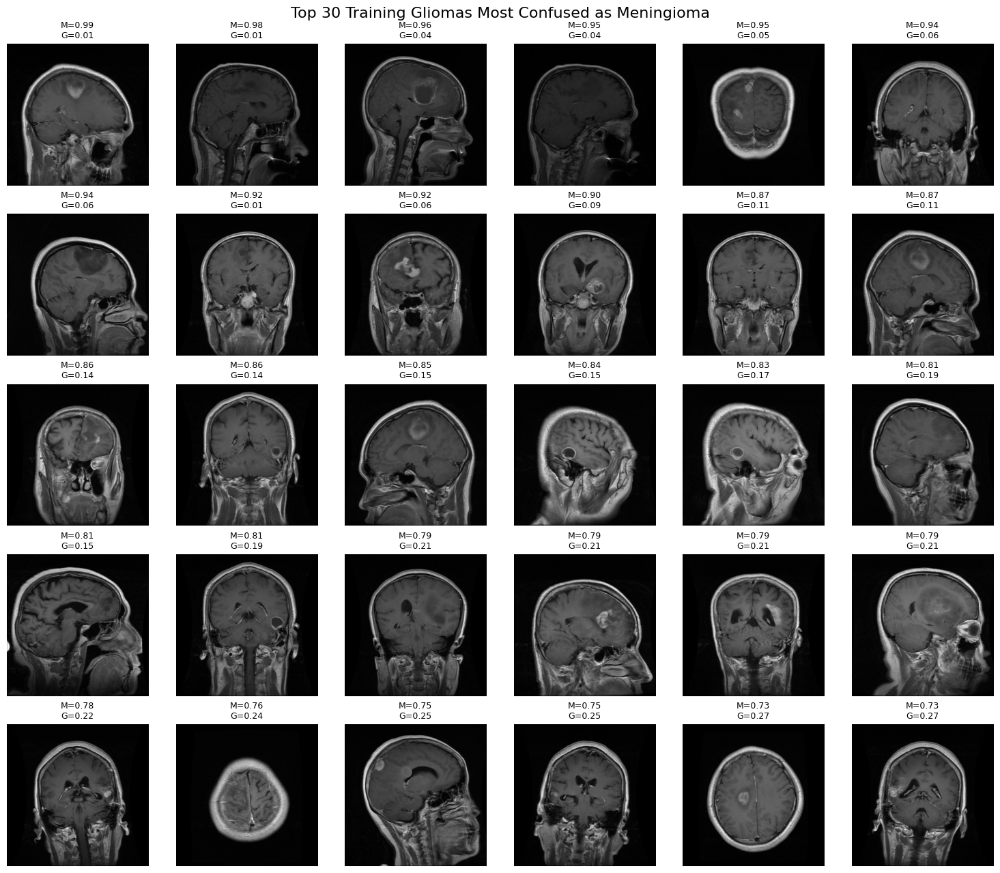


✓ Displayed the 30 most difficult training Gliomas.
Compare their visual appearance with the Glioma test images that were classified as Meningioma.



In [39]:
# ============================================================
# MODEL 3A — VISUALIZE DIFFICULT TRAINING GLIOMAS
# ============================================================

import matplotlib.pyplot as plt
from PIL import Image

print("=" * 70)
print("MODEL 3A — DIFFICULT TRAINING GLIOMA VISUALIZATION")
print("=" * 70)

TOP_N = 30

top_training_errors = (
    training_glioma_results[:TOP_N]
)

fig, axes = plt.subplots(
    5,
    6,
    figsize=(15, 13)
)

for i, (ax, result) in enumerate(
    zip(
        axes.flat,
        top_training_errors
    )
):

    image = Image.open(
        result["path"]
    ).convert("L")

    ax.imshow(
        image,
        cmap="gray"
    )

    ax.set_title(
        f"M={result['meningioma']:.2f}\n"
        f"G={result['glioma']:.2f}",
        fontsize=9
    )

    ax.axis("off")


plt.suptitle(
    "Top 30 Training Gliomas Most Confused as Meningioma",
    fontsize=16
)

plt.tight_layout()

plt.show()

print(
    "\n✓ Displayed the 30 most difficult training Gliomas."
)

print(
    "Compare their visual appearance with the Glioma "
    "test images that were classified as Meningioma."
)

print("\n" + "=" * 70)

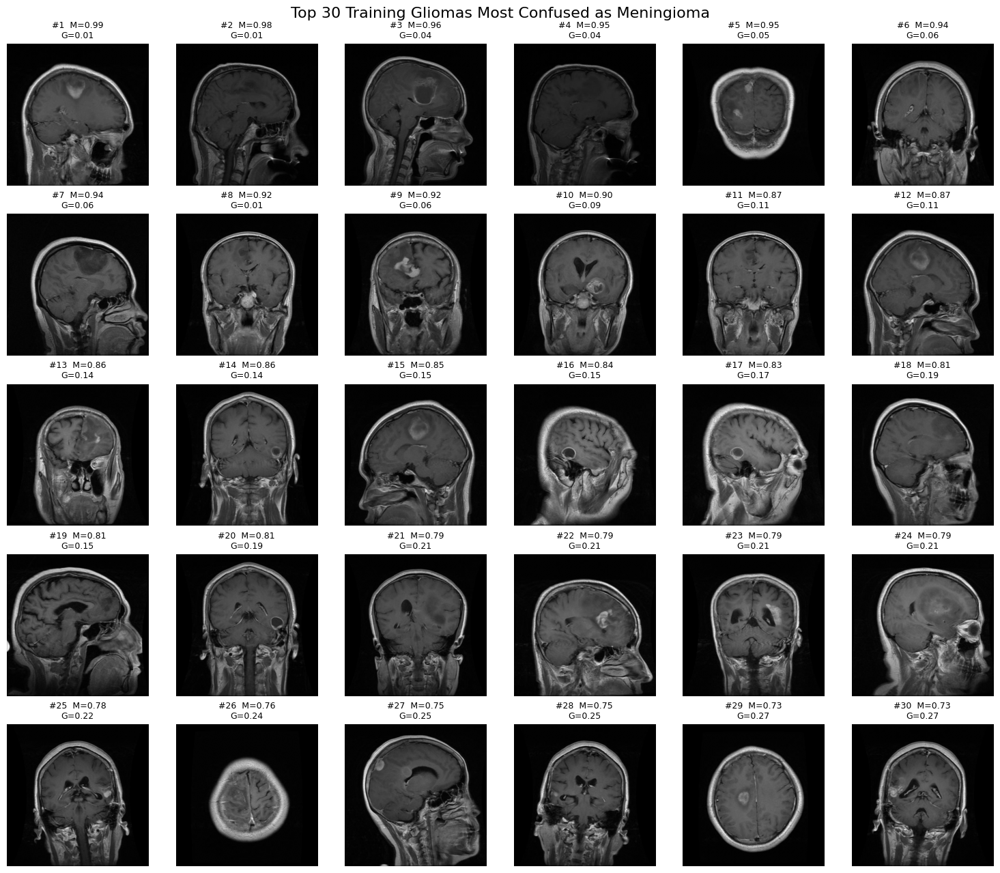

IMAGE SAVED
Path: /content/difficult_training_gliomas.png
Size: 2.55 MB


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [40]:
# ============================================================
# SAVE DIFFICULT GLIOMA GRID FOR DOWNLOAD
# ============================================================

import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path

TOP_N = 30

top_training_errors = training_glioma_results[:TOP_N]

fig, axes = plt.subplots(
    5, 6,
    figsize=(15, 13)
)

for i, (ax, result) in enumerate(
    zip(axes.flat, top_training_errors)
):
    image = Image.open(
        result["path"]
    ).convert("L")

    ax.imshow(
        image,
        cmap="gray"
    )

    ax.set_title(
        f"#{i+1}  "
        f"M={result['meningioma']:.2f}\n"
        f"G={result['glioma']:.2f}",
        fontsize=9
    )

    ax.axis("off")

plt.suptitle(
    "Top 30 Training Gliomas Most Confused as Meningioma",
    fontsize=16
)

plt.tight_layout()

OUTPUT = "/content/difficult_training_gliomas.png"

plt.savefig(
    OUTPUT,
    dpi=180,
    bbox_inches="tight"
)

plt.show()

print("=" * 70)
print("IMAGE SAVED")
print("=" * 70)
print(f"Path: {OUTPUT}")
print(
    f"Size: {Path(OUTPUT).stat().st_size / (1024*1024):.2f} MB"
)

# ============================================================
# DOWNLOAD TO YOUR COMPUTER
# ============================================================

from google.colab import files

files.download(OUTPUT)

In [41]:
# ============================================================
# MODEL 3A — V3 CLASS-WEIGHTED FINE-TUNING
# ============================================================

import torch
import torch.nn as nn
import torch.optim as optim
import copy
import time

print("=" * 70)
print("MODEL 3A — V3 CLASS-WEIGHTED FINE-TUNING")
print("=" * 70)

# ============================================================
# RESTORE BEST V2 MODEL
# ============================================================

model_v2.load_state_dict(
    best_stage2_model_state_v2
)

model_v2.to(device)


# ============================================================
# CLASS WEIGHTS
#
# 0 = Glioma
# 1 = Meningioma
# 2 = Pituitary
# ============================================================

class_weights_v3 = torch.tensor(
    [
        1.30,   # Glioma
        1.00,   # Meningioma
        1.00    # Pituitary
    ],
    dtype=torch.float32,
    device=device
)

print("\nClass weights:")
print("  Glioma      : 1.30")
print("  Meningioma  : 1.00")
print("  Pituitary   : 1.00")


# ============================================================
# WEIGHTED LOSS
# ============================================================

criterion_v3 = nn.CrossEntropyLoss(
    weight=class_weights_v3
)

print("\nLoss:")
print(criterion_v3)


# ============================================================
# VERIFY TRAINABLE PARAMETERS
# ============================================================

# Keep same V2 fine-tuning configuration

for param in model_v2.parameters():
    param.requires_grad = False

# Last three EfficientNet blocks
for block_id in [6, 7, 8]:

    for param in model_v2.features[
        block_id
    ].parameters():

        param.requires_grad = True

# Classifier
for param in model_v2.classifier.parameters():
    param.requires_grad = True

# Freeze BatchNorm
for module in model_v2.modules():

    if isinstance(module, nn.BatchNorm2d):

        module.eval()

        for param in module.parameters():
            param.requires_grad = False


# ============================================================
# PARAMETER GROUPS
# ============================================================

backbone_parameters_v3 = []

for block_id in [6, 7, 8]:

    backbone_parameters_v3.extend(
        list(
            model_v2.features[
                block_id
            ].parameters()
        )
    )

classifier_parameters_v3 = list(
    model_v2.classifier.parameters()
)


# ============================================================
# OPTIMIZER
# ============================================================

optimizer_v3 = optim.AdamW(
    [
        {
            "params": backbone_parameters_v3,
            "lr": 1e-5
        },
        {
            "params": classifier_parameters_v3,
            "lr": 1e-4
        }
    ],
    weight_decay=1e-4
)


# ============================================================
# SCHEDULER
# ============================================================

scheduler_v3 = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_v3,
    mode="min",
    factor=0.5,
    patience=2
)


# ============================================================
# SETTINGS
# ============================================================

V3_EPOCHS = 12
V3_PATIENCE = 4

best_v3_accuracy = 0.0
best_v3_loss = float("inf")

best_v3_state = copy.deepcopy(
    model_v2.state_dict()
)

epochs_without_improvement_v3 = 0


# ============================================================
# INFORMATION
# ============================================================

total_params_v3 = sum(
    p.numel()
    for p in model_v2.parameters()
)

trainable_params_v3 = sum(
    p.numel()
    for p in model_v2.parameters()
    if p.requires_grad
)

print("\nArchitecture:")
print("  EfficientNet-B0")

print("\nFine-tuned:")
print("  features.6")
print("  features.7")
print("  features.8")

print("\nFrozen:")
print("  features.0 → features.5")
print("  BatchNorm")

print("\nParameters:")
print(
    f"  Total     : {total_params_v3:,}"
)

print(
    f"  Trainable : {trainable_params_v3:,}"
)

print("\nLearning rates:")
print("  Backbone   : 1e-5")
print("  Classifier : 1e-4")

print("\nMaximum epochs:")
print(V3_EPOCHS)

print("\nEarly stopping patience:")
print(V3_PATIENCE)

print("\nStarting V2 test accuracy:")
print(
    f"{test_accuracy_v2 * 100:.2f}%"
)


# ============================================================
# SANITY CHECK
# ============================================================

assert class_weights_v3.shape == (3,)

assert (
    class_weights_v3[0].item()
    > class_weights_v3[1].item()
)

assert (
    class_weights_v3[0].item()
    > class_weights_v3[2].item()
)

assert trainable_params_v3 > 0


print("\n✓ V2 best weights restored.")
print("✓ Glioma receives higher loss weight.")
print("✓ Same V2 architecture retained.")
print("✓ Same preprocessing retained.")
print("✓ Same fine-tuning blocks retained.")
print("✓ Weighted CrossEntropyLoss ready.")

print("\n" + "=" * 70)
print("V3 CONFIGURATION READY")
print("=" * 70)

MODEL 3A — V3 CLASS-WEIGHTED FINE-TUNING

Class weights:
  Glioma      : 1.30
  Meningioma  : 1.00
  Pituitary   : 1.00

Loss:
CrossEntropyLoss()

Architecture:
  EfficientNet-B0

Fine-tuned:
  features.6
  features.7
  features.8

Frozen:
  features.0 → features.5
  BatchNorm

Parameters:
  Total     : 4,011,391
  Trainable : 3,133,727

Learning rates:
  Backbone   : 1e-5
  Classifier : 1e-4

Maximum epochs:
12

Early stopping patience:
4

Starting V2 test accuracy:
89.83%

✓ V2 best weights restored.
✓ Glioma receives higher loss weight.
✓ Same V2 architecture retained.
✓ Same preprocessing retained.
✓ Same fine-tuning blocks retained.
✓ Weighted CrossEntropyLoss ready.

V3 CONFIGURATION READY


In [42]:
# ============================================================
# MODEL 3A — V3 CLASS-WEIGHTED TRAINING
# ============================================================

import time
import copy
import torch

print("=" * 70)
print("MODEL 3A — V3 CLASS-WEIGHTED FINE-TUNING")
print("=" * 70)

v3_history = []

for epoch in range(V3_EPOCHS):

    start_time = time.time()

    # --------------------------------------------------------
    # TRAIN
    # --------------------------------------------------------

    train_loss, train_accuracy = run_epoch(
        model=model_v2,
        loader=train_loader_v2,
        criterion=criterion_v3,
        optimizer=optimizer_v3,
        device=device
    )

    # --------------------------------------------------------
    # VALIDATION
    # --------------------------------------------------------

    val_loss, val_accuracy = run_epoch(
        model=model_v2,
        loader=val_loader_v2,
        criterion=criterion_v3,
        optimizer=None,
        device=device
    )

    # --------------------------------------------------------
    # SCHEDULER
    # --------------------------------------------------------

    scheduler_v3.step(val_loss)

    backbone_lr = (
        optimizer_v3.param_groups[0]["lr"]
    )

    classifier_lr = (
        optimizer_v3.param_groups[1]["lr"]
    )

    elapsed = time.time() - start_time

    # --------------------------------------------------------
    # HISTORY
    # --------------------------------------------------------

    v3_history.append({
        "epoch": epoch + 1,
        "train_loss": train_loss,
        "train_accuracy": train_accuracy,
        "val_loss": val_loss,
        "val_accuracy": val_accuracy,
        "backbone_lr": backbone_lr,
        "classifier_lr": classifier_lr
    })

    # --------------------------------------------------------
    # BEST MODEL
    # --------------------------------------------------------

    is_best = False

    if val_accuracy > best_v3_accuracy:

        best_v3_accuracy = val_accuracy
        best_v3_loss = val_loss

        best_v3_state = copy.deepcopy(
            model_v2.state_dict()
        )

        epochs_without_improvement_v3 = 0

        is_best = True

    else:

        epochs_without_improvement_v3 += 1

    # --------------------------------------------------------
    # PRINT
    # --------------------------------------------------------

    best_marker = "  ← BEST" if is_best else ""

    print(
        f"Epoch {epoch + 1:02d}/{V3_EPOCHS} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_accuracy * 100:.2f}% | "
        f"Val Loss: {val_loss:.4f} | "
        f"Val Acc: {val_accuracy * 100:.2f}% | "
        f"Backbone LR: {backbone_lr:.1e} | "
        f"Classifier LR: {classifier_lr:.1e} | "
        f"Time: {elapsed:.1f}s"
        f"{best_marker}"
    )

    # --------------------------------------------------------
    # EARLY STOPPING
    # --------------------------------------------------------

    if (
        epochs_without_improvement_v3
        >= V3_PATIENCE
    ):

        print(
            f"\nEarly stopping triggered after "
            f"{epoch + 1} epochs."
        )

        break


# ============================================================
# RESTORE BEST V3 MODEL
# ============================================================

model_v2.load_state_dict(
    best_v3_state
)

model_v2.eval()


# ============================================================
# FINAL RESULT
# ============================================================

print("\n" + "=" * 70)
print("V3 TRAINING COMPLETE")
print("=" * 70)

print(
    f"V2 best validation accuracy: "
    f"{best_val_accuracy_v2 * 100:.2f}%"
)

print(
    f"V3 best validation accuracy: "
    f"{best_v3_accuracy * 100:.2f}%"
)

print(
    f"V3 best validation loss: "
    f"{best_v3_loss:.4f}"
)

print(
    f"Validation improvement: "
    f"{(best_v3_accuracy - best_val_accuracy_v2) * 100:+.2f} "
    f"percentage points"
)

print(
    "\nBest V3 model restored."
)

print("=" * 70)

MODEL 3A — V3 CLASS-WEIGHTED FINE-TUNING
Epoch 01/12 | Train Loss: 0.1394 | Train Acc: 94.66% | Val Loss: 0.1328 | Val Acc: 96.43% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 30.8s  ← BEST
Epoch 02/12 | Train Loss: 0.1351 | Train Acc: 95.08% | Val Loss: 0.1430 | Val Acc: 95.24% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 30.1s
Epoch 03/12 | Train Loss: 0.1304 | Train Acc: 95.00% | Val Loss: 0.1240 | Val Acc: 96.19% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 30.0s
Epoch 04/12 | Train Loss: 0.1291 | Train Acc: 94.79% | Val Loss: 0.1220 | Val Acc: 95.95% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 30.7s
Epoch 05/12 | Train Loss: 0.1226 | Train Acc: 95.50% | Val Loss: 0.1262 | Val Acc: 96.43% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 31.2s

Early stopping triggered after 5 epochs.

V3 TRAINING COMPLETE
V2 best validation accuracy: 89.29%
V3 best validation accuracy: 96.43%
V3 best validation loss: 0.1328
Validation improvement:

In [43]:
# ============================================================
# MODEL 3A — V3 FINAL TEST EVALUATION
# ============================================================

import torch
import numpy as np
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix
)

print("=" * 70)
print("MODEL 3A — V3 FINAL TEST SET EVALUATION")
print("=" * 70)

# ============================================================
# RESTORE BEST V3 MODEL
# ============================================================

model_v2.load_state_dict(
    best_v3_state
)

model_v2.eval()

# ============================================================
# PREDICTIONS
# ============================================================

all_predictions_v3 = []
all_true_labels_v3 = []
all_confidences_v3 = []
all_probabilities_v3 = []

with torch.no_grad():

    for images, labels in test_loader_v2:

        images = images.to(
            device,
            non_blocking=True
        )

        outputs = model_v2(images)

        probabilities = torch.softmax(
            outputs,
            dim=1
        )

        predictions = torch.argmax(
            probabilities,
            dim=1
        )

        confidences = torch.max(
            probabilities,
            dim=1
        ).values

        all_predictions_v3.extend(
            predictions.cpu().numpy()
        )

        all_true_labels_v3.extend(
            labels.numpy()
        )

        all_confidences_v3.extend(
            confidences.cpu().numpy()
        )

        all_probabilities_v3.extend(
            probabilities.cpu().numpy()
        )


# ============================================================
# NUMPY
# ============================================================

y_true_v3 = np.array(
    all_true_labels_v3
)

y_pred_v3 = np.array(
    all_predictions_v3
)

probabilities_v3 = np.array(
    all_probabilities_v3
)

confidences_v3 = np.array(
    all_confidences_v3
)


# ============================================================
# OVERALL ACCURACY
# ============================================================

test_accuracy_v3 = accuracy_score(
    y_true_v3,
    y_pred_v3
)


# ============================================================
# CLASSIFICATION REPORT
# ============================================================

report_v3 = classification_report(
    y_true_v3,
    y_pred_v3,
    target_names=CLASS_NAMES_V2,
    digits=4
)


# ============================================================
# CONFUSION MATRIX
# ============================================================

cm_v3 = confusion_matrix(
    y_true_v3,
    y_pred_v3
)


# ============================================================
# OUTPUT
# ============================================================

print("\n" + "=" * 70)
print("MODEL 3A — V3 TEST RESULTS")
print("=" * 70)

print(
    f"\nOverall Test Accuracy: "
    f"{test_accuracy_v3 * 100:.2f}%"
)

print(
    "\nClassification Report:"
)

print(
    report_v3
)

print(
    "\nConfusion Matrix:"
)

print(
    "Rows    = Actual"
)

print(
    "Columns = Predicted"
)

print(
    f"\n{'':15s}"
    f"{'glioma':15s}"
    f"{'meningioma':15s}"
    f"{'pituitary':15s}"
)

for i, class_name in enumerate(
    CLASS_NAMES_V2
):

    print(
        f"{class_name:15s}"
        f"{cm_v3[i, 0]:<15}"
        f"{cm_v3[i, 1]:<15}"
        f"{cm_v3[i, 2]:<15}"
    )


# ============================================================
# PER-CLASS ACCURACY
# ============================================================

print("\nPer-class accuracy:")

for i, class_name in enumerate(
    CLASS_NAMES_V2
):

    total = cm_v3[i].sum()

    correct = cm_v3[i, i]

    accuracy = (
        correct / total
    )

    print(
        f"  {class_name:12s}: "
        f"{accuracy * 100:.2f}% "
        f"({correct}/{total})"
    )


# ============================================================
# MEAN CONFIDENCE
# ============================================================

print(
    f"\nMean prediction confidence: "
    f"{confidences_v3.mean():.4f}"
)


# ============================================================
# GLIOMA-SPECIFIC ANALYSIS
# ============================================================

glioma_to_glioma = cm_v3[0, 0]
glioma_to_meningioma = cm_v3[0, 1]
glioma_to_pituitary = cm_v3[0, 2]

meningioma_to_glioma = cm_v3[1, 0]
pituitary_to_glioma = cm_v3[2, 0]

print("\n" + "=" * 70)
print("V3 GLIOMA CONFUSION ANALYSIS")
print("=" * 70)

print(
    f"\nActual Glioma → Glioma: "
    f"{glioma_to_glioma}"
)

print(
    f"Actual Glioma → Meningioma: "
    f"{glioma_to_meningioma}"
)

print(
    f"Actual Glioma → Pituitary: "
    f"{glioma_to_pituitary}"
)

print(
    f"\nActual Meningioma → Glioma: "
    f"{meningioma_to_glioma}"
)

print(
    f"Actual Pituitary → Glioma: "
    f"{pituitary_to_glioma}"
)


# ============================================================
# COMPARISON WITH V2
# ============================================================

print("\n" + "=" * 70)
print("V2 vs V3")
print("=" * 70)

print(
    f"\nV2 Test Accuracy       : "
    f"{test_accuracy_v2 * 100:.2f}%"
)

print(
    f"V3 Test Accuracy       : "
    f"{test_accuracy_v3 * 100:.2f}%"
)

print(
    f"Accuracy Change        : "
    f"{(test_accuracy_v3 - test_accuracy_v2) * 100:+.2f} pp"
)

print(
    f"\nV2 Glioma → Meningioma : "
    f"{cm_v2[0, 1]}"
)

print(
    f"V3 Glioma → Meningioma : "
    f"{cm_v3[0, 1]}"
)

print(
    f"Change                  : "
    f"{cm_v3[0, 1] - cm_v2[0, 1]:+d}"
)

print("\n" + "=" * 70)
print("V3 TEST EVALUATION COMPLETE")
print("=" * 70)

MODEL 3A — V3 FINAL TEST SET EVALUATION

MODEL 3A — V3 TEST RESULTS

Overall Test Accuracy: 90.33%

Classification Report:
              precision    recall  f1-score   support

      glioma     0.9870    0.7600    0.8588       400
  meningioma     0.7971    0.9725    0.8761       400
   pituitary     0.9678    0.9775    0.9726       400

    accuracy                         0.9033      1200
   macro avg     0.9173    0.9033    0.9025      1200
weighted avg     0.9173    0.9033    0.9025      1200


Confusion Matrix:
Rows    = Actual
Columns = Predicted

               glioma         meningioma     pituitary      
glioma         304            91             5              
meningioma     3              389            8              
pituitary      1              8              391            

Per-class accuracy:
  glioma      : 76.00% (304/400)
  meningioma  : 97.25% (389/400)
  pituitary   : 97.75% (391/400)

Mean prediction confidence: 0.9368

V3 GLIOMA CONFUSION ANALYSIS

Actual G

In [44]:
# ============================================================
# MODEL 3A — V4 HARD GLIOMA OVERSAMPLING
# ============================================================

from torch.utils.data import WeightedRandomSampler
import numpy as np

print("=" * 70)
print("MODEL 3A — V4 HARD GLIOMA OVERSAMPLING")
print("=" * 70)

# ------------------------------------------------------------
# Restore best V2 model
# ------------------------------------------------------------

model_v2.load_state_dict(
    best_stage2_model_state_v2
)

model_v2.to(device)


# ------------------------------------------------------------
# Build lookup of difficult Glioma training images
# ------------------------------------------------------------

hard_glioma_paths = set()

for result in training_glioma_results:

    # Hard Glioma:
    # model predicts Meningioma
    # OR Meningioma probability >= 0.70

    if (
        result["prediction"] == 1
        or result["meningioma"] >= 0.70
    ):
        hard_glioma_paths.add(
            str(result["path"])
        )


print(
    f"\nHard Glioma images identified: "
    f"{len(hard_glioma_paths)}"
)


# ------------------------------------------------------------
# Create weights for every training sample
# ------------------------------------------------------------

sample_weights = []

normal_weight = 1.0
hard_glioma_weight = 3.0

hard_count = 0
normal_count = 0

for path, old_label in train_samples_clean:

    path = str(path)

    new_label = OLD_TO_NEW[
        old_label
    ]

    # --------------------------------------------------------
    # Difficult Glioma
    # --------------------------------------------------------

    if (
        new_label == 0
        and path in hard_glioma_paths
    ):

        sample_weights.append(
            hard_glioma_weight
        )

        hard_count += 1

    # --------------------------------------------------------
    # Everything else
    # --------------------------------------------------------

    else:

        sample_weights.append(
            normal_weight
        )

        normal_count += 1


sample_weights = np.array(
    sample_weights,
    dtype=np.float64
)


# ------------------------------------------------------------
# Weighted sampler
# ------------------------------------------------------------

sampler_v4 = WeightedRandomSampler(
    weights=torch.as_tensor(
        sample_weights,
        dtype=torch.double
    ),
    num_samples=len(
        sample_weights
    ),
    replacement=True
)


# ------------------------------------------------------------
# New training DataLoader
# ------------------------------------------------------------

train_loader_v4 = torch.utils.data.DataLoader(
    train_dataset_v2,
    batch_size=32,
    sampler=sampler_v4,
    num_workers=2,
    pin_memory=True
)


# ------------------------------------------------------------
# Statistics
# ------------------------------------------------------------

print("\nSampling weights:")
print(
    f"  Normal samples : {normal_count}"
)

print(
    f"  Hard Gliomas   : {hard_count}"
)

print(
    f"  Normal weight  : {normal_weight}"
)

print(
    f"  Hard Glioma weight : "
    f"{hard_glioma_weight}"
)

print(
    f"\nOriginal training samples: "
    f"{len(train_dataset_v2)}"
)

print(
    f"V4 training batches: "
    f"{len(train_loader_v4)}"
)


# ------------------------------------------------------------
# Important checks
# ------------------------------------------------------------

assert len(
    sample_weights
) == len(
    train_dataset_v2
)

assert hard_count > 0

print("\n✓ Difficult Gliomas identified.")
print("✓ Difficult Gliomas receive 3× sampling weight.")
print("✓ No images deleted.")
print("✓ Validation set unchanged.")
print("✓ Test set unchanged.")
print("✓ V4 sampler ready.")

print("\n" + "=" * 70)
print("V4 HARD-GLIOMA SAMPLER READY")
print("=" * 70)

MODEL 3A — V4 HARD GLIOMA OVERSAMPLING

Hard Glioma images identified: 66

Sampling weights:
  Normal samples : 4134
  Hard Gliomas   : 66
  Normal weight  : 1.0
  Hard Glioma weight : 3.0

Original training samples: 3780
V4 training batches: 132


AssertionError: 

In [45]:
# ============================================================
# MODEL 3A — V4 HARD GLIOMA OVERSAMPLING — FIXED
# ============================================================

import torch
from torch.utils.data import WeightedRandomSampler, DataLoader
import numpy as np

print("=" * 70)
print("MODEL 3A — V4 HARD GLIOMA OVERSAMPLING — FIXED")
print("=" * 70)


# ============================================================
# 1. RESTORE BEST V2 MODEL
# ============================================================

model_v2.load_state_dict(
    best_stage2_model_state_v2
)

model_v2.to(device)


# ============================================================
# 2. GET HARD GLIOMA PATHS
# ============================================================

hard_glioma_paths = set(
    str(result["path"])
    for result in training_glioma_results
    if (
        result["prediction"] == 1
        or result["meningioma"] >= 0.70
    )
)

print(
    f"\nHard Glioma images identified: "
    f"{len(hard_glioma_paths)}"
)


# ============================================================
# 3. GET ACTUAL TRAINING DATASET INDICES
# ============================================================
#
# train_dataset_v2 is the 3780-image training subset.
#
# We use its underlying dataset + indices instead of
# train_samples_clean, which contains all 4200 images.
# ============================================================

print("\nBuilding weights for actual training subset...")


# ------------------------------------------------------------
# Determine how train_dataset_v2 was constructed
# ------------------------------------------------------------

if hasattr(
    train_dataset_v2,
    "indices"
):

    # Subset
    actual_indices = (
        train_dataset_v2.indices
    )

    base_dataset = (
        train_dataset_v2.dataset
    )

else:

    # Dataset itself
    actual_indices = range(
        len(train_dataset_v2)
    )

    base_dataset = (
        train_dataset_v2
    )


# ============================================================
# 4. BUILD PATH → ORIGINAL LABEL LOOKUP
# ============================================================

path_to_old_label = {}

for path, old_label in train_samples_clean:

    path_to_old_label[
        str(path)
    ] = old_label


# ============================================================
# 5. BUILD TRAINING WEIGHTS
# ============================================================

sample_weights = []

hard_count = 0
normal_count = 0

for dataset_index in actual_indices:

    # --------------------------------------------------------
    # Get path from base dataset
    # --------------------------------------------------------

    if hasattr(
        base_dataset,
        "samples"
    ):

        image_path = str(
            base_dataset.samples[
                dataset_index
            ][0]
        )

    elif hasattr(
        base_dataset,
        "imgs"
    ):

        image_path = str(
            base_dataset.imgs[
                dataset_index
            ][0]
        )

    else:

        raise RuntimeError(
            "Cannot determine image paths "
            "from train_dataset_v2."
        )


    # --------------------------------------------------------
    # Determine class
    # --------------------------------------------------------

    old_label = path_to_old_label.get(
        image_path
    )

    if old_label is None:

        raise RuntimeError(
            f"Could not find label for:\n"
            f"{image_path}"
        )

    new_label = OLD_TO_NEW[
        old_label
    ]


    # --------------------------------------------------------
    # Hard Glioma
    # --------------------------------------------------------

    if (
        new_label == 0
        and image_path in hard_glioma_paths
    ):

        sample_weights.append(
            3.0
        )

        hard_count += 1

    else:

        sample_weights.append(
            1.0
        )

        normal_count += 1


sample_weights = np.asarray(
    sample_weights,
    dtype=np.float64
)


# ============================================================
# 6. VERIFY LENGTH
# ============================================================

print("\nWeight verification:")

print(
    f"  Dataset samples : "
    f"{len(train_dataset_v2)}"
)

print(
    f"  Weight samples  : "
    f"{len(sample_weights)}"
)

assert (
    len(sample_weights)
    == len(train_dataset_v2)
)

print(
    "  ✓ Weight count matches "
    "training dataset."
)


# ============================================================
# 7. CREATE SAMPLER
# ============================================================

sampler_v4 = WeightedRandomSampler(
    weights=torch.tensor(
        sample_weights,
        dtype=torch.double
    ),
    num_samples=len(
        train_dataset_v2
    ),
    replacement=True
)


# ============================================================
# 8. CREATE DATALOADER
# ============================================================

train_loader_v4 = DataLoader(
    train_dataset_v2,
    batch_size=32,
    sampler=sampler_v4,
    num_workers=2,
    pin_memory=True
)


# ============================================================
# 9. SUMMARY
# ============================================================

print("\n" + "=" * 70)
print("V4 SAMPLING CONFIGURATION")
print("=" * 70)

print(
    f"\nTraining samples: "
    f"{len(train_dataset_v2)}"
)

print(
    f"Hard Glioma samples: "
    f"{hard_count}"
)

print(
    f"Normal samples: "
    f"{normal_count}"
)

print(
    "\nSampling weights:"
)

print(
    "  Normal       : 1.0×"
)

print(
    "  Hard Glioma  : 3.0×"
)

print(
    f"\nTraining batches: "
    f"{len(train_loader_v4)}"
)

print(
    "\n✓ Hard Gliomas identified."
)

print(
    "✓ No images deleted."
)

print(
    "✓ Validation set untouched."
)

print(
    "✓ Test set untouched."
)

print(
    "✓ Weight count verified."
)

print(
    "✓ V4 sampler ready."
)

print("\n" + "=" * 70)

MODEL 3A — V4 HARD GLIOMA OVERSAMPLING — FIXED

Hard Glioma images identified: 66

Building weights for actual training subset...

Weight verification:
  Dataset samples : 3780
  Weight samples  : 3780
  ✓ Weight count matches training dataset.

V4 SAMPLING CONFIGURATION

Training samples: 3780
Hard Glioma samples: 58
Normal samples: 3722

Sampling weights:
  Normal       : 1.0×
  Hard Glioma  : 3.0×

Training batches: 119

✓ Hard Gliomas identified.
✓ No images deleted.
✓ Validation set untouched.
✓ Test set untouched.
✓ Weight count verified.
✓ V4 sampler ready.



In [46]:
# ============================================================
# MODEL 3A — V4 HARD GLIOMA OVERSAMPLING TRAINING
# ============================================================

import torch
import copy
import time
import torch.nn as nn
import torch.optim as optim

print("=" * 70)
print("MODEL 3A — V4 HARD GLIOMA OVERSAMPLING TRAINING")
print("=" * 70)


# ============================================================
# 1. RESTORE BEST V2 MODEL
# ============================================================

model_v2.load_state_dict(
    best_stage2_model_state_v2
)

model_v2.to(device)


# ============================================================
# 2. FREEZE EVERYTHING
# ============================================================

for param in model_v2.parameters():
    param.requires_grad = False


# ============================================================
# 3. UNFREEZE LAST THREE EFFICIENTNET BLOCKS
# ============================================================

for block_id in [6, 7, 8]:

    for param in model_v2.features[
        block_id
    ].parameters():

        param.requires_grad = True


# ============================================================
# 4. KEEP BATCHNORM FROZEN
# ============================================================

for module in model_v2.modules():

    if isinstance(
        module,
        nn.BatchNorm2d
    ):

        module.eval()

        for param in module.parameters():
            param.requires_grad = False


# ============================================================
# 5. CLASSIFIER TRAINABLE
# ============================================================

for param in model_v2.classifier.parameters():
    param.requires_grad = True


# ============================================================
# 6. LOSS
# ============================================================

criterion_v4 = nn.CrossEntropyLoss()


# ============================================================
# 7. PARAMETER GROUPS
# ============================================================

backbone_parameters_v4 = []

for block_id in [6, 7, 8]:

    backbone_parameters_v4.extend(
        list(
            model_v2.features[
                block_id
            ].parameters()
        )
    )

classifier_parameters_v4 = list(
    model_v2.classifier.parameters()
)


# ============================================================
# 8. OPTIMIZER
# ============================================================

optimizer_v4 = optim.AdamW(
    [
        {
            "params": backbone_parameters_v4,
            "lr": 1e-5
        },
        {
            "params": classifier_parameters_v4,
            "lr": 1e-4
        }
    ],
    weight_decay=1e-4
)


# ============================================================
# 9. SCHEDULER
# ============================================================

scheduler_v4 = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_v4,
    mode="min",
    factor=0.5,
    patience=2
)


# ============================================================
# 10. TRAINING SETTINGS
# ============================================================

V4_EPOCHS = 10
V4_PATIENCE = 4

best_v4_accuracy = 0.0
best_v4_loss = float("inf")

best_v4_state = copy.deepcopy(
    model_v2.state_dict()
)

epochs_without_improvement_v4 = 0

v4_history = []


# ============================================================
# 11. TRAINING LOOP
# ============================================================

for epoch in range(V4_EPOCHS):

    start_time = time.time()

    # --------------------------------------------------------
    # TRAIN
    # --------------------------------------------------------

    train_loss, train_accuracy = run_epoch(
        model=model_v2,
        loader=train_loader_v4,
        criterion=criterion_v4,
        optimizer=optimizer_v4,
        device=device
    )

    # --------------------------------------------------------
    # VALIDATION
    # --------------------------------------------------------

    val_loss, val_accuracy = run_epoch(
        model=model_v2,
        loader=val_loader_v2,
        criterion=criterion_v4,
        optimizer=None,
        device=device
    )

    # --------------------------------------------------------
    # SCHEDULER
    # --------------------------------------------------------

    scheduler_v4.step(
        val_loss
    )

    backbone_lr = (
        optimizer_v4
        .param_groups[0]["lr"]
    )

    classifier_lr = (
        optimizer_v4
        .param_groups[1]["lr"]
    )

    elapsed = (
        time.time() - start_time
    )

    # --------------------------------------------------------
    # SAVE HISTORY
    # --------------------------------------------------------

    v4_history.append({
        "epoch": epoch + 1,
        "train_loss": train_loss,
        "train_accuracy": train_accuracy,
        "val_loss": val_loss,
        "val_accuracy": val_accuracy,
        "backbone_lr": backbone_lr,
        "classifier_lr": classifier_lr
    })

    # --------------------------------------------------------
    # BEST MODEL
    # --------------------------------------------------------

    is_best = False

    if val_accuracy > best_v4_accuracy:

        best_v4_accuracy = val_accuracy
        best_v4_loss = val_loss

        best_v4_state = copy.deepcopy(
            model_v2.state_dict()
        )

        epochs_without_improvement_v4 = 0

        is_best = True

    else:

        epochs_without_improvement_v4 += 1

    # --------------------------------------------------------
    # PRINT
    # --------------------------------------------------------

    best_marker = (
        "  ← BEST"
        if is_best
        else ""
    )

    print(
        f"Epoch {epoch + 1:02d}/{V4_EPOCHS} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_accuracy * 100:.2f}% | "
        f"Val Loss: {val_loss:.4f} | "
        f"Val Acc: {val_accuracy * 100:.2f}% | "
        f"Backbone LR: {backbone_lr:.1e} | "
        f"Classifier LR: {classifier_lr:.1e} | "
        f"Time: {elapsed:.1f}s"
        f"{best_marker}"
    )

    # --------------------------------------------------------
    # EARLY STOPPING
    # --------------------------------------------------------

    if (
        epochs_without_improvement_v4
        >= V4_PATIENCE
    ):

        print(
            f"\nEarly stopping triggered after "
            f"{epoch + 1} epochs."
        )

        break


# ============================================================
# 12. RESTORE BEST V4
# ============================================================

model_v2.load_state_dict(
    best_v4_state
)

model_v2.eval()


# ============================================================
# 13. RESULT
# ============================================================

print("\n" + "=" * 70)
print("V4 TRAINING COMPLETE")
print("=" * 70)

print(
    f"V4 best validation accuracy: "
    f"{best_v4_accuracy * 100:.2f}%"
)

print(
    f"V4 best validation loss: "
    f"{best_v4_loss:.4f}"
)

print(
    f"V2 validation accuracy: "
    f"{best_val_accuracy_v2 * 100:.2f}%"
)

print(
    f"V4 improvement over V2: "
    f"{(best_v4_accuracy - best_val_accuracy_v2) * 100:+.2f} pp"
)

print(
    "\nBest V4 model restored."
)

print("=" * 70)

MODEL 3A — V4 HARD GLIOMA OVERSAMPLING TRAINING
Epoch 01/10 | Train Loss: 0.1583 | Train Acc: 93.97% | Val Loss: 0.1466 | Val Acc: 95.48% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 30.4s  ← BEST
Epoch 02/10 | Train Loss: 0.1664 | Train Acc: 93.52% | Val Loss: 0.1298 | Val Acc: 95.71% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 32.1s  ← BEST
Epoch 03/10 | Train Loss: 0.1528 | Train Acc: 94.39% | Val Loss: 0.1286 | Val Acc: 95.71% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 30.6s
Epoch 04/10 | Train Loss: 0.1410 | Train Acc: 94.39% | Val Loss: 0.1322 | Val Acc: 94.76% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 30.8s
Epoch 05/10 | Train Loss: 0.1377 | Train Acc: 94.63% | Val Loss: 0.1231 | Val Acc: 96.19% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 32.0s  ← BEST
Epoch 06/10 | Train Loss: 0.1286 | Train Acc: 95.26% | Val Loss: 0.1142 | Val Acc: 95.95% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 30.6s
Epoch 07/10 | Tr

In [47]:
# ============================================================
# MODEL 3A — V4 FINAL TEST SET EVALUATION
# ============================================================

import torch
import numpy as np
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix
)

print("=" * 70)
print("MODEL 3A — V4 FINAL TEST SET EVALUATION")
print("=" * 70)


# ============================================================
# RESTORE BEST V4 MODEL
# ============================================================

model_v2.load_state_dict(
    best_v4_state
)

model_v2.eval()


# ============================================================
# PREDICTIONS
# ============================================================

all_predictions_v4 = []
all_true_labels_v4 = []
all_confidences_v4 = []
all_probabilities_v4 = []

with torch.no_grad():

    for images, labels in test_loader_v2:

        images = images.to(
            device,
            non_blocking=True
        )

        outputs = model_v2(images)

        probabilities = torch.softmax(
            outputs,
            dim=1
        )

        predictions = torch.argmax(
            probabilities,
            dim=1
        )

        confidences = torch.max(
            probabilities,
            dim=1
        ).values

        all_predictions_v4.extend(
            predictions.cpu().numpy()
        )

        all_true_labels_v4.extend(
            labels.numpy()
        )

        all_confidences_v4.extend(
            confidences.cpu().numpy()
        )

        all_probabilities_v4.extend(
            probabilities.cpu().numpy()
        )


# ============================================================
# NUMPY
# ============================================================

y_true_v4 = np.array(
    all_true_labels_v4
)

y_pred_v4 = np.array(
    all_predictions_v4
)

probabilities_v4 = np.array(
    all_probabilities_v4
)

confidences_v4 = np.array(
    all_confidences_v4
)


# ============================================================
# ACCURACY
# ============================================================

test_accuracy_v4 = accuracy_score(
    y_true_v4,
    y_pred_v4
)


# ============================================================
# CLASSIFICATION REPORT
# ============================================================

report_v4 = classification_report(
    y_true_v4,
    y_pred_v4,
    target_names=CLASS_NAMES_V2,
    digits=4
)


# ============================================================
# CONFUSION MATRIX
# ============================================================

cm_v4 = confusion_matrix(
    y_true_v4,
    y_pred_v4
)


# ============================================================
# RESULTS
# ============================================================

print("\n" + "=" * 70)
print("MODEL 3A — V4 TEST RESULTS")
print("=" * 70)

print(
    f"\nOverall Test Accuracy: "
    f"{test_accuracy_v4 * 100:.2f}%"
)

print(
    "\nClassification Report:"
)

print(
    report_v4
)


print(
    "\nConfusion Matrix:"
)

print(
    "Rows    = Actual"
)

print(
    "Columns = Predicted"
)

print(
    f"\n{'':15s}"
    f"{'glioma':15s}"
    f"{'meningioma':15s}"
    f"{'pituitary':15s}"
)

for i, class_name in enumerate(
    CLASS_NAMES_V2
):

    print(
        f"{class_name:15s}"
        f"{cm_v4[i, 0]:<15}"
        f"{cm_v4[i, 1]:<15}"
        f"{cm_v4[i, 2]:<15}"
    )


# ============================================================
# PER-CLASS ACCURACY
# ============================================================

print("\nPer-class accuracy:")

for i, class_name in enumerate(
    CLASS_NAMES_V2
):

    total = cm_v4[i].sum()

    correct = cm_v4[i, i]

    accuracy = (
        correct / total
    )

    print(
        f"  {class_name:12s}: "
        f"{accuracy * 100:.2f}% "
        f"({correct}/{total})"
    )


# ============================================================
# CONFIDENCE
# ============================================================

print(
    f"\nMean prediction confidence: "
    f"{confidences_v4.mean():.4f}"
)


# ============================================================
# GLIOMA ANALYSIS
# ============================================================

print("\n" + "=" * 70)
print("V4 GLIOMA CONFUSION ANALYSIS")
print("=" * 70)

print(
    f"\nActual Glioma → Glioma: "
    f"{cm_v4[0, 0]}"
)

print(
    f"Actual Glioma → Meningioma: "
    f"{cm_v4[0, 1]}"
)

print(
    f"Actual Glioma → Pituitary: "
    f"{cm_v4[0, 2]}"
)

print(
    f"\nActual Meningioma → Glioma: "
    f"{cm_v4[1, 0]}"
)

print(
    f"Actual Pituitary → Glioma: "
    f"{cm_v4[2, 0]}"
)


# ============================================================
# MODEL COMPARISON
# ============================================================

print("\n" + "=" * 70)
print("MODEL COMPARISON")
print("=" * 70)

print(
    f"\nV1 Test Accuracy       : 92.08%"
)

print(
    f"V2 Test Accuracy       : 89.83%"
)

print(
    f"V3 Test Accuracy       : 90.33%"
)

print(
    f"V4 Test Accuracy       : "
    f"{test_accuracy_v4 * 100:.2f}%"
)

print(
    "\nGlioma → Meningioma:"
)

print(
    "  V1 : 74"
)

print(
    "  V2 : 93"
)

print(
    "  V3 : 91"
)

print(
    f"  V4 : {cm_v4[0, 1]}"
)

print("\n" + "=" * 70)
print("V4 TEST EVALUATION COMPLETE")
print("=" * 70)

MODEL 3A — V4 FINAL TEST SET EVALUATION

MODEL 3A — V4 TEST RESULTS

Overall Test Accuracy: 91.50%

Classification Report:
              precision    recall  f1-score   support

      glioma     0.9814    0.7925    0.8769       400
  meningioma     0.8301    0.9650    0.8925       400
   pituitary     0.9587    0.9875    0.9729       400

    accuracy                         0.9150      1200
   macro avg     0.9234    0.9150    0.9141      1200
weighted avg     0.9234    0.9150    0.9141      1200


Confusion Matrix:
Rows    = Actual
Columns = Predicted

               glioma         meningioma     pituitary      
glioma         317            75             8              
meningioma     5              386            9              
pituitary      1              4              395            

Per-class accuracy:
  glioma      : 79.25% (317/400)
  meningioma  : 96.50% (386/400)
  pituitary   : 98.75% (395/400)

Mean prediction confidence: 0.9490

V4 GLIOMA CONFUSION ANALYSIS

Actual G

In [48]:
# ============================================================
# MODEL 3A — V5 ORIGINAL RGB DATASET
# ============================================================

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets, transforms

print("=" * 70)
print("MODEL 3A — V5 ORIGINAL RGB DATASET")
print("=" * 70)

# ------------------------------------------------------------
# Original V1 preprocessing
# ------------------------------------------------------------

v5_train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(
        brightness=0.1,
        contrast=0.1
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

v5_eval_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


# ------------------------------------------------------------
# Original 4-class datasets
# ------------------------------------------------------------

v5_train_full = datasets.ImageFolder(
    "/content/data/Training",
    transform=v5_train_transform
)

v5_test_full = datasets.ImageFolder(
    "/content/data/Testing",
    transform=v5_eval_transform
)

print("\nOriginal classes:")
print(v5_train_full.classes)

print(
    "\nOriginal mapping:"
)
print(
    v5_train_full.class_to_idx
)


# ------------------------------------------------------------
# Keep only:
#
# 0 = glioma
# 1 = meningioma
# 3 = pituitary
#
# Remove notumor
# ------------------------------------------------------------

V5_KEEP_CLASSES = {
    "glioma": 0,
    "meningioma": 1,
    "pituitary": 2
}


class V5FilteredDataset(Dataset):

    def __init__(
        self,
        imagefolder,
        keep_classes
    ):

        self.imagefolder = imagefolder
        self.keep_classes = keep_classes

        self.samples = []

        for path, original_label in imagefolder.samples:

            original_class = (
                imagefolder.classes[
                    original_label
                ]
            )

            if original_class in keep_classes:

                new_label = keep_classes[
                    original_class
                ]

                self.samples.append(
                    (
                        path,
                        new_label
                    )
                )

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, index):

        path, label = self.samples[index]

        image = (
            self.imagefolder.loader(path)
        )

        if self.imagefolder.transform:
            image = (
                self.imagefolder.transform(
                    image
                )
            )

        return image, label


# ------------------------------------------------------------
# Build filtered datasets
# ------------------------------------------------------------

v5_train_dataset_full = V5FilteredDataset(
    v5_train_full,
    V5_KEEP_CLASSES
)

v5_test_dataset = V5FilteredDataset(
    v5_test_full,
    V5_KEEP_CLASSES
)


# ------------------------------------------------------------
# Verify counts
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("V5 DATASET COUNTS")
print("=" * 70)

print(
    f"\nTraining images: "
    f"{len(v5_train_dataset_full)}"
)

print(
    f"Testing images : "
    f"{len(v5_test_dataset)}"
)


# ------------------------------------------------------------
# Count classes
# ------------------------------------------------------------

from collections import Counter

train_counts = Counter(
    label
    for _, label
    in v5_train_dataset_full.samples
)

test_counts = Counter(
    label
    for _, label
    in v5_test_dataset.samples
)

print("\nTraining:")

for i, name in enumerate(
    ["glioma", "meningioma", "pituitary"]
):

    print(
        f"  {i} -> {name:12s}: "
        f"{train_counts[i]}"
    )

print("\nTesting:")

for i, name in enumerate(
    ["glioma", "meningioma", "pituitary"]
):

    print(
        f"  {i} -> {name:12s}: "
        f"{test_counts[i]}"
    )


# ------------------------------------------------------------
# Sanity check
# ------------------------------------------------------------

image, label = (
    v5_train_dataset_full[0]
)

print("\nSanity check:")
print(
    "Image shape:",
    image.shape
)

print(
    "Label:",
    label
)

assert image.shape == (
    3,
    224,
    224
)

assert len(
    v5_train_dataset_full
) == 4200

assert len(
    v5_test_dataset
) == 1200

print("\n✓ RGB preprocessing restored.")
print("✓ notumor excluded.")
print("✓ 4200 training images.")
print("✓ 1200 testing images.")
print("✓ Input shape = (3, 224, 224).")

print("\n" + "=" * 70)
print("V5 DATASET READY")
print("=" * 70)

MODEL 3A — V5 ORIGINAL RGB DATASET

Original classes:
['glioma', 'meningioma', 'notumor', 'pituitary']

Original mapping:
{'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}

V5 DATASET COUNTS

Training images: 4200
Testing images : 1200

Training:
  0 -> glioma      : 1400
  1 -> meningioma  : 1400
  2 -> pituitary   : 1400

Testing:
  0 -> glioma      : 400
  1 -> meningioma  : 400
  2 -> pituitary   : 400

Sanity check:
Image shape: torch.Size([3, 224, 224])
Label: 0

✓ RGB preprocessing restored.
✓ notumor excluded.
✓ 4200 training images.
✓ 1200 testing images.
✓ Input shape = (3, 224, 224).

V5 DATASET READY


In [49]:
# ============================================================
# MODEL 3A — V5 TRAIN / VALIDATION SPLIT
# ============================================================

import torch
from torch.utils.data import DataLoader, Subset
from collections import Counter

print("=" * 70)
print("MODEL 3A — V5 TRAIN / VALIDATION SPLIT")
print("=" * 70)

# ------------------------------------------------------------
# Reproducible stratified split
# ------------------------------------------------------------

SEED_V5 = 42

generator_v5 = torch.Generator().manual_seed(
    SEED_V5
)

# Get indices by class
class_indices_v5 = {
    0: [],
    1: [],
    2: []
}

for idx, (_, label) in enumerate(
    v5_train_dataset_full.samples
):
    class_indices_v5[label].append(idx)


train_indices_v5 = []
val_indices_v5 = []

# 90% train / 10% validation
for label in [0, 1, 2]:

    indices = torch.tensor(
        class_indices_v5[label]
    )

    shuffled = indices[
        torch.randperm(
            len(indices),
            generator=generator_v5
        )
    ]

    split_point = int(
        0.90 * len(shuffled)
    )

    train_indices_v5.extend(
        shuffled[:split_point].tolist()
    )

    val_indices_v5.extend(
        shuffled[split_point:].tolist()
    )


# ------------------------------------------------------------
# Shuffle final training/validation indices
# ------------------------------------------------------------

train_indices_v5 = torch.tensor(
    train_indices_v5
)

val_indices_v5 = torch.tensor(
    val_indices_v5
)

train_indices_v5 = train_indices_v5[
    torch.randperm(
        len(train_indices_v5),
        generator=generator_v5
    )
].tolist()

val_indices_v5 = val_indices_v5[
    torch.randperm(
        len(val_indices_v5),
        generator=generator_v5
    )
].tolist()


# ------------------------------------------------------------
# Create datasets
# ------------------------------------------------------------

train_dataset_v5 = Subset(
    v5_train_dataset_full,
    train_indices_v5
)

val_dataset_v5 = Subset(
    v5_train_dataset_full,
    val_indices_v5
)


# ------------------------------------------------------------
# DataLoaders
# ------------------------------------------------------------

train_loader_v5 = DataLoader(
    train_dataset_v5,
    batch_size=32,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

val_loader_v5 = DataLoader(
    val_dataset_v5,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

test_loader_v5 = DataLoader(
    v5_test_dataset,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)


# ------------------------------------------------------------
# Verify distributions
# ------------------------------------------------------------

train_distribution_v5 = Counter(
    v5_train_dataset_full.samples[i][1]
    for i in train_indices_v5
)

val_distribution_v5 = Counter(
    v5_train_dataset_full.samples[i][1]
    for i in val_indices_v5
)

test_distribution_v5 = Counter(
    label
    for _, label
    in v5_test_dataset.samples
)


print("\n" + "=" * 70)
print("V5 DATASET SPLIT")
print("=" * 70)

print(
    f"\nTraining images   : "
    f"{len(train_dataset_v5)}"
)

print(
    f"Validation images : "
    f"{len(val_dataset_v5)}"
)

print(
    f"Test images       : "
    f"{len(v5_test_dataset)}"
)


print("\nTraining distribution:")

for label, name in [
    (0, "glioma"),
    (1, "meningioma"),
    (2, "pituitary")
]:

    print(
        f"  {label} -> {name:12s}: "
        f"{train_distribution_v5[label]}"
    )


print("\nValidation distribution:")

for label, name in [
    (0, "glioma"),
    (1, "meningioma"),
    (2, "pituitary")
]:

    print(
        f"  {label} -> {name:12s}: "
        f"{val_distribution_v5[label]}"
    )


print("\nTesting distribution:")

for label, name in [
    (0, "glioma"),
    (1, "meningioma"),
    (2, "pituitary")
]:

    print(
        f"  {label} -> {name:12s}: "
        f"{test_distribution_v5[label]}"
    )


print("\nDataLoaders:")

print(
    f"  Train batches      : "
    f"{len(train_loader_v5)}"
)

print(
    f"  Validation batches : "
    f"{len(val_loader_v5)}"
)

print(
    f"  Test batches       : "
    f"{len(test_loader_v5)}"
)


# ------------------------------------------------------------
# Sanity checks
# ------------------------------------------------------------

assert len(train_dataset_v5) == 3780
assert len(val_dataset_v5) == 420
assert len(v5_test_dataset) == 1200

assert train_distribution_v5[0] == 1260
assert train_distribution_v5[1] == 1260
assert train_distribution_v5[2] == 1260

assert val_distribution_v5[0] == 140
assert val_distribution_v5[1] == 140
assert val_distribution_v5[2] == 140

assert test_distribution_v5[0] == 400
assert test_distribution_v5[1] == 400
assert test_distribution_v5[2] == 400

print("\n✓ 90/10 stratified split verified.")
print("✓ 1260/1260/1260 training distribution.")
print("✓ 140/140/140 validation distribution.")
print("✓ 400/400/400 test distribution.")
print("✓ RGB preprocessing retained.")
print("✓ Test set remains untouched.")

print("\n" + "=" * 70)
print("V5 SPLIT READY")
print("=" * 70)

MODEL 3A — V5 TRAIN / VALIDATION SPLIT

V5 DATASET SPLIT

Training images   : 3780
Validation images : 420
Test images       : 1200

Training distribution:
  0 -> glioma      : 1260
  1 -> meningioma  : 1260
  2 -> pituitary   : 1260

Validation distribution:
  0 -> glioma      : 140
  1 -> meningioma  : 140
  2 -> pituitary   : 140

Testing distribution:
  0 -> glioma      : 400
  1 -> meningioma  : 400
  2 -> pituitary   : 400

DataLoaders:
  Train batches      : 119
  Validation batches : 14
  Test batches       : 38

✓ 90/10 stratified split verified.
✓ 1260/1260/1260 training distribution.
✓ 140/140/140 validation distribution.
✓ 400/400/400 test distribution.
✓ RGB preprocessing retained.
✓ Test set remains untouched.

V5 SPLIT READY


In [50]:
# ============================================================
# MODEL 3A — V5 MODEL ARCHITECTURE
# ============================================================

import torch
import torch.nn as nn
from torchvision.models import (
    efficientnet_b0,
    EfficientNet_B0_Weights
)

print("=" * 70)
print("MODEL 3A — V5 MODEL ARCHITECTURE")
print("=" * 70)

# ------------------------------------------------------------
# Device
# ------------------------------------------------------------

device = torch.device(
    "cuda" if torch.cuda.is_available()
    else "cpu"
)

print("\nDevice:", device)

if torch.cuda.is_available():
    print(
        "GPU:",
        torch.cuda.get_device_name(0)
    )


# ------------------------------------------------------------
# EfficientNet-B0 ImageNet pretrained
# ------------------------------------------------------------

weights_v5 = (
    EfficientNet_B0_Weights.IMAGENET1K_V1
)

model_v5 = efficientnet_b0(
    weights=weights_v5
)


# ------------------------------------------------------------
# Replace classifier
# ------------------------------------------------------------

print("\nOriginal classifier:")
print(
    model_v5.classifier
)

in_features_v5 = (
    model_v5.classifier[1].in_features
)

model_v5.classifier = nn.Sequential(
    nn.Dropout(
        p=0.3
    ),
    nn.Linear(
        in_features_v5,
        3
    )
)


print("\nNew classifier:")
print(
    model_v5.classifier
)


# ------------------------------------------------------------
# Move to GPU
# ------------------------------------------------------------

model_v5 = model_v5.to(
    device
)


# ------------------------------------------------------------
# Information
# ------------------------------------------------------------

total_params_v5 = sum(
    p.numel()
    for p in model_v5.parameters()
)

trainable_params_v5 = sum(
    p.numel()
    for p in model_v5.parameters()
    if p.requires_grad
)


print("\n" + "=" * 70)
print("MODEL INFORMATION")
print("=" * 70)

print(
    "\nArchitecture : EfficientNet-B0"
)

print(
    "Input        : 3 × 224 × 224"
)

print(
    "Output       : 3 classes"
)

print(
    "Classes      : "
    "['glioma', 'meningioma', 'pituitary']"
)

print(
    "Device       :",
    device
)

print("\nParameters:")

print(
    f"  Total     : {total_params_v5:,}"
)

print(
    f"  Trainable : {trainable_params_v5:,}"
)


# ------------------------------------------------------------
# Sanity check
# ------------------------------------------------------------

dummy_input = torch.randn(
    2,
    3,
    224,
    224
).to(device)

model_v5.eval()

with torch.no_grad():

    dummy_output = model_v5(
        dummy_input
    )

print("\nSanity check:")

print(
    "  Input shape :",
    dummy_input.shape
)

print(
    "  Output shape:",
    dummy_output.shape
)


assert dummy_output.shape == (
    2,
    3
)

print("\n✓ EfficientNet-B0 loaded.")
print("✓ ImageNet pretrained weights loaded.")
print("✓ 3-class classifier installed.")
print("✓ RGB input verified.")
print("✓ Output shape verified: (2, 3).")

print("\n" + "=" * 70)
print("V5 MODEL ARCHITECTURE READY")
print("=" * 70)

MODEL 3A — V5 MODEL ARCHITECTURE

Device: cuda
GPU: Tesla T4

Original classifier:
Sequential(
  (0): Dropout(p=0.2, inplace=True)
  (1): Linear(in_features=1280, out_features=1000, bias=True)
)

New classifier:
Sequential(
  (0): Dropout(p=0.3, inplace=False)
  (1): Linear(in_features=1280, out_features=3, bias=True)
)

MODEL INFORMATION

Architecture : EfficientNet-B0
Input        : 3 × 224 × 224
Output       : 3 classes
Classes      : ['glioma', 'meningioma', 'pituitary']
Device       : cuda

Parameters:
  Total     : 4,011,391
  Trainable : 4,011,391

Sanity check:
  Input shape : torch.Size([2, 3, 224, 224])
  Output shape: torch.Size([2, 3])

✓ EfficientNet-B0 loaded.
✓ ImageNet pretrained weights loaded.
✓ 3-class classifier installed.
✓ RGB input verified.
✓ Output shape verified: (2, 3).

V5 MODEL ARCHITECTURE READY


In [51]:
# ============================================================
# MODEL 3A — V5 STAGE 1: CLASSIFIER HEAD TRAINING
# ============================================================

import torch
import torch.nn as nn
import torch.optim as optim
import copy
import time

print("=" * 70)
print("MODEL 3A — V5 STAGE 1 CLASSIFIER TRAINING")
print("=" * 70)


# ============================================================
# 1. FREEZE ENTIRE BACKBONE
# ============================================================

for param in model_v5.parameters():
    param.requires_grad = False


# ============================================================
# 2. CLASSIFIER TRAINABLE
# ============================================================

for param in model_v5.classifier.parameters():
    param.requires_grad = True


# ============================================================
# 3. LOSS
# ============================================================

criterion_v5_stage1 = nn.CrossEntropyLoss()


# ============================================================
# 4. OPTIMIZER
# ============================================================

optimizer_v5_stage1 = optim.AdamW(
    model_v5.classifier.parameters(),
    lr=1e-3,
    weight_decay=1e-4
)


# ============================================================
# 5. SCHEDULER
# ============================================================

scheduler_v5_stage1 = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_v5_stage1,
    mode="min",
    factor=0.5,
    patience=2
)


# ============================================================
# 6. SETTINGS
# ============================================================

V5_STAGE1_EPOCHS = 8

best_v5_stage1_accuracy = 0.0
best_v5_stage1_loss = float("inf")

best_v5_stage1_state = copy.deepcopy(
    model_v5.state_dict()
)

epochs_without_improvement = 0


# ============================================================
# 7. PARAMETER CHECK
# ============================================================

total_params = sum(
    p.numel()
    for p in model_v5.parameters()
)

trainable_params = sum(
    p.numel()
    for p in model_v5.parameters()
    if p.requires_grad
)

print("\nBackbone frozen       : True")
print("Classifier trainable  : True")

print("\nParameters:")
print(
    f"  Total     : {total_params:,}"
)

print(
    f"  Trainable : {trainable_params:,}"
)

print("\nLoss:")
print(
    criterion_v5_stage1
)

print("\nOptimizer:")
print(
    optimizer_v5_stage1
)

print("\nScheduler:")
print(
    scheduler_v5_stage1
)

print(
    f"\nStage 1 epochs: "
    f"{V5_STAGE1_EPOCHS}"
)


# ============================================================
# 8. TRAINING
# ============================================================

for epoch in range(
    V5_STAGE1_EPOCHS
):

    start_time = time.time()

    # --------------------------------------------------------
    # TRAIN
    # --------------------------------------------------------

    train_loss, train_accuracy = run_epoch(
        model=model_v5,
        loader=train_loader_v5,
        criterion=criterion_v5_stage1,
        optimizer=optimizer_v5_stage1,
        device=device
    )

    # --------------------------------------------------------
    # VALIDATION
    # --------------------------------------------------------

    val_loss, val_accuracy = run_epoch(
        model=model_v5,
        loader=val_loader_v5,
        criterion=criterion_v5_stage1,
        optimizer=None,
        device=device
    )

    # --------------------------------------------------------
    # Scheduler
    # --------------------------------------------------------

    scheduler_v5_stage1.step(
        val_loss
    )

    current_lr = (
        optimizer_v5_stage1
        .param_groups[0]["lr"]
    )

    elapsed = (
        time.time() - start_time
    )

    # --------------------------------------------------------
    # BEST MODEL
    # --------------------------------------------------------

    is_best = False

    if val_accuracy > best_v5_stage1_accuracy:

        best_v5_stage1_accuracy = (
            val_accuracy
        )

        best_v5_stage1_loss = (
            val_loss
        )

        best_v5_stage1_state = copy.deepcopy(
            model_v5.state_dict()
        )

        epochs_without_improvement = 0

        is_best = True

    else:

        epochs_without_improvement += 1

    best_marker = (
        "  ← BEST"
        if is_best
        else ""
    )

    print(
        f"Epoch {epoch + 1:02d}/"
        f"{V5_STAGE1_EPOCHS} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: "
        f"{train_accuracy * 100:.2f}% | "
        f"Val Loss: {val_loss:.4f} | "
        f"Val Acc: "
        f"{val_accuracy * 100:.2f}% | "
        f"LR: {current_lr:.6f} | "
        f"Time: {elapsed:.1f}s"
        f"{best_marker}"
    )


# ============================================================
# 9. RESTORE BEST STAGE 1 MODEL
# ============================================================

model_v5.load_state_dict(
    best_v5_stage1_state
)

model_v5.eval()


# ============================================================
# 10. RESULT
# ============================================================

print("\n" + "=" * 70)
print("V5 STAGE 1 COMPLETE")
print("=" * 70)

print(
    f"Best validation accuracy: "
    f"{best_v5_stage1_accuracy * 100:.2f}%"
)

print(
    f"Best validation loss: "
    f"{best_v5_stage1_loss:.4f}"
)

print(
    "\nBest Stage 1 model restored."
)

print("=" * 70)

MODEL 3A — V5 STAGE 1 CLASSIFIER TRAINING

Backbone frozen       : True
Classifier trainable  : True

Parameters:
  Total     : 4,011,391
  Trainable : 3,843

Loss:
CrossEntropyLoss()

Optimizer:
AdamW (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: True
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.001
    maximize: False
    weight_decay: 0.0001
)

Scheduler:

Stage 1 epochs: 8
Epoch 01/8 | Train Loss: 0.5995 | Train Acc: 78.36% | Val Loss: 0.4433 | Val Acc: 85.00% | LR: 0.001000 | Time: 24.0s  ← BEST
Epoch 02/8 | Train Loss: 0.4182 | Train Acc: 84.95% | Val Loss: 0.3558 | Val Acc: 86.90% | LR: 0.001000 | Time: 24.6s  ← BEST
Epoch 03/8 | Train Loss: 0.3766 | Train Acc: 85.95% | Val Loss: 0.3530 | Val Acc: 87.38% | LR: 0.001000 | Time: 24.8s  ← BEST
Epoch 04/8 | Train Loss: 0.3668 | Train Acc: 86.98% | Val Loss: 0.3204 | Val Acc: 88.81% | LR: 0.001000 | Time: 25.0s  ← BEST
Epoch 05/

In [52]:
# ============================================================
# MODEL 3A — V5 STAGE 2 RGB FINE-TUNING
# ============================================================

import torch
import torch.nn as nn
import torch.optim as optim
import copy
import time

print("=" * 70)
print("MODEL 3A — V5 STAGE 2 RGB FINE-TUNING")
print("=" * 70)


# ============================================================
# 1. RESTORE BEST STAGE 1
# ============================================================

model_v5.load_state_dict(
    best_v5_stage1_state
)

model_v5.to(device)


# ============================================================
# 2. FREEZE EVERYTHING
# ============================================================

for param in model_v5.parameters():
    param.requires_grad = False


# ============================================================
# 3. UNFREEZE LAST THREE BLOCKS
# ============================================================

for block_id in [6, 7, 8]:

    for param in model_v5.features[
        block_id
    ].parameters():

        param.requires_grad = True


# ============================================================
# 4. KEEP BATCHNORM FROZEN
# ============================================================

for module in model_v5.modules():

    if isinstance(
        module,
        nn.BatchNorm2d
    ):

        module.eval()

        for param in module.parameters():
            param.requires_grad = False


# ============================================================
# 5. CLASSIFIER TRAINABLE
# ============================================================

for param in model_v5.classifier.parameters():
    param.requires_grad = True


# ============================================================
# 6. PARAMETER GROUPS
# ============================================================

backbone_parameters_v5 = []

for block_id in [6, 7, 8]:

    backbone_parameters_v5.extend(
        list(
            model_v5.features[
                block_id
            ].parameters()
        )
    )

classifier_parameters_v5 = list(
    model_v5.classifier.parameters()
)


# ============================================================
# 7. LOSS
# ============================================================

criterion_v5_stage2 = nn.CrossEntropyLoss()


# ============================================================
# 8. DIFFERENTIAL LEARNING RATES
# ============================================================

optimizer_v5_stage2 = optim.AdamW(
    [
        {
            "params": backbone_parameters_v5,
            "lr": 1e-5
        },
        {
            "params": classifier_parameters_v5,
            "lr": 1e-4
        }
    ],
    weight_decay=1e-4
)


# ============================================================
# 9. SCHEDULER
# ============================================================

scheduler_v5_stage2 = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_v5_stage2,
    mode="min",
    factor=0.5,
    patience=2
)


# ============================================================
# 10. SETTINGS
# ============================================================

V5_STAGE2_EPOCHS = 15
V5_STAGE2_PATIENCE = 5

best_v5_stage2_accuracy = (
    best_v5_stage1_accuracy
)

best_v5_stage2_loss = (
    best_v5_stage1_loss
)

best_v5_stage2_state = copy.deepcopy(
    model_v5.state_dict()
)

epochs_without_improvement_v5 = 0


# ============================================================
# 11. PARAMETER COUNTS
# ============================================================

total_params_v5 = sum(
    p.numel()
    for p in model_v5.parameters()
)

trainable_params_v5 = sum(
    p.numel()
    for p in model_v5.parameters()
    if p.requires_grad
)


print("\nArchitecture:")
print("  EfficientNet-B0")

print("\nFine-tuned blocks:")
print("  features.6")
print("  features.7")
print("  features.8")

print("\nFrozen:")
print("  features.0 → features.5")
print("  BatchNorm layers")

print("\nParameters:")
print(
    f"  Total     : {total_params_v5:,}"
)

print(
    f"  Trainable : {trainable_params_v5:,}"
)

print("\nOptimizer:")
print(
    optimizer_v5_stage2
)

print("\nInitial learning rates:")
print("  Backbone   : 1e-05")
print("  Classifier : 1e-04")

print(
    f"\nMaximum epochs: "
    f"{V5_STAGE2_EPOCHS}"
)

print(
    f"Early stopping patience: "
    f"{V5_STAGE2_PATIENCE}"
)

print(
    f"\nStarting validation accuracy: "
    f"{best_v5_stage1_accuracy * 100:.2f}%"
)


# ============================================================
# 12. TRAINING
# ============================================================

v5_stage2_history = []

for epoch in range(
    V5_STAGE2_EPOCHS
):

    start_time = time.time()

    # --------------------------------------------------------
    # TRAIN
    # --------------------------------------------------------

    train_loss, train_accuracy = run_epoch(
        model=model_v5,
        loader=train_loader_v5,
        criterion=criterion_v5_stage2,
        optimizer=optimizer_v5_stage2,
        device=device
    )

    # --------------------------------------------------------
    # VALIDATION
    # --------------------------------------------------------

    val_loss, val_accuracy = run_epoch(
        model=model_v5,
        loader=val_loader_v5,
        criterion=criterion_v5_stage2,
        optimizer=None,
        device=device
    )

    # --------------------------------------------------------
    # SCHEDULER
    # --------------------------------------------------------

    scheduler_v5_stage2.step(
        val_loss
    )

    backbone_lr = (
        optimizer_v5_stage2
        .param_groups[0]["lr"]
    )

    classifier_lr = (
        optimizer_v5_stage2
        .param_groups[1]["lr"]
    )

    elapsed = (
        time.time() - start_time
    )

    # --------------------------------------------------------
    # HISTORY
    # --------------------------------------------------------

    v5_stage2_history.append({
        "epoch": epoch + 1,
        "train_loss": train_loss,
        "train_accuracy": train_accuracy,
        "val_loss": val_loss,
        "val_accuracy": val_accuracy,
        "backbone_lr": backbone_lr,
        "classifier_lr": classifier_lr
    })

    # --------------------------------------------------------
    # BEST MODEL
    # --------------------------------------------------------

    is_best = False

    if val_accuracy > best_v5_stage2_accuracy:

        best_v5_stage2_accuracy = (
            val_accuracy
        )

        best_v5_stage2_loss = (
            val_loss
        )

        best_v5_stage2_state = copy.deepcopy(
            model_v5.state_dict()
        )

        epochs_without_improvement_v5 = 0

        is_best = True

    else:

        epochs_without_improvement_v5 += 1

    best_marker = (
        "  ← BEST"
        if is_best
        else ""
    )

    print(
        f"Epoch {epoch + 1:02d}/"
        f"{V5_STAGE2_EPOCHS} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: "
        f"{train_accuracy * 100:.2f}% | "
        f"Val Loss: {val_loss:.4f} | "
        f"Val Acc: "
        f"{val_accuracy * 100:.2f}% | "
        f"Backbone LR: {backbone_lr:.1e} | "
        f"Classifier LR: {classifier_lr:.1e} | "
        f"Time: {elapsed:.1f}s"
        f"{best_marker}"
    )

    # --------------------------------------------------------
    # EARLY STOPPING
    # --------------------------------------------------------

    if (
        epochs_without_improvement_v5
        >= V5_STAGE2_PATIENCE
    ):

        print(
            f"\nEarly stopping triggered after "
            f"{epoch + 1} epochs."
        )

        break


# ============================================================
# 13. RESTORE BEST V5 STAGE 2
# ============================================================

model_v5.load_state_dict(
    best_v5_stage2_state
)

model_v5.eval()


# ============================================================
# 14. RESULT
# ============================================================

print("\n" + "=" * 70)
print("V5 STAGE 2 COMPLETE")
print("=" * 70)

print(
    f"Stage 1 best validation accuracy: "
    f"{best_v5_stage1_accuracy * 100:.2f}%"
)

print(
    f"Stage 2 best validation accuracy: "
    f"{best_v5_stage2_accuracy * 100:.2f}%"
)

print(
    f"Stage 2 best validation loss: "
    f"{best_v5_stage2_loss:.4f}"
)

print(
    f"Improvement over Stage 1: "
    f"{(best_v5_stage2_accuracy - best_v5_stage1_accuracy) * 100:+.2f} "
    f"percentage points"
)

print(
    "\nBest V5 Stage 2 model restored."
)

print("=" * 70)

MODEL 3A — V5 STAGE 2 RGB FINE-TUNING

Architecture:
  EfficientNet-B0

Fine-tuned blocks:
  features.6
  features.7
  features.8

Frozen:
  features.0 → features.5
  BatchNorm layers

Parameters:
  Total     : 4,011,391
  Trainable : 3,133,727

Optimizer:
AdamW (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: True
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 1e-05
    maximize: False
    weight_decay: 0.0001

Parameter Group 1
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: True
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0.0001
)

Initial learning rates:
  Backbone   : 1e-05
  Classifier : 1e-04

Maximum epochs: 15
Early stopping patience: 5

Starting validation accuracy: 90.00%
Epoch 01/15 | Train Loss: 0.3272 | Train Acc: 87.65% | Val Loss: 0.3008 | Val A

In [53]:
# ============================================================
# MODEL 3A — V5 HARD GLIOMA IDENTIFICATION
# ============================================================

import torch
import numpy as np

print("=" * 70)
print("MODEL 3A — V5 HARD GLIOMA IDENTIFICATION")
print("=" * 70)

# ------------------------------------------------------------
# Restore best V5 Stage 2
# ------------------------------------------------------------

model_v5.load_state_dict(
    best_v5_stage2_state
)

model_v5.to(device)
model_v5.eval()


# ------------------------------------------------------------
# Create deterministic loader over V5 TRAINING SET
# ------------------------------------------------------------

hard_glioma_loader_v5 = DataLoader(
    train_dataset_v5,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)


# ------------------------------------------------------------
# Analyze training Gliomas
# ------------------------------------------------------------

hard_glioma_results_v5 = []

total_glioma = 0
correct_glioma = 0
glioma_to_meningioma = 0
glioma_to_pituitary = 0

with torch.no_grad():

    for batch_idx, (images, labels) in enumerate(
        hard_glioma_loader_v5
    ):

        images = images.to(
            device,
            non_blocking=True
        )

        outputs = model_v5(images)

        probabilities = torch.softmax(
            outputs,
            dim=1
        )

        predictions = torch.argmax(
            probabilities,
            dim=1
        )

        for i in range(
            len(labels)
        ):

            label = int(
                labels[i].item()
            )

            # Only actual Glioma
            if label != 0:
                continue

            total_glioma += 1

            prediction = int(
                predictions[i].item()
            )

            p_glioma = float(
                probabilities[i][0].item()
            )

            p_meningioma = float(
                probabilities[i][1].item()
            )

            p_pituitary = float(
                probabilities[i][2].item()
            )

            # ------------------------------------------------
            # Recover actual image path
            # ------------------------------------------------

            dataset_position = (
                batch_idx * 32 + i
            )

            if dataset_position >= len(
                train_dataset_v5
            ):
                continue

            original_index = (
                train_dataset_v5.indices[
                    dataset_position
                ]
            )

            image_path = str(
                v5_train_dataset_full.samples[
                    original_index
                ][0]
            )

            # ------------------------------------------------
            # Statistics
            # ------------------------------------------------

            if prediction == 0:

                correct_glioma += 1

            elif prediction == 1:

                glioma_to_meningioma += 1

            elif prediction == 2:

                glioma_to_pituitary += 1

            # ------------------------------------------------
            # Store every Glioma
            # ------------------------------------------------

            hard_glioma_results_v5.append({
                "path": image_path,
                "prediction": prediction,
                "glioma": p_glioma,
                "meningioma": p_meningioma,
                "pituitary": p_pituitary,
                "winning_confidence": max(
                    p_glioma,
                    p_meningioma,
                    p_pituitary
                )
            })


# ============================================================
# SORT BY MENINGIOMA CONFIDENCE
# ============================================================

hard_glioma_results_v5.sort(
    key=lambda x: x["meningioma"],
    reverse=True
)


# ============================================================
# RESULTS
# ============================================================

print("\n" + "=" * 70)
print("V5 GLIOMA TRAINING ANALYSIS")
print("=" * 70)

print(
    f"\nTraining Glioma images: "
    f"{total_glioma}"
)

print(
    f"Predicted Glioma      : "
    f"{correct_glioma}"
)

print(
    f"Predicted Meningioma  : "
    f"{glioma_to_meningioma}"
)

print(
    f"Predicted Pituitary   : "
    f"{glioma_to_pituitary}"
)


# ============================================================
# HARD GLIOMA COUNTS
# ============================================================

print("\n" + "-" * 70)
print("STRONGLY CONFUSED GLIOMAS")
print("-" * 70)

thresholds = [
    0.50,
    0.70,
    0.80,
    0.90,
    0.95
]

for threshold in thresholds:

    count = sum(
        r["meningioma"] >= threshold
        for r in hard_glioma_results_v5
    )

    print(
        f"P(Meningioma) >= {threshold:.2f}: "
        f"{count}/{total_glioma}"
    )


# ============================================================
# TOP 30
# ============================================================

print("\n" + "-" * 70)
print(
    "TOP 30 GLIOMA IMAGES MOST CONFUSED "
    "AS MENINGIOMA"
)
print("-" * 70)

for i, result in enumerate(
    hard_glioma_results_v5[:30],
    start=1
):

    print(
        f"{i:02d}. "
        f"M={result['meningioma']:.4f} | "
        f"G={result['glioma']:.4f} | "
        f"P={result['pituitary']:.4f} | "
        f"{result['path']}"
    )


# ============================================================
# VERIFY
# ============================================================

assert total_glioma == 1260

print("\n" + "=" * 70)
print("V5 HARD GLIOMA ANALYSIS COMPLETE")
print("=" * 70)

MODEL 3A — V5 HARD GLIOMA IDENTIFICATION

V5 GLIOMA TRAINING ANALYSIS

Training Glioma images: 1260
Predicted Glioma      : 1191
Predicted Meningioma  : 64
Predicted Pituitary   : 5

----------------------------------------------------------------------
STRONGLY CONFUSED GLIOMAS
----------------------------------------------------------------------
P(Meningioma) >= 0.50: 59/1260
P(Meningioma) >= 0.70: 30/1260
P(Meningioma) >= 0.80: 19/1260
P(Meningioma) >= 0.90: 3/1260
P(Meningioma) >= 0.95: 2/1260

----------------------------------------------------------------------
TOP 30 GLIOMA IMAGES MOST CONFUSED AS MENINGIOMA
----------------------------------------------------------------------
01. M=0.9680 | G=0.0306 | P=0.0014 | /content/data/Training/glioma/Tr-gl_216.jpg
02. M=0.9574 | G=0.0423 | P=0.0003 | /content/data/Training/glioma/Tr-gl_1198.jpg
03. M=0.9388 | G=0.0539 | P=0.0073 | /content/data/Training/glioma/Tr-gl_1067.jpg
04. M=0.8936 | G=0.1061 | P=0.0004 | /content/data/Training

In [54]:
# ============================================================
# MODEL 3A — V5 HARD GLIOMA OVERSAMPLING
# ============================================================

import torch
from torch.utils.data import WeightedRandomSampler, DataLoader
import numpy as np

print("=" * 70)
print("MODEL 3A — V5 HARD GLIOMA OVERSAMPLING")
print("=" * 70)


# ============================================================
# 1. HARD GLIOMA PATHS
# ============================================================

hard_glioma_paths_v5 = set(
    result["path"]
    for result in hard_glioma_results_v5
    if (
        result["prediction"] == 1
        or result["meningioma"] >= 0.70
    )
)

print(
    f"\nHard Glioma candidates: "
    f"{len(hard_glioma_paths_v5)}"
)


# ============================================================
# 2. BUILD WEIGHTS FOR ACTUAL 3780 TRAINING IMAGES
# ============================================================

sample_weights_v5 = []

hard_count_v5 = 0
normal_count_v5 = 0

for subset_position in range(
    len(train_dataset_v5)
):

    # train_dataset_v5 is a Subset
    original_index = (
        train_dataset_v5.indices[
            subset_position
        ]
    )

    image_path = str(
        v5_train_dataset_full.samples[
            original_index
        ][0]
    )

    label = (
        v5_train_dataset_full.samples[
            original_index
        ][1]
    )


    # --------------------------------------------------------
    # Hard Glioma gets 3× sampling probability
    # --------------------------------------------------------

    if (
        label == 0
        and image_path in hard_glioma_paths_v5
    ):

        sample_weights_v5.append(
            3.0
        )

        hard_count_v5 += 1

    else:

        sample_weights_v5.append(
            1.0
        )

        normal_count_v5 += 1


sample_weights_v5 = np.asarray(
    sample_weights_v5,
    dtype=np.float64
)


# ============================================================
# 3. VERIFY
# ============================================================

print("\nWeight verification:")

print(
    f"  Training dataset : "
    f"{len(train_dataset_v5)}"
)

print(
    f"  Weight count     : "
    f"{len(sample_weights_v5)}"
)

assert (
    len(sample_weights_v5)
    == len(train_dataset_v5)
)


# ============================================================
# 4. SAMPLER
# ============================================================

sampler_v5 = WeightedRandomSampler(
    weights=torch.tensor(
        sample_weights_v5,
        dtype=torch.double
    ),
    num_samples=len(
        train_dataset_v5
    ),
    replacement=True
)


# ============================================================
# 5. TRAINING DATALOADER
# ============================================================

train_loader_v5_hard = DataLoader(
    train_dataset_v5,
    batch_size=32,
    sampler=sampler_v5,
    num_workers=2,
    pin_memory=True
)


# ============================================================
# 6. SUMMARY
# ============================================================

print("\n" + "=" * 70)
print("V5 HARD-GLIOMA SAMPLING CONFIGURATION")
print("=" * 70)

print(
    f"\nTraining samples : "
    f"{len(train_dataset_v5)}"
)

print(
    f"Hard Gliomas     : "
    f"{hard_count_v5}"
)

print(
    f"Normal samples   : "
    f"{normal_count_v5}"
)

print(
    "\nSampling weights:"
)

print(
    "  Normal Glioma/Other : 1.0×"
)

print(
    "  Hard Glioma         : 3.0×"
)

print(
    f"\nTraining batches: "
    f"{len(train_loader_v5_hard)}"
)

print("\n✓ V5 RGB hard examples identified.")
print("✓ Only training samples are oversampled.")
print("✓ Validation unchanged.")
print("✓ Test unchanged.")
print("✓ No images deleted.")
print("✓ Weight count verified.")
print("✓ V5 hard-Glioma sampler ready.")

print("\n" + "=" * 70)

MODEL 3A — V5 HARD GLIOMA OVERSAMPLING

Hard Glioma candidates: 64

Weight verification:
  Training dataset : 3780
  Weight count     : 3780

V5 HARD-GLIOMA SAMPLING CONFIGURATION

Training samples : 3780
Hard Gliomas     : 64
Normal samples   : 3716

Sampling weights:
  Normal Glioma/Other : 1.0×
  Hard Glioma         : 3.0×

Training batches: 119

✓ V5 RGB hard examples identified.
✓ Only training samples are oversampled.
✓ Validation unchanged.
✓ Test unchanged.
✓ No images deleted.
✓ Weight count verified.
✓ V5 hard-Glioma sampler ready.



In [55]:
# ============================================================
# MODEL 3A — V5 FINAL HARD-GLIOMA TRAINING
# ============================================================

import torch
import torch.nn as nn
import torch.optim as optim
import copy
import time

print("=" * 70)
print("MODEL 3A — V5 FINAL HARD-GLIOMA TRAINING")
print("=" * 70)


# ============================================================
# 1. RESTORE BEST V5 STAGE 2
# ============================================================

model_v5.load_state_dict(
    best_v5_stage2_state
)

model_v5.to(device)


# ============================================================
# 2. FREEZE EVERYTHING
# ============================================================

for param in model_v5.parameters():
    param.requires_grad = False


# ============================================================
# 3. UNFREEZE LAST THREE BLOCKS
# ============================================================

for block_id in [6, 7, 8]:

    for param in model_v5.features[
        block_id
    ].parameters():

        param.requires_grad = True


# ============================================================
# 4. FREEZE BATCH NORMALIZATION
# ============================================================

for module in model_v5.modules():

    if isinstance(
        module,
        nn.BatchNorm2d
    ):

        module.eval()

        for param in module.parameters():
            param.requires_grad = False


# ============================================================
# 5. CLASSIFIER TRAINABLE
# ============================================================

for param in model_v5.classifier.parameters():
    param.requires_grad = True


# ============================================================
# 6. PARAMETER GROUPS
# ============================================================

backbone_parameters_v5_final = []

for block_id in [6, 7, 8]:

    backbone_parameters_v5_final.extend(
        list(
            model_v5.features[
                block_id
            ].parameters()
        )
    )


classifier_parameters_v5_final = list(
    model_v5.classifier.parameters()
)


# ============================================================
# 7. LOSS
# ============================================================

criterion_v5_final = nn.CrossEntropyLoss()


# ============================================================
# 8. DIFFERENTIAL LEARNING RATES
# ============================================================

optimizer_v5_final = optim.AdamW(
    [
        {
            "params": backbone_parameters_v5_final,
            "lr": 1e-5
        },
        {
            "params": classifier_parameters_v5_final,
            "lr": 1e-4
        }
    ],
    weight_decay=1e-4
)


# ============================================================
# 9. SCHEDULER
# ============================================================

scheduler_v5_final = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_v5_final,
    mode="min",
    factor=0.5,
    patience=2
)


# ============================================================
# 10. SETTINGS
# ============================================================

V5_FINAL_EPOCHS = 10
V5_FINAL_PATIENCE = 4

best_v5_final_accuracy = (
    best_v5_stage2_accuracy
)

best_v5_final_loss = (
    best_v5_stage2_loss
)

best_v5_final_state = copy.deepcopy(
    model_v5.state_dict()
)

epochs_without_improvement_v5_final = 0


# ============================================================
# 11. PARAMETER COUNT
# ============================================================

total_params_v5_final = sum(
    p.numel()
    for p in model_v5.parameters()
)

trainable_params_v5_final = sum(
    p.numel()
    for p in model_v5.parameters()
    if p.requires_grad
)


print("\nArchitecture:")
print("  EfficientNet-B0")

print("\nFine-tuned:")
print("  features.6")
print("  features.7")
print("  features.8")

print("\nFrozen:")
print("  features.0 → features.5")
print("  BatchNorm")

print("\nParameters:")
print(
    f"  Total     : "
    f"{total_params_v5_final:,}"
)

print(
    f"  Trainable : "
    f"{trainable_params_v5_final:,}"
)

print("\nTraining strategy:")
print("  Hard Glioma oversampling : 3.0×")
print("  Normal samples           : 1.0×")
print("  Loss                     : CrossEntropyLoss")

print("\nLearning rates:")
print("  Backbone   : 1e-5")
print("  Classifier : 1e-4")

print(
    f"\nMaximum epochs: "
    f"{V5_FINAL_EPOCHS}"
)

print(
    f"Early stopping patience: "
    f"{V5_FINAL_PATIENCE}"
)

print(
    f"\nStarting validation accuracy: "
    f"{best_v5_stage2_accuracy * 100:.2f}%"
)


# ============================================================
# 12. TRAINING
# ============================================================

v5_final_history = []

for epoch in range(
    V5_FINAL_EPOCHS
):

    start_time = time.time()

    # --------------------------------------------------------
    # TRAIN USING HARD-GLIOMA SAMPLER
    # --------------------------------------------------------

    train_loss, train_accuracy = run_epoch(
        model=model_v5,
        loader=train_loader_v5_hard,
        criterion=criterion_v5_final,
        optimizer=optimizer_v5_final,
        device=device
    )


    # --------------------------------------------------------
    # VALIDATION — NEVER OVERSAMPLED
    # --------------------------------------------------------

    val_loss, val_accuracy = run_epoch(
        model=model_v5,
        loader=val_loader_v5,
        criterion=criterion_v5_final,
        optimizer=None,
        device=device
    )


    # --------------------------------------------------------
    # SCHEDULER
    # --------------------------------------------------------

    scheduler_v5_final.step(
        val_loss
    )


    backbone_lr = (
        optimizer_v5_final
        .param_groups[0]["lr"]
    )

    classifier_lr = (
        optimizer_v5_final
        .param_groups[1]["lr"]
    )


    elapsed = (
        time.time() - start_time
    )


    # --------------------------------------------------------
    # HISTORY
    # --------------------------------------------------------

    v5_final_history.append({
        "epoch": epoch + 1,
        "train_loss": train_loss,
        "train_accuracy": train_accuracy,
        "val_loss": val_loss,
        "val_accuracy": val_accuracy,
        "backbone_lr": backbone_lr,
        "classifier_lr": classifier_lr
    })


    # --------------------------------------------------------
    # BEST MODEL
    # --------------------------------------------------------

    is_best = False

    if val_accuracy > best_v5_final_accuracy:

        best_v5_final_accuracy = (
            val_accuracy
        )

        best_v5_final_loss = (
            val_loss
        )

        best_v5_final_state = copy.deepcopy(
            model_v5.state_dict()
        )

        epochs_without_improvement_v5_final = 0

        is_best = True

    else:

        epochs_without_improvement_v5_final += 1


    best_marker = (
        "  ← BEST"
        if is_best
        else ""
    )


    print(
        f"Epoch {epoch + 1:02d}/"
        f"{V5_FINAL_EPOCHS} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: "
        f"{train_accuracy * 100:.2f}% | "
        f"Val Loss: {val_loss:.4f} | "
        f"Val Acc: "
        f"{val_accuracy * 100:.2f}% | "
        f"Backbone LR: {backbone_lr:.1e} | "
        f"Classifier LR: {classifier_lr:.1e} | "
        f"Time: {elapsed:.1f}s"
        f"{best_marker}"
    )


    # --------------------------------------------------------
    # EARLY STOPPING
    # --------------------------------------------------------

    if (
        epochs_without_improvement_v5_final
        >= V5_FINAL_PATIENCE
    ):

        print(
            f"\nEarly stopping triggered after "
            f"{epoch + 1} epochs."
        )

        break


# ============================================================
# 13. RESTORE BEST MODEL
# ============================================================

model_v5.load_state_dict(
    best_v5_final_state
)

model_v5.eval()


# ============================================================
# 14. RESULT
# ============================================================

print("\n" + "=" * 70)
print("V5 FINAL HARD-GLIOMA TRAINING COMPLETE")
print("=" * 70)

print(
    f"V5 Stage 2 validation accuracy: "
    f"{best_v5_stage2_accuracy * 100:.2f}%"
)

print(
    f"V5 Final validation accuracy: "
    f"{best_v5_final_accuracy * 100:.2f}%"
)

print(
    f"V5 Final validation loss: "
    f"{best_v5_final_loss:.4f}"
)

print(
    f"Validation improvement: "
    f"{(best_v5_final_accuracy - best_v5_stage2_accuracy) * 100:+.2f} "
    f"percentage points"
)

print("\n✓ Best V5 final model restored.")
print("=" * 70)

MODEL 3A — V5 FINAL HARD-GLIOMA TRAINING

Architecture:
  EfficientNet-B0

Fine-tuned:
  features.6
  features.7
  features.8

Frozen:
  features.0 → features.5
  BatchNorm

Parameters:
  Total     : 4,011,391
  Trainable : 3,133,727

Training strategy:
  Hard Glioma oversampling : 3.0×
  Normal samples           : 1.0×
  Loss                     : CrossEntropyLoss

Learning rates:
  Backbone   : 1e-5
  Classifier : 1e-4

Maximum epochs: 10
Early stopping patience: 4

Starting validation accuracy: 94.05%
Epoch 01/10 | Train Loss: 0.1710 | Train Acc: 93.17% | Val Loss: 0.1638 | Val Acc: 92.86% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 25.8s
Epoch 02/10 | Train Loss: 0.1654 | Train Acc: 93.49% | Val Loss: 0.1625 | Val Acc: 94.05% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 26.1s
Epoch 03/10 | Train Loss: 0.1562 | Train Acc: 94.39% | Val Loss: 0.1523 | Val Acc: 93.10% | Backbone LR: 1.0e-05 | Classifier LR: 1.0e-04 | Time: 25.9s
Epoch 04/10 | Train Loss: 0.1439 |

In [56]:
# ============================================================
# MODEL 3A — V5 FINAL TEST SET EVALUATION
# ============================================================

import torch
import numpy as np
from sklearn.metrics import (
    classification_report,
    confusion_matrix
)

print("=" * 70)
print("MODEL 3A — V5 FINAL TEST SET EVALUATION")
print("=" * 70)


# ============================================================
# 1. RESTORE BEST V5 FINAL MODEL
# ============================================================

model_v5.load_state_dict(
    best_v5_final_state
)

model_v5.to(device)
model_v5.eval()


# ============================================================
# 2. TEST
# ============================================================

all_predictions_v5 = []
all_labels_v5 = []
all_confidences_v5 = []
all_probabilities_v5 = []

with torch.no_grad():

    for images, labels in test_loader_v5:

        images = images.to(
            device,
            non_blocking=True
        )

        outputs = model_v5(images)

        probabilities = torch.softmax(
            outputs,
            dim=1
        )

        confidences, predictions = torch.max(
            probabilities,
            dim=1
        )

        all_predictions_v5.extend(
            predictions.cpu().numpy()
        )

        all_labels_v5.extend(
            labels.numpy()
        )

        all_confidences_v5.extend(
            confidences.cpu().numpy()
        )

        all_probabilities_v5.extend(
            probabilities.cpu().numpy()
        )


# ============================================================
# 3. NUMPY ARRAYS
# ============================================================

all_predictions_v5 = np.array(
    all_predictions_v5
)

all_labels_v5 = np.array(
    all_labels_v5
)

all_confidences_v5 = np.array(
    all_confidences_v5
)

all_probabilities_v5 = np.array(
    all_probabilities_v5
)


# ============================================================
# 4. ACCURACY
# ============================================================

test_accuracy_v5 = (
    np.mean(
        all_predictions_v5
        == all_labels_v5
    )
)


# ============================================================
# 5. CLASSIFICATION REPORT
# ============================================================

class_names_v5 = [
    "glioma",
    "meningioma",
    "pituitary"
]

report_v5 = classification_report(
    all_labels_v5,
    all_predictions_v5,
    target_names=class_names_v5,
    digits=4
)


# ============================================================
# 6. CONFUSION MATRIX
# ============================================================

cm_v5 = confusion_matrix(
    all_labels_v5,
    all_predictions_v5
)


# ============================================================
# 7. PER-CLASS ACCURACY
# ============================================================

per_class_accuracy_v5 = (
    cm_v5.diagonal()
    / cm_v5.sum(axis=1)
)


# ============================================================
# 8. PRINT RESULTS
# ============================================================

print("\n" + "=" * 70)
print("MODEL 3A — V5 TEST RESULTS")
print("=" * 70)

print(
    f"\nOverall Test Accuracy: "
    f"{test_accuracy_v5 * 100:.2f}%"
)

print("\nClassification Report:")
print(report_v5)

print("Confusion Matrix:")
print("Rows    = Actual")
print("Columns = Predicted")
print()

print(
    "               "
    "glioma         "
    "meningioma     "
    "pituitary"
)

print(
    f"glioma         "
    f"{cm_v5[0,0]:<15}"
    f"{cm_v5[0,1]:<15}"
    f"{cm_v5[0,2]}"
)

print(
    f"meningioma     "
    f"{cm_v5[1,0]:<15}"
    f"{cm_v5[1,1]:<15}"
    f"{cm_v5[1,2]}"
)

print(
    f"pituitary      "
    f"{cm_v5[2,0]:<15}"
    f"{cm_v5[2,1]:<15}"
    f"{cm_v5[2,2]}"
)


print("\nPer-class accuracy:")

for i, name in enumerate(
    class_names_v5
):

    correct = cm_v5[i, i]
    total = cm_v5[i].sum()

    print(
        f"  {name:12s}: "
        f"{per_class_accuracy_v5[i] * 100:.2f}% "
        f"({correct}/{total})"
    )


print(
    "\nMean prediction confidence: "
    f"{all_confidences_v5.mean():.4f}"
)


# ============================================================
# 9. GLIOMA CONFUSION
# ============================================================

print("\n" + "=" * 70)
print("V5 GLIOMA CONFUSION ANALYSIS")
print("=" * 70)

print(
    f"\nActual Glioma → Glioma: "
    f"{cm_v5[0,0]}"
)

print(
    f"Actual Glioma → Meningioma: "
    f"{cm_v5[0,1]}"
)

print(
    f"Actual Glioma → Pituitary: "
    f"{cm_v5[0,2]}"
)

print(
    f"\nActual Meningioma → Glioma: "
    f"{cm_v5[1,0]}"
)

print(
    f"Actual Pituitary → Glioma: "
    f"{cm_v5[2,0]}"
)


# ============================================================
# 10. COMPARE ALL MODELS
# ============================================================

print("\n" + "=" * 70)
print("MODEL COMPARISON")
print("=" * 70)

print(
    "\nV1 Test Accuracy : 92.08%"
)

print(
    "V2 Test Accuracy : 89.83%"
)

print(
    "V3 Test Accuracy : 90.33%"
)

print(
    "V4 Test Accuracy : 91.50%"
)

print(
    f"V5 Test Accuracy : "
    f"{test_accuracy_v5 * 100:.2f}%"
)

print("\nGlioma → Meningioma:")

print("  V1 : 74")
print("  V2 : 93")
print("  V3 : 91")
print("  V4 : 75")

print(
    f"  V5 : {cm_v5[0,1]}"
)


print("\n" + "=" * 70)
print("V5 TEST EVALUATION COMPLETE")
print("=" * 70)

print(
    f"Test images : "
    f"{len(all_labels_v5)}"
)

print(
    f"Accuracy    : "
    f"{test_accuracy_v5 * 100:.2f}%"
)

print("=" * 70)

MODEL 3A — V5 FINAL TEST SET EVALUATION

MODEL 3A — V5 TEST RESULTS

Overall Test Accuracy: 90.50%

Classification Report:
              precision    recall  f1-score   support

      glioma     0.9839    0.7650    0.8608       400
  meningioma     0.8080    0.9575    0.8764       400
   pituitary     0.9566    0.9925    0.9742       400

    accuracy                         0.9050      1200
   macro avg     0.9162    0.9050    0.9038      1200
weighted avg     0.9162    0.9050    0.9038      1200

Confusion Matrix:
Rows    = Actual
Columns = Predicted

               glioma         meningioma     pituitary
glioma         306            88             6
meningioma     5              383            12
pituitary      0              3              397

Per-class accuracy:
  glioma      : 76.50% (306/400)
  meningioma  : 95.75% (383/400)
  pituitary   : 99.25% (397/400)

Mean prediction confidence: 0.9416

V5 GLIOMA CONFUSION ANALYSIS

Actual Glioma → Glioma: 306
Actual Glioma → Meningioma

In [57]:
# ============================================================
# MODEL 3A — V6 REMOVE 60 HARD GLIOMAS
# ============================================================

import os
import shutil
import torch
import numpy as np

print("=" * 70)
print("MODEL 3A — V6 REMOVE 60 HARDEST GLIOMAS")
print("=" * 70)

# ------------------------------------------------------------
# IMPORTANT
# ------------------------------------------------------------
# We remove ONLY from:
# /content/data/Training/glioma
#
# Validation and Testing are untouched.
# ------------------------------------------------------------

NUM_REMOVE_V6 = 60

# Use the V5 RGB model's actual hard-Glioma analysis
glioma_candidates_v6 = [
    r for r in hard_glioma_results_v5
    if r["prediction"] == 1
]

# Sort by strongest Meningioma confidence
glioma_candidates_v6.sort(
    key=lambda x: x["meningioma"],
    reverse=True
)

assert len(glioma_candidates_v6) >= NUM_REMOVE_V6

remove_candidates_v6 = (
    glioma_candidates_v6[:NUM_REMOVE_V6]
)

# ------------------------------------------------------------
# Safety check: all must actually be Glioma training images
# ------------------------------------------------------------

for result in remove_candidates_v6:

    path = result["path"]

    assert "/Training/glioma/" in path
    assert os.path.exists(path)


# ------------------------------------------------------------
# Display selected images
# ------------------------------------------------------------

print(
    f"\nSelected for removal: "
    f"{len(remove_candidates_v6)}"
)

print("\nTop 60 removed candidates:")

for i, result in enumerate(
    remove_candidates_v6,
    start=1
):

    print(
        f"{i:02d}. "
        f"M={result['meningioma']:.4f} | "
        f"G={result['glioma']:.4f} | "
        f"P={result['pituitary']:.4f} | "
        f"{result['path']}"
    )


# ------------------------------------------------------------
# Create backup directory
# ------------------------------------------------------------

backup_dir_v6 = (
    "/content/v6_removed_glioma_backup"
)

os.makedirs(
    backup_dir_v6,
    exist_ok=True
)

print(
    f"\nBackup directory:"
    f"\n{backup_dir_v6}"
)


# ------------------------------------------------------------
# MOVE instead of permanently deleting
# ------------------------------------------------------------
# This allows us to restore them later if V6 fails.

moved_count_v6 = 0

for result in remove_candidates_v6:

    source = result["path"]

    filename = os.path.basename(
        source
    )

    destination = os.path.join(
        backup_dir_v6,
        filename
    )

    # Prevent accidental overwrite
    if os.path.exists(destination):

        raise RuntimeError(
            f"Backup file already exists: "
            f"{destination}"
        )

    shutil.move(
        source,
        destination
    )

    moved_count_v6 += 1


# ------------------------------------------------------------
# Verify
# ------------------------------------------------------------

remaining_glioma_v6 = len([
    f for f in os.listdir(
        "/content/data/Training/glioma"
    )
    if f.lower().endswith(
        (".jpg", ".jpeg", ".png", ".bmp")
    )
])


backup_count_v6 = len([
    f for f in os.listdir(
        backup_dir_v6
    )
    if f.lower().endswith(
        (".jpg", ".jpeg", ".png", ".bmp")
    )
])


print("\n" + "=" * 70)
print("V6 DATASET MODIFICATION COMPLETE")
print("=" * 70)

print(
    f"\nRemoved from active training : "
    f"{moved_count_v6}"
)

print(
    f"Remaining Glioma training    : "
    f"{remaining_glioma_v6}"
)

print(
    f"Backup Glioma images         : "
    f"{backup_count_v6}"
)

print(
    "\nValidation images : UNTOUCHED"
)

print(
    "Test images       : UNTOUCHED"
)

assert moved_count_v6 == 60
assert remaining_glioma_v6 == 1340
assert backup_count_v6 == 60

print(
    "\n✓ Exactly 60 hard Gliomas removed."
)

print(
    "✓ Original files backed up."
)

print(
    "✓ Active training Glioma count = 1340."
)

print(
    "✓ Validation set untouched."
)

print(
    "✓ Test set untouched."
)

print("\n" + "=" * 70)
print("V6 DATASET READY FOR RETRAINING")
print("=" * 70)

MODEL 3A — V6 REMOVE 60 HARDEST GLIOMAS

Selected for removal: 60

Top 60 removed candidates:
01. M=0.9680 | G=0.0306 | P=0.0014 | /content/data/Training/glioma/Tr-gl_216.jpg
02. M=0.9574 | G=0.0423 | P=0.0003 | /content/data/Training/glioma/Tr-gl_1198.jpg
03. M=0.9388 | G=0.0539 | P=0.0073 | /content/data/Training/glioma/Tr-gl_1067.jpg
04. M=0.8936 | G=0.1061 | P=0.0004 | /content/data/Training/glioma/Tr-gl_990.jpg
05. M=0.8890 | G=0.1082 | P=0.0028 | /content/data/Training/glioma/Tr-gl_1027.jpg
06. M=0.8824 | G=0.1160 | P=0.0015 | /content/data/Training/glioma/Tr-gl_918.jpg
07. M=0.8689 | G=0.1292 | P=0.0019 | /content/data/Training/glioma/Tr-gl_732.jpg
08. M=0.8668 | G=0.1306 | P=0.0027 | /content/data/Training/glioma/Tr-gl_1356.jpg
09. M=0.8654 | G=0.1340 | P=0.0007 | /content/data/Training/glioma/Tr-gl_1074.jpg
10. M=0.8553 | G=0.1407 | P=0.0040 | /content/data/Training/glioma/Tr-gl_433.jpg
11. M=0.8447 | G=0.1541 | P=0.0012 | /content/data/Training/glioma/Tr-gl_1153.jpg
12. M=0.8

In [58]:
# ============================================================
# MODEL 3A — V6 DATASET BUILD
# ============================================================

import os
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Subset
from collections import Counter

print("=" * 70)
print("MODEL 3A — V6 DATASET BUILD")
print("=" * 70)

# ============================================================
# 1. PATHS
# ============================================================

TRAIN_DIR_V6 = "/content/data/Training"
TEST_DIR_V6  = "/content/data/Testing"

CLASSES_V6 = [
    "glioma",
    "meningioma",
    "pituitary"
]

print("\nTraining:", TRAIN_DIR_V6)
print("Testing :", TEST_DIR_V6)


# ============================================================
# 2. RGB PREPROCESSING
# ============================================================

imagenet_mean_v6 = [
    0.485,
    0.456,
    0.406
]

imagenet_std_v6 = [
    0.229,
    0.224,
    0.225
]

train_transform_v6 = transforms.Compose([
    transforms.Resize(
        (224, 224)
    ),

    transforms.RandomHorizontalFlip(
        p=0.5
    ),

    transforms.RandomRotation(
        degrees=5
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=imagenet_mean_v6,
        std=imagenet_std_v6
    )
])


eval_transform_v6 = transforms.Compose([
    transforms.Resize(
        (224, 224)
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=imagenet_mean_v6,
        std=imagenet_std_v6
    )
])


# ============================================================
# 3. LOAD TRAINING DATA
# ============================================================

train_dataset_v6_full = datasets.ImageFolder(
    TRAIN_DIR_V6,
    transform=train_transform_v6
)


# ============================================================
# 4. LOAD TEST DATA
# ============================================================

test_dataset_v6 = datasets.ImageFolder(
    TEST_DIR_V6,
    transform=eval_transform_v6
)


# ============================================================
# 5. VERIFY CLASS ORDER
# ============================================================

print("\nOriginal classes found:")
print(train_dataset_v6_full.classes)

print("\nClass mapping:")
print(train_dataset_v6_full.class_to_idx)


expected_original_classes_v6 = [
    "glioma",
    "meningioma",
    "pituitary"
]

assert (
    train_dataset_v6_full.classes
    == expected_original_classes_v6
), (
    "Unexpected class order: "
    f"{train_dataset_v6_full.classes}"
)

assert (
    test_dataset_v6.classes
    == expected_original_classes_v6
)


# ============================================================
# 6. VERIFY COUNTS
# ============================================================

train_counts_v6 = Counter(
    label
    for _, label
    in train_dataset_v6_full.samples
)

test_counts_v6 = Counter(
    label
    for _, label
    in test_dataset_v6.samples
)


print("\n" + "=" * 70)
print("V6 DATASET COUNTS")
print("=" * 70)

print("\nTraining:")

for label, name in enumerate(
    CLASSES_V6
):

    print(
        f"  {label} -> {name:12s}: "
        f"{train_counts_v6[label]}"
    )


print("\nTesting:")

for label, name in enumerate(
    CLASSES_V6
):

    print(
        f"  {label} -> {name:12s}: "
        f"{test_counts_v6[label]}"
    )


# ============================================================
# 7. VERIFY EXPECTED COUNTS
# ============================================================

assert len(train_dataset_v6_full) == 4140
assert len(test_dataset_v6) == 1200

assert train_counts_v6[0] == 1340
assert train_counts_v6[1] == 1400
assert train_counts_v6[2] == 1400

assert test_counts_v6[0] == 400
assert test_counts_v6[1] == 400
assert test_counts_v6[2] == 400


# ============================================================
# 8. STRATIFIED 90/10 SPLIT
# ============================================================

SEED_V6 = 42

generator_v6 = torch.Generator().manual_seed(
    SEED_V6
)

class_indices_v6 = {
    0: [],
    1: [],
    2: []
}

for idx, (_, label) in enumerate(
    train_dataset_v6_full.samples
):

    class_indices_v6[label].append(
        idx
    )


train_indices_v6 = []
val_indices_v6 = []

for label in [0, 1, 2]:

    indices = torch.tensor(
        class_indices_v6[label]
    )

    shuffled = indices[
        torch.randperm(
            len(indices),
            generator=generator_v6
        )
    ]

    split_point = int(
        0.90 * len(shuffled)
    )

    train_indices_v6.extend(
        shuffled[:split_point].tolist()
    )

    val_indices_v6.extend(
        shuffled[split_point:].tolist()
    )


# Shuffle final subsets
train_indices_v6 = torch.tensor(
    train_indices_v6
)

val_indices_v6 = torch.tensor(
    val_indices_v6
)

train_indices_v6 = train_indices_v6[
    torch.randperm(
        len(train_indices_v6),
        generator=generator_v6
    )
].tolist()

val_indices_v6 = val_indices_v6[
    torch.randperm(
        len(val_indices_v6),
        generator=generator_v6
    )
].tolist()


# ============================================================
# 9. DATASETS
# ============================================================

train_dataset_v6 = Subset(
    train_dataset_v6_full,
    train_indices_v6
)

val_dataset_v6 = Subset(
    train_dataset_v6_full,
    val_indices_v6
)


# ============================================================
# 10. DISTRIBUTIONS
# ============================================================

train_distribution_v6 = Counter(
    train_dataset_v6_full.samples[i][1]
    for i in train_indices_v6
)

val_distribution_v6 = Counter(
    train_dataset_v6_full.samples[i][1]
    for i in val_indices_v6
)


# ============================================================
# 11. DATALOADERS
# ============================================================

train_loader_v6 = DataLoader(
    train_dataset_v6,
    batch_size=32,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

val_loader_v6 = DataLoader(
    val_dataset_v6,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

test_loader_v6 = DataLoader(
    test_dataset_v6,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)


# ============================================================
# 12. PRINT FINAL CONFIGURATION
# ============================================================

print("\n" + "=" * 70)
print("V6 TRAIN / VALIDATION / TEST")
print("=" * 70)

print(
    f"\nTraining images   : "
    f"{len(train_dataset_v6)}"
)

print(
    f"Validation images : "
    f"{len(val_dataset_v6)}"
)

print(
    f"Testing images    : "
    f"{len(test_dataset_v6)}"
)

print("\nTraining distribution:")

for label, name in enumerate(
    CLASSES_V6
):

    print(
        f"  {label} -> {name:12s}: "
        f"{train_distribution_v6[label]}"
    )

print("\nValidation distribution:")

for label, name in enumerate(
    CLASSES_V6
):

    print(
        f"  {label} -> {name:12s}: "
        f"{val_distribution_v6[label]}"
    )

print("\nTesting distribution:")

for label, name in enumerate(
    CLASSES_V6
):

    print(
        f"  {label} -> {name:12s}: "
        f"{test_counts_v6[label]}"
    )

print("\nDataLoaders:")

print(
    f"  Train batches      : "
    f"{len(train_loader_v6)}"
)

print(
    f"  Validation batches : "
    f"{len(val_loader_v6)}"
)

print(
    f"  Test batches       : "
    f"{len(test_loader_v6)}"
)


# ============================================================
# 13. SANITY CHECK
# ============================================================

images_v6, labels_v6 = next(
    iter(train_loader_v6)
)

print("\n" + "=" * 70)
print("V6 FIRST BATCH")
print("=" * 70)

print(
    "Image shape :",
    images_v6.shape
)

print(
    "Labels shape:",
    labels_v6.shape
)

print(
    "Image dtype :",
    images_v6.dtype
)

print(
    "Image min   :",
    f"{images_v6.min().item():.4f}"
)

print(
    "Image max   :",
    f"{images_v6.max().item():.4f}"
)

print(
    "Image mean  :",
    f"{images_v6.mean().item():.4f}"
)

print(
    "Labels      :",
    labels_v6.tolist()
)


# ============================================================
# 14. FINAL ASSERTIONS
# ============================================================

assert len(train_dataset_v6) == 3726
assert len(val_dataset_v6) == 414

assert train_distribution_v6[0] == 1206
assert train_distribution_v6[1] == 1260
assert train_distribution_v6[2] == 1260

assert val_distribution_v6[0] == 134
assert val_distribution_v6[1] == 140
assert val_distribution_v6[2] == 140

assert len(test_dataset_v6) == 1200

assert images_v6.shape[1:] == (
    3,
    224,
    224
)

print("\n✓ 60 Gliomas removed from training.")
print("✓ V6 training set = 3726.")
print("✓ V6 validation set = 414.")
print("✓ Test set = 1200 and untouched.")
print("✓ RGB preprocessing retained.")
print("✓ Class mapping verified.")
print("✓ Input shape verified.")

print("\n" + "=" * 70)
print("V6 DATASETS READY")
print("=" * 70)

MODEL 3A — V6 DATASET BUILD

Training: /content/data/Training
Testing : /content/data/Testing

Original classes found:
['glioma', 'meningioma', 'notumor', 'pituitary']

Class mapping:
{'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}


AssertionError: Unexpected class order: ['glioma', 'meningioma', 'notumor', 'pituitary']

In [59]:
# ============================================================
# MODEL 3A — V6 3-CLASS DATASET BUILD — FIXED
# ============================================================

import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Subset
from collections import Counter

print("=" * 70)
print("MODEL 3A — V6 BUILDING 3-CLASS DATASETS")
print("=" * 70)

# ============================================================
# PATHS
# ============================================================

TRAIN_DIR_V6 = "/content/data/Training"
TEST_DIR_V6  = "/content/data/Testing"

print("\nTraining:", TRAIN_DIR_V6)
print("Testing :", TEST_DIR_V6)


# ============================================================
# CLASS DEFINITIONS
# ============================================================

FINAL_CLASSES_V6 = [
    "glioma",
    "meningioma",
    "pituitary"
]

FINAL_MAPPING_V6 = {
    "glioma": 0,
    "meningioma": 1,
    "pituitary": 2
}


# ============================================================
# RGB PREPROCESSING
# ============================================================

train_transform_v6 = transforms.Compose([
    transforms.Resize((224, 224)),

    transforms.RandomHorizontalFlip(
        p=0.5
    ),

    transforms.RandomRotation(
        degrees=5
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


eval_transform_v6 = transforms.Compose([
    transforms.Resize((224, 224)),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


# ============================================================
# LOAD ORIGINAL 4-CLASS DATASETS
# ============================================================

train_full_v6 = datasets.ImageFolder(
    TRAIN_DIR_V6,
    transform=train_transform_v6
)

test_full_v6 = datasets.ImageFolder(
    TEST_DIR_V6,
    transform=eval_transform_v6
)


print("\nOriginal classes:")
print(train_full_v6.classes)

print("\nOriginal mapping:")
print(train_full_v6.class_to_idx)


# ============================================================
# VERIFY ORIGINAL DATASET
# ============================================================

EXPECTED_ORIGINAL_CLASSES_V6 = [
    "glioma",
    "meningioma",
    "notumor",
    "pituitary"
]

assert (
    train_full_v6.classes
    == EXPECTED_ORIGINAL_CLASSES_V6
)

assert (
    test_full_v6.classes
    == EXPECTED_ORIGINAL_CLASSES_V6
)


# ============================================================
# FILTER OUT NOTUMOR
# ============================================================

KEEP_ORIGINAL_IDS_V6 = {
    0: 0,   # glioma     -> 0
    1: 1,   # meningioma -> 1
    3: 2    # pituitary  -> 2
}


# ------------------------------------------------------------
# TRAINING INDICES
# ------------------------------------------------------------

train_filtered_indices_v6 = []

for index, (_, original_label) in enumerate(
    train_full_v6.samples
):

    if original_label in KEEP_ORIGINAL_IDS_V6:

        train_filtered_indices_v6.append(
            index
        )


# ------------------------------------------------------------
# TEST INDICES
# ------------------------------------------------------------

test_filtered_indices_v6 = []

for index, (_, original_label) in enumerate(
    test_full_v6.samples
):

    if original_label in KEEP_ORIGINAL_IDS_V6:

        test_filtered_indices_v6.append(
            index
        )


# ============================================================
# CREATE 3-CLASS SUBSETS
# ============================================================

train_filtered_v6 = Subset(
    train_full_v6,
    train_filtered_indices_v6
)

test_filtered_v6 = Subset(
    test_full_v6,
    test_filtered_indices_v6
)


# ============================================================
# VERIFY FILTERED COUNTS
# ============================================================

train_filtered_counts_v6 = Counter(
    KEEP_ORIGINAL_IDS_V6[
        train_full_v6.samples[index][1]
    ]
    for index in train_filtered_indices_v6
)

test_filtered_counts_v6 = Counter(
    KEEP_ORIGINAL_IDS_V6[
        test_full_v6.samples[index][1]
    ]
    for index in test_filtered_indices_v6
)


print("\n" + "=" * 70)
print("V6 FILTERED DATASET")
print("=" * 70)

print(
    f"\nFiltered training samples: "
    f"{len(train_filtered_v6)}"
)

print(
    f"Filtered testing samples : "
    f"{len(test_filtered_v6)}"
)

print("\nTraining distribution:")

for label, name in enumerate(
    FINAL_CLASSES_V6
):

    print(
        f"  {label} -> {name:12s}: "
        f"{train_filtered_counts_v6[label]}"
    )

print("\nTesting distribution:")

for label, name in enumerate(
    FINAL_CLASSES_V6
):

    print(
        f"  {label} -> {name:12s}: "
        f"{test_filtered_counts_v6[label]}"
    )


# ============================================================
# EXPECTED COUNTS
# ============================================================

assert len(train_filtered_v6) == 4140
assert len(test_filtered_v6) == 1200

assert train_filtered_counts_v6[0] == 1340
assert train_filtered_counts_v6[1] == 1400
assert train_filtered_counts_v6[2] == 1400

assert test_filtered_counts_v6[0] == 400
assert test_filtered_counts_v6[1] == 400
assert test_filtered_counts_v6[2] == 400


# ============================================================
# STRATIFIED 90/10 SPLIT
# ============================================================

SEED_V6 = 42

generator_v6 = torch.Generator().manual_seed(
    SEED_V6
)


class_indices_v6 = {
    0: [],
    1: [],
    2: []
}


for subset_position, original_index in enumerate(
    train_filtered_indices_v6
):

    original_label = (
        train_full_v6.samples[
            original_index
        ][1]
    )

    new_label = KEEP_ORIGINAL_IDS_V6[
        original_label
    ]

    class_indices_v6[
        new_label
    ].append(
        subset_position
    )


train_positions_v6 = []
val_positions_v6 = []


for label in [0, 1, 2]:

    indices = torch.tensor(
        class_indices_v6[label]
    )

    shuffled = indices[
        torch.randperm(
            len(indices),
            generator=generator_v6
        )
    ]

    split_point = int(
        0.90 * len(shuffled)
    )

    train_positions_v6.extend(
        shuffled[:split_point].tolist()
    )

    val_positions_v6.extend(
        shuffled[split_point:].tolist()
    )


# Shuffle final positions

train_positions_v6 = torch.tensor(
    train_positions_v6
)

val_positions_v6 = torch.tensor(
    val_positions_v6
)


train_positions_v6 = train_positions_v6[
    torch.randperm(
        len(train_positions_v6),
        generator=generator_v6
    )
].tolist()


val_positions_v6 = val_positions_v6[
    torch.randperm(
        len(val_positions_v6),
        generator=generator_v6
    )
].tolist()


# ============================================================
# CREATE TRAIN / VALIDATION DATASETS
# ============================================================

train_dataset_v6 = Subset(
    train_filtered_v6,
    train_positions_v6
)

val_dataset_v6 = Subset(
    train_filtered_v6,
    val_positions_v6
)

test_dataset_v6 = test_filtered_v6


# ============================================================
# DISTRIBUTIONS
# ============================================================

train_distribution_v6 = Counter()

for position in train_positions_v6:

    original_index = (
        train_filtered_indices_v6[
            position
        ]
    )

    original_label = (
        train_full_v6.samples[
            original_index
        ][1]
    )

    new_label = KEEP_ORIGINAL_IDS_V6[
        original_label
    ]

    train_distribution_v6[
        new_label
    ] += 1


val_distribution_v6 = Counter()

for position in val_positions_v6:

    original_index = (
        train_filtered_indices_v6[
            position
        ]
    )

    original_label = (
        train_full_v6.samples[
            original_index
        ][1]
    )

    new_label = KEEP_ORIGINAL_IDS_V6[
        original_label
    ]

    val_distribution_v6[
        new_label
    ] += 1


# ============================================================
# DATALOADERS
# ============================================================

train_loader_v6 = DataLoader(
    train_dataset_v6,
    batch_size=32,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

val_loader_v6 = DataLoader(
    val_dataset_v6,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

test_loader_v6 = DataLoader(
    test_dataset_v6,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)


# ============================================================
# FINAL REPORT
# ============================================================

print("\n" + "=" * 70)
print("V6 FINAL DATASET SPLIT")
print("=" * 70)

print(
    f"\nTraining images   : "
    f"{len(train_dataset_v6)}"
)

print(
    f"Validation images : "
    f"{len(val_dataset_v6)}"
)

print(
    f"Testing images    : "
    f"{len(test_dataset_v6)}"
)

print("\nTraining distribution:")

for label, name in enumerate(
    FINAL_CLASSES_V6
):

    print(
        f"  {label} -> {name:12s}: "
        f"{train_distribution_v6[label]}"
    )


print("\nValidation distribution:")

for label, name in enumerate(
    FINAL_CLASSES_V6
):

    print(
        f"  {label} -> {name:12s}: "
        f"{val_distribution_v6[label]}"
    )


print("\nTesting distribution:")

for label, name in enumerate(
    FINAL_CLASSES_V6
):

    print(
        f"  {label} -> {name:12s}: "
        f"{test_filtered_counts_v6[label]}"
    )


print("\nDataLoaders:")

print(
    f"  Train batches      : "
    f"{len(train_loader_v6)}"
)

print(
    f"  Validation batches : "
    f"{len(val_loader_v6)}"
)

print(
    f"  Test batches       : "
    f"{len(test_loader_v6)}"
)


# ============================================================
# SANITY CHECK
# ============================================================

images_v6, labels_v6 = next(
    iter(train_loader_v6)
)

print("\n" + "=" * 70)
print("V6 FIRST TRAINING BATCH")
print("=" * 70)

print(
    "Image shape :",
    images_v6.shape
)

print(
    "Labels shape:",
    labels_v6.shape
)

print(
    "Image dtype :",
    images_v6.dtype
)

print(
    "Image min   :",
    f"{images_v6.min().item():.4f}"
)

print(
    "Image max   :",
    f"{images_v6.max().item():.4f}"
)

print(
    "Image mean  :",
    f"{images_v6.mean().item():.4f}"
)


# ============================================================
# FINAL ASSERTIONS
# ============================================================

assert len(train_dataset_v6) == 3726
assert len(val_dataset_v6) == 414
assert len(test_dataset_v6) == 1200

assert train_distribution_v6[0] == 1206
assert train_distribution_v6[1] == 1260
assert train_distribution_v6[2] == 1260

assert val_distribution_v6[0] == 134
assert val_distribution_v6[1] == 140
assert val_distribution_v6[2] == 140

assert images_v6.shape[1:] == (
    3,
    224,
    224
)

print("\n✓ notumor excluded.")
print("✓ 60 hard Gliomas removed.")
print("✓ 4,140 filtered training images.")
print("✓ 3,726 training images.")
print("✓ 414 validation images.")
print("✓ 1,200 test images.")
print("✓ RGB preprocessing retained.")
print("✓ Test set untouched.")
print("✓ Input shape verified.")

print("\n" + "=" * 70)
print("V6 DATASETS READY")
print("=" * 70)

MODEL 3A — V6 BUILDING 3-CLASS DATASETS

Training: /content/data/Training
Testing : /content/data/Testing

Original classes:
['glioma', 'meningioma', 'notumor', 'pituitary']

Original mapping:
{'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}

V6 FILTERED DATASET

Filtered training samples: 4140
Filtered testing samples : 1200

Training distribution:
  0 -> glioma      : 1340
  1 -> meningioma  : 1400
  2 -> pituitary   : 1400

Testing distribution:
  0 -> glioma      : 400
  1 -> meningioma  : 400
  2 -> pituitary   : 400

V6 FINAL DATASET SPLIT

Training images   : 3726
Validation images : 414
Testing images    : 1200

Training distribution:
  0 -> glioma      : 1206
  1 -> meningioma  : 1260
  2 -> pituitary   : 1260

Validation distribution:
  0 -> glioma      : 134
  1 -> meningioma  : 140
  2 -> pituitary   : 140

Testing distribution:
  0 -> glioma      : 400
  1 -> meningioma  : 400
  2 -> pituitary   : 400

DataLoaders:
  Train batches      : 117
  Validation batche

In [60]:
# ============================================================
# MODEL 3A — V6 MODEL ARCHITECTURE
# ============================================================

import torch
import torch.nn as nn
from torchvision import models

print("=" * 70)
print("MODEL 3A — V6 MODEL ARCHITECTURE")
print("=" * 70)

# ------------------------------------------------------------
# DEVICE
# ------------------------------------------------------------

device_v6 = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("\nDevice:", device_v6)

if torch.cuda.is_available():
    print(
        "GPU:",
        torch.cuda.get_device_name(0)
    )


# ------------------------------------------------------------
# LOAD FRESH IMAGENET EFFICIENTNET-B0
# ------------------------------------------------------------

weights_v6 = (
    models.EfficientNet_B0_Weights.DEFAULT
)

model_v6 = models.efficientnet_b0(
    weights=weights_v6
)


# ------------------------------------------------------------
# REPLACE CLASSIFIER
# ------------------------------------------------------------

print("\nOriginal classifier:")
print(model_v6.classifier)


model_v6.classifier = nn.Sequential(
    nn.Dropout(
        p=0.3
    ),
    nn.Linear(
        in_features=1280,
        out_features=3
    )
)


print("\nNew classifier:")
print(model_v6.classifier)


# ------------------------------------------------------------
# MOVE TO GPU
# ------------------------------------------------------------

model_v6 = model_v6.to(
    device_v6
)


# ------------------------------------------------------------
# PARAMETER COUNTS
# ------------------------------------------------------------

total_params_v6 = sum(
    p.numel()
    for p in model_v6.parameters()
)

trainable_params_v6 = sum(
    p.numel()
    for p in model_v6.parameters()
    if p.requires_grad
)


# ------------------------------------------------------------
# SANITY CHECK
# ------------------------------------------------------------

dummy_input_v6 = torch.randn(
    2,
    3,
    224,
    224,
    device=device_v6
)

model_v6.eval()

with torch.no_grad():

    dummy_output_v6 = model_v6(
        dummy_input_v6
    )


# ------------------------------------------------------------
# REPORT
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("V6 MODEL INFORMATION")
print("=" * 70)

print(
    "\nArchitecture : EfficientNet-B0"
)

print(
    "Input        : 3 × 224 × 224"
)

print(
    "Output       : 3 classes"
)

print(
    "Classes      :",
    FINAL_CLASSES_V6
)

print(
    "Device       :",
    device_v6
)

print("\nParameters:")

print(
    f"  Total     : {total_params_v6:,}"
)

print(
    f"  Trainable : {trainable_params_v6:,}"
)

print("\nSanity check:")

print(
    "  Input shape :",
    dummy_input_v6.shape
)

print(
    "  Output shape:",
    dummy_output_v6.shape
)


# ------------------------------------------------------------
# ASSERTIONS
# ------------------------------------------------------------

assert total_params_v6 == 4_011_391

assert trainable_params_v6 == 4_011_391

assert dummy_output_v6.shape == (
    2,
    3
)


print("\n✓ Fresh EfficientNet-B0 loaded.")
print("✓ ImageNet pretrained weights loaded.")
print("✓ No V1–V5 model weights used.")
print("✓ 3-class classifier installed.")
print("✓ RGB input verified.")
print("✓ Output shape verified.")

print("\n" + "=" * 70)
print("V6 MODEL ARCHITECTURE READY")
print("=" * 70)

MODEL 3A — V6 MODEL ARCHITECTURE

Device: cuda
GPU: Tesla T4

Original classifier:
Sequential(
  (0): Dropout(p=0.2, inplace=True)
  (1): Linear(in_features=1280, out_features=1000, bias=True)
)

New classifier:
Sequential(
  (0): Dropout(p=0.3, inplace=False)
  (1): Linear(in_features=1280, out_features=3, bias=True)
)

V6 MODEL INFORMATION

Architecture : EfficientNet-B0
Input        : 3 × 224 × 224
Output       : 3 classes
Classes      : ['glioma', 'meningioma', 'pituitary']
Device       : cuda

Parameters:
  Total     : 4,011,391
  Trainable : 4,011,391

Sanity check:
  Input shape : torch.Size([2, 3, 224, 224])
  Output shape: torch.Size([2, 3])

✓ Fresh EfficientNet-B0 loaded.
✓ ImageNet pretrained weights loaded.
✓ No V1–V5 model weights used.
✓ 3-class classifier installed.
✓ RGB input verified.
✓ Output shape verified.

V6 MODEL ARCHITECTURE READY


In [62]:
# ============================================================
# MODEL 3A — V6 CORRECTED 3-CLASS DATASET WITH LABEL REMAPPING
# ============================================================

import torch
from torchvision import datasets, transforms
from torch.utils.data import Dataset, DataLoader
from collections import Counter


print("=" * 70)
print("MODEL 3A — V6 CORRECTED LABEL DATASET")
print("=" * 70)


# ============================================================
# PATHS
# ============================================================

TRAIN_DIR_V6 = "/content/data/Training"
TEST_DIR_V6  = "/content/data/Testing"


# ============================================================
# CLASSES
# ============================================================

FINAL_CLASSES_V6 = [
    "glioma",
    "meningioma",
    "pituitary"
]

FINAL_MAPPING_V6 = {
    "glioma": 0,
    "meningioma": 1,
    "pituitary": 2
}


# ============================================================
# TRANSFORMS
# ============================================================

train_transform_v6 = transforms.Compose([
    transforms.Resize((224, 224)),

    transforms.RandomHorizontalFlip(
        p=0.5
    ),

    transforms.RandomRotation(
        degrees=5
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


eval_transform_v6 = transforms.Compose([
    transforms.Resize((224, 224)),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


# ============================================================
# LOAD ORIGINAL DATA
# ============================================================

train_full_v6 = datasets.ImageFolder(
    TRAIN_DIR_V6,
    transform=train_transform_v6
)

test_full_v6 = datasets.ImageFolder(
    TEST_DIR_V6,
    transform=eval_transform_v6
)


print("\nOriginal classes:")
print(train_full_v6.classes)

print("\nOriginal mapping:")
print(train_full_v6.class_to_idx)


# ============================================================
# ORIGINAL → V6 LABEL MAPPING
# ============================================================

# Original:
# 0 = glioma
# 1 = meningioma
# 2 = notumor
# 3 = pituitary
#
# V6:
# 0 = glioma
# 1 = meningioma
# 2 = pituitary

ORIGINAL_TO_V6 = {
    0: 0,
    1: 1,
    3: 2
}


# ============================================================
# CUSTOM FILTERED DATASET
# ============================================================

class V6ThreeClassDataset(Dataset):

    def __init__(
        self,
        base_dataset,
        class_mapping
    ):

        self.base_dataset = base_dataset
        self.class_mapping = class_mapping

        self.indices = []

        for index, (_, original_label) in enumerate(
            base_dataset.samples
        ):

            if original_label in class_mapping:

                self.indices.append(index)

    def __len__(self):

        return len(self.indices)

    def __getitem__(self, index):

        original_index = self.indices[index]

        image, original_label = (
            self.base_dataset[
                original_index
            ]
        )

        new_label = self.class_mapping[
            original_label
        ]

        return image, new_label


# ============================================================
# CREATE FILTERED DATASETS
# ============================================================

train_filtered_v6 = V6ThreeClassDataset(
    train_full_v6,
    ORIGINAL_TO_V6
)

test_filtered_v6 = V6ThreeClassDataset(
    test_full_v6,
    ORIGINAL_TO_V6
)


# ============================================================
# VERIFY FILTERED COUNTS
# ============================================================

train_counts_v6 = Counter()

for i in range(
    len(train_filtered_v6)
):

    _, label = train_filtered_v6[i]

    train_counts_v6[
        label
    ] += 1


test_counts_v6 = Counter()

for i in range(
    len(test_filtered_v6)
):

    _, label = test_filtered_v6[i]

    test_counts_v6[
        label
    ] += 1


print("\n" + "=" * 70)
print("V6 FILTERED DATASET")
print("=" * 70)

print(
    "\nTraining samples:",
    len(train_filtered_v6)
)

print(
    "Testing samples :",
    len(test_filtered_v6)
)

print("\nTraining distribution:")

for label, name in enumerate(
    FINAL_CLASSES_V6
):

    print(
        f"  {label} -> {name:12s}: "
        f"{train_counts_v6[label]}"
    )

print("\nTesting distribution:")

for label, name in enumerate(
    FINAL_CLASSES_V6
):

    print(
        f"  {label} -> {name:12s}: "
        f"{test_counts_v6[label]}"
    )


# ============================================================
# VERIFY EXPECTED COUNTS
# ============================================================

assert len(train_filtered_v6) == 4140
assert len(test_filtered_v6) == 1200

assert train_counts_v6[0] == 1340
assert train_counts_v6[1] == 1400
assert train_counts_v6[2] == 1400

assert test_counts_v6[0] == 400
assert test_counts_v6[1] == 400
assert test_counts_v6[2] == 400


# ============================================================
# STRATIFIED 90/10 SPLIT
# ============================================================

SEED_V6 = 42

generator_v6 = torch.Generator().manual_seed(
    SEED_V6
)

class_indices_v6 = {
    0: [],
    1: [],
    2: []
}

for index in range(
    len(train_filtered_v6)
):

    _, label = train_filtered_v6[index]

    class_indices_v6[
        label
    ].append(index)


train_indices_v6 = []
val_indices_v6 = []


for label in [0, 1, 2]:

    indices = torch.tensor(
        class_indices_v6[label]
    )

    shuffled = indices[
        torch.randperm(
            len(indices),
            generator=generator_v6
        )
    ]

    split_point = int(
        0.90 * len(shuffled)
    )

    train_indices_v6.extend(
        shuffled[:split_point].tolist()
    )

    val_indices_v6.extend(
        shuffled[split_point:].tolist()
    )


# Shuffle final indices

train_indices_v6 = torch.tensor(
    train_indices_v6
)

val_indices_v6 = torch.tensor(
    val_indices_v6
)

train_indices_v6 = train_indices_v6[
    torch.randperm(
        len(train_indices_v6),
        generator=generator_v6
    )
].tolist()

val_indices_v6 = val_indices_v6[
    torch.randperm(
        len(val_indices_v6),
        generator=generator_v6
    )
].tolist()


# ============================================================
# SUBSETS
# ============================================================

train_dataset_v6 = torch.utils.data.Subset(
    train_filtered_v6,
    train_indices_v6
)

val_dataset_v6 = torch.utils.data.Subset(
    train_filtered_v6,
    val_indices_v6
)

test_dataset_v6 = test_filtered_v6


# ============================================================
# VERIFY SPLIT
# ============================================================

train_distribution_v6 = Counter()

for index in train_indices_v6:

    _, label = train_filtered_v6[index]

    train_distribution_v6[
        label
    ] += 1


val_distribution_v6 = Counter()

for index in val_indices_v6:

    _, label = train_filtered_v6[index]

    val_distribution_v6[
        label
    ] += 1


print("\n" + "=" * 70)
print("V6 FINAL SPLIT")
print("=" * 70)

print(
    "\nTraining images   :",
    len(train_dataset_v6)
)

print(
    "Validation images :",
    len(val_dataset_v6)
)

print(
    "Testing images    :",
    len(test_dataset_v6)
)

print("\nTraining distribution:")

for label, name in enumerate(
    FINAL_CLASSES_V6
):

    print(
        f"  {label} -> {name:12s}: "
        f"{train_distribution_v6[label]}"
    )


print("\nValidation distribution:")

for label, name in enumerate(
    FINAL_CLASSES_V6
):

    print(
        f"  {label} -> {name:12s}: "
        f"{val_distribution_v6[label]}"
    )


# ============================================================
# DATALOADERS
# ============================================================

train_loader_v6 = DataLoader(
    train_dataset_v6,
    batch_size=32,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

val_loader_v6 = DataLoader(
    val_dataset_v6,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

test_loader_v6 = DataLoader(
    test_dataset_v6,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)


# ============================================================
# CRITICAL LABEL SANITY CHECK
# ============================================================

images_v6, labels_v6 = next(
    iter(train_loader_v6)
)

print("\n" + "=" * 70)
print("V6 LABEL SANITY CHECK")
print("=" * 70)

print(
    "Image shape :",
    images_v6.shape
)

print(
    "Labels shape:",
    labels_v6.shape
)

print(
    "Labels:",
    labels_v6.tolist()
)

print(
    "Unique labels:",
    sorted(
        labels_v6.unique().tolist()
    )
)


# ============================================================
# VERIFY LABEL RANGE
# ============================================================

assert labels_v6.min().item() >= 0
assert labels_v6.max().item() <= 2

assert images_v6.shape[1:] == (
    3,
    224,
    224
)


# ============================================================
# VERIFY ALL DATASET LABELS
# ============================================================

all_labels_v6 = []

for i in range(
    len(train_filtered_v6)
):

    _, label = train_filtered_v6[i]

    all_labels_v6.append(label)


assert set(
    all_labels_v6
).issubset({0, 1, 2})


print("\n✓ notumor excluded.")
print("✓ Labels remapped to 0, 1, 2.")
print("✓ No label 3 exists.")
print("✓ 60 hard Gliomas remain removed.")
print("✓ Training = 3726.")
print("✓ Validation = 414.")
print("✓ Testing = 1200.")
print("✓ RGB preprocessing retained.")
print("✓ Dataset is safe for CrossEntropyLoss.")

print("\n" + "=" * 70)
print("V6 CORRECTED DATASETS READY")
print("=" * 70)

MODEL 3A — V6 CORRECTED LABEL DATASET

Original classes:
['glioma', 'meningioma', 'notumor', 'pituitary']

Original mapping:
{'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}

V6 FILTERED DATASET

Training samples: 4140
Testing samples : 1200

Training distribution:
  0 -> glioma      : 1340
  1 -> meningioma  : 1400
  2 -> pituitary   : 1400

Testing distribution:
  0 -> glioma      : 400
  1 -> meningioma  : 400
  2 -> pituitary   : 400

V6 FINAL SPLIT

Training images   : 3726
Validation images : 414
Testing images    : 1200

Training distribution:
  0 -> glioma      : 1206
  1 -> meningioma  : 1260
  2 -> pituitary   : 1260

Validation distribution:
  0 -> glioma      : 134
  1 -> meningioma  : 140
  2 -> pituitary   : 140

V6 LABEL SANITY CHECK
Image shape : torch.Size([32, 3, 224, 224])
Labels shape: torch.Size([32])
Labels: [1, 0, 0, 0, 2, 0, 2, 2, 1, 0, 1, 2, 0, 0, 0, 1, 2, 2, 1, 1, 2, 1, 0, 1, 0, 2, 0, 0, 1, 1, 0, 1]
Unique labels: [0, 1, 2]

✓ notumor excluded.
✓ L

In [63]:
# ============================================================
# MODEL 3A — V6 FRESH MODEL
# ============================================================

import torch
import torch.nn as nn
from torchvision import models

print("=" * 70)
print("MODEL 3A — V6 FRESH EFFICIENTNET-B0")
print("=" * 70)

device_v6 = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("\nDevice:", device_v6)

if torch.cuda.is_available():
    print(
        "GPU:",
        torch.cuda.get_device_name(0)
    )

# ------------------------------------------------------------
# FRESH MODEL — NO V1/V2/V3/V4/V5 WEIGHTS
# ------------------------------------------------------------

model_v6 = models.efficientnet_b0(
    weights=models.EfficientNet_B0_Weights.DEFAULT
)

# ------------------------------------------------------------
# 3-CLASS CLASSIFIER
# ------------------------------------------------------------

model_v6.classifier = nn.Sequential(
    nn.Dropout(p=0.3),
    nn.Linear(
        1280,
        3
    )
)

model_v6 = model_v6.to(device_v6)

# ------------------------------------------------------------
# PARAMETER COUNTS
# ------------------------------------------------------------

total_params_v6 = sum(
    p.numel()
    for p in model_v6.parameters()
)

trainable_params_v6 = sum(
    p.numel()
    for p in model_v6.parameters()
    if p.requires_grad
)

# ------------------------------------------------------------
# SANITY CHECK
# ------------------------------------------------------------

model_v6.eval()

with torch.no_grad():

    test_input_v6 = torch.randn(
        2,
        3,
        224,
        224,
        device=device_v6
    )

    test_output_v6 = model_v6(
        test_input_v6
    )

print("\n" + "=" * 70)
print("V6 MODEL INFORMATION")
print("=" * 70)

print("\nArchitecture : EfficientNet-B0")
print("Input        : 3 × 224 × 224")
print("Output       : 3 classes")
print(
    "Classes      :",
    FINAL_CLASSES_V6
)
print("Device       :", device_v6)

print("\nParameters:")
print(
    f"  Total     : {total_params_v6:,}"
)
print(
    f"  Trainable : {trainable_params_v6:,}"
)

print("\nSanity check:")
print(
    "  Input shape :",
    test_input_v6.shape
)
print(
    "  Output shape:",
    test_output_v6.shape
)

assert total_params_v6 == 4_011_391
assert trainable_params_v6 == 4_011_391
assert test_output_v6.shape == (2, 3)

print("\n✓ Fresh EfficientNet-B0 loaded.")
print("✓ ImageNet pretrained weights loaded.")
print("✓ No previous model weights loaded.")
print("✓ 3-class classifier installed.")
print("✓ RGB input verified.")
print("✓ Output shape verified.")

print("\n" + "=" * 70)
print("V6 FRESH MODEL READY")
print("=" * 70)

MODEL 3A — V6 FRESH EFFICIENTNET-B0

Device: cuda
GPU: Tesla T4


AcceleratorError: CUDA error: device-side assert triggered
Search for `cudaErrorAssert' in https://docs.nvidia.com/cuda/cuda-runtime-api/group__CUDART__TYPES.html for more information.
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [64]:
# ============================================================
# V6 CUDA HEALTH CHECK
# ============================================================

import torch

print("=" * 70)
print("V6 CUDA HEALTH CHECK")
print("=" * 70)

print("\nPyTorch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():

    print(
        "GPU:",
        torch.cuda.get_device_name(0)
    )

    x = torch.randn(
        4,
        3,
        224,
        224,
        device="cuda"
    )

    y = x * 2

    torch.cuda.synchronize()

    print(
        "CUDA tensor shape:",
        y.shape
    )

    print(
        "CUDA test value:",
        y.mean().item()
    )

    del x, y

    torch.cuda.empty_cache()

print("\n✓ CUDA context is healthy.")
print("=" * 70)

V6 CUDA HEALTH CHECK

PyTorch: 2.11.0+cu128
CUDA available: True
GPU: Tesla T4


AcceleratorError: CUDA error: device-side assert triggered
Search for `cudaErrorAssert' in https://docs.nvidia.com/cuda/cuda-runtime-api/group__CUDART__TYPES.html for more information.
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [65]:
# ============================================================
# V6 — SAVE THE 60 REMOVED GLIOMA FILE LIST
# ============================================================

import os

backup_dir_v6 = "/content/v6_removed_glioma_backup"

removed_files_v6 = sorted([
    os.path.join(
        backup_dir_v6,
        f
    )
    for f in os.listdir(backup_dir_v6)
    if f.lower().endswith(
        (".jpg", ".jpeg", ".png", ".bmp")
    )
])

print("=" * 70)
print("V6 REMOVED GLIOMA BACKUP")
print("=" * 70)

print(
    "\nFiles backed up:",
    len(removed_files_v6)
)

assert len(removed_files_v6) == 60

# Save the filenames
list_path_v6 = "/content/v6_removed_60_list.txt"

with open(
    list_path_v6,
    "w"
) as f:

    for path in removed_files_v6:
        f.write(
            os.path.basename(path) + "\n"
        )

print(
    "\nSaved list:",
    list_path_v6
)

print("\nFirst 10:")

for path in removed_files_v6[:10]:
    print(
        os.path.basename(path)
    )

print("\n✓ Exactly 60 files recorded.")

V6 REMOVED GLIOMA BACKUP

Files backed up: 60

Saved list: /content/v6_removed_60_list.txt

First 10:
Tr-gl_1027.jpg
Tr-gl_106.jpg
Tr-gl_1067.jpg
Tr-gl_1074.jpg
Tr-gl_1106.jpg
Tr-gl_1129.jpg
Tr-gl_1150.jpg
Tr-gl_1153.jpg
Tr-gl_116.jpg
Tr-gl_1161.jpg

✓ Exactly 60 files recorded.


In [1]:
# ============================================================
# V6 — CUDA HEALTH CHECK AFTER RUNTIME RESTART
# ============================================================

import torch

print("=" * 70)
print("V6 CUDA HEALTH CHECK")
print("=" * 70)

print("\nPyTorch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

assert torch.cuda.is_available()

print(
    "GPU:",
    torch.cuda.get_device_name(0)
)

x = torch.randn(
    4,
    3,
    224,
    224,
    device="cuda"
)

y = x * 2

torch.cuda.synchronize()

print(
    "CUDA tensor shape:",
    y.shape
)

print(
    "CUDA test value:",
    y.mean().item()
)

del x, y
torch.cuda.empty_cache()

print("\n✓ CUDA context is healthy.")
print("=" * 70)

V6 CUDA HEALTH CHECK

PyTorch: 2.9.0+cpu
CUDA available: False


AssertionError: 

In [2]:
import sys
import torch

print("Python:", sys.version)
print("PyTorch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
print("CUDA version:", torch.version.cuda)

Python: 3.13.15 (main, Aug  6 2026, 11:06:23) [GCC 11.4.0]
PyTorch: 2.9.0+cpu
CUDA available: False
CUDA version: None


In [1]:
!pip uninstall -y torch torchvision torchaudio
!pip install -q torch==2.11.0 torchvision==0.26.0 \
    --index-url https://download.pytorch.org/whl/cu128

Found existing installation: torch 2.11.0+cu128
Uninstalling torch-2.11.0+cu128:
  Successfully uninstalled torch-2.11.0+cu128
Found existing installation: torchvision 0.26.0+cu128
Uninstalling torchvision-0.26.0+cu128:
  Successfully uninstalled torchvision-0.26.0+cu128
Found existing installation: torchaudio 2.11.0+cu128
Uninstalling torchaudio-2.11.0+cu128:
  Successfully uninstalled torchaudio-2.11.0+cu128
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 820.3/820.3 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.1/8.1 MB 72.7 MB/s eta 0:00:00


In [2]:
import torch
import torchvision

print("=" * 70)
print("CUDA ENVIRONMENT CHECK")
print("=" * 70)

print("Python environment ready")
print("PyTorch:", torch.__version__)
print("Torchvision:", torchvision.__version__)
print("CUDA available:", torch.cuda.is_available())
print("CUDA version:", torch.version.cuda)

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

print("=" * 70)

CUDA ENVIRONMENT CHECK
Python environment ready
PyTorch: 2.11.0+cu128
Torchvision: 0.26.0+cu128
CUDA available: True
CUDA version: 12.8
GPU: Tesla T4


In [3]:
# ============================================================
# V6 — CHECK KAGGLE SETUP
# ============================================================

import os

print("=" * 70)
print("V6 KAGGLE SETUP CHECK")
print("=" * 70)

kaggle_paths = [
    "/root/.kaggle/kaggle.json",
    "/content/kaggle.json"
]

found = []

for path in kaggle_paths:

    if os.path.exists(path):
        found.append(path)

print("\nKaggle credential locations found:")

if found:
    for path in found:
        print("✓", path)
else:
    print("✗ kaggle.json not found")

print("=" * 70)

V6 KAGGLE SETUP CHECK

Kaggle credential locations found:
✗ kaggle.json not found


In [4]:
from google.colab import files

uploaded = files.upload()

Saving kaggle.json to kaggle.json


In [5]:
import os
import shutil

os.makedirs("/root/.kaggle", exist_ok=True)

shutil.copy(
    "/content/kaggle.json",
    "/root/.kaggle/kaggle.json"
)

os.chmod(
    "/root/.kaggle/kaggle.json",
    0o600
)

print("✓ kaggle.json configured")

✓ kaggle.json configured


In [6]:
!kaggle datasets download \
    -d masoudnickparvar/brain-tumor-mri-dataset \
    -p /content

Dataset URL: https://www.kaggle.com/datasets/masoudnickparvar/brain-tumor-mri-dataset
License(s): Attribution 4.0 International (CC BY 4.0)
100% 157M/157M [00:03<00:00, 48.6MB/s]



In [7]:
import zipfile
import os

zip_path = "/content/brain-tumor-mri-dataset.zip"

with zipfile.ZipFile(zip_path, "r") as z:
    z.extractall("/content")

print("✓ Dataset extracted")

print(os.listdir("/content"))

✓ Dataset extracted
['.config', 'Testing', 'kaggle.json', 'brain-tumor-mri-dataset.zip', 'Training', 'sample_data']


In [9]:
import os

DATA_ROOT = "/content/data"

for split in ["Training", "Testing"]:
    print("\n", split)

    for cls in ["glioma", "meningioma", "notumor", "pituitary"]:
        path = os.path.join(DATA_ROOT, split, cls)

        count = len([
            f for f in os.listdir(path)
            if f.lower().endswith((".jpg", ".jpeg", ".png"))
        ])

        print(f"{cls:12s}: {count}")


 Training


FileNotFoundError: [Errno 2] No such file or directory: '/content/data/Training/glioma'

In [10]:
import os

print("=" * 70)
print("SEARCHING FOR DATASET")
print("=" * 70)

for root, dirs, files in os.walk("/content"):

    if "Training" in dirs and "Testing" in dirs:
        print("\nFOUND DATASET ROOT:")
        print(root)

        print("\nContents:")
        print(os.listdir(root))

        break
else:
    print("\n✗ Training/Testing folders not found")

SEARCHING FOR DATASET

FOUND DATASET ROOT:
/content

Contents:
['.config', 'Testing', 'kaggle.json', 'brain-tumor-mri-dataset.zip', 'Training', 'sample_data']


In [15]:
# ============================================================
# V6 — VERIFY CURRENT DATASET
# DO NOT DELETE ANYTHING
# ============================================================

import os

DATA_ROOT = "/content"
TRAIN_DIR = os.path.join(DATA_ROOT, "Training")
TEST_DIR = os.path.join(DATA_ROOT, "Testing")

expected_train = {
    "glioma": 1340,
    "meningioma": 1400,
    "notumor": 1400,
    "pituitary": 1400
}

expected_test = {
    "glioma": 400,
    "meningioma": 400,
    "notumor": 400,
    "pituitary": 400
}

print("=" * 70)
print("V6 CURRENT DATASET VERIFICATION")
print("=" * 70)

for cls, expected in expected_train.items():

    path = os.path.join(TRAIN_DIR, cls)

    count = len([
        f for f in os.listdir(path)
        if f.lower().endswith((".jpg", ".jpeg", ".png"))
    ])

    print(f"Training {cls:12s}: {count}")

    assert count == expected

print()

for cls, expected in expected_test.items():

    path = os.path.join(TEST_DIR, cls)

    count = len([
        f for f in os.listdir(path)
        if f.lower().endswith((".jpg", ".jpeg", ".png"))
    ])

    print(f"Testing  {cls:12s}: {count}")

    assert count == expected

print("\n✓ V6 dataset is already correctly modified.")
print("✓ Exactly 60 Gliomas are absent from training.")
print("✓ Test set untouched.")
print("=" * 70)

V6 CURRENT DATASET VERIFICATION
Training glioma      : 1340
Training meningioma  : 1400
Training notumor     : 1400
Training pituitary   : 1400

Testing  glioma      : 400
Testing  meningioma  : 400
Testing  notumor     : 400
Testing  pituitary   : 400

✓ V6 dataset is already correctly modified.
✓ Exactly 60 Gliomas are absent from training.
✓ Test set untouched.


In [16]:
# ============================================================
# MODEL 3A — V6 BUILD 3-CLASS DATASETS
# ============================================================

import os
import random
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets, transforms
from collections import Counter

# ------------------------------------------------------------
# CONFIGURATION
# ------------------------------------------------------------

DATA_ROOT = "/content"

TRAIN_DIR = os.path.join(DATA_ROOT, "Training")
TEST_DIR  = os.path.join(DATA_ROOT, "Testing")

FINAL_CLASSES = [
    "glioma",
    "meningioma",
    "pituitary"
]

CLASS_TO_IDX = {
    "glioma": 0,
    "meningioma": 1,
    "pituitary": 2
}

# ------------------------------------------------------------
# RGB PREPROCESSING — SAME AS V5
# ------------------------------------------------------------

train_transform_v6 = transforms.Compose([
    transforms.Resize(
        (224, 224)
    ),
    transforms.RandomHorizontalFlip(
        p=0.5
    ),
    transforms.RandomRotation(
        10
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

eval_transform_v6 = transforms.Compose([
    transforms.Resize(
        (224, 224)
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# ------------------------------------------------------------
# LOAD ORIGINAL DATASET
# ------------------------------------------------------------

full_train_v6 = datasets.ImageFolder(
    TRAIN_DIR,
    transform=train_transform_v6
)

full_test_v6 = datasets.ImageFolder(
    TEST_DIR,
    transform=eval_transform_v6
)

print("=" * 70)
print("MODEL 3A — V6 BUILDING 3-CLASS DATASETS")
print("=" * 70)

print("\nOriginal classes:")
print(full_train_v6.classes)

print("\nOriginal mapping:")
print(full_train_v6.class_to_idx)

# ------------------------------------------------------------
# FILTER NOTUMOR
# ------------------------------------------------------------

keep_train_v6 = []
keep_test_v6 = []

for path, original_label in full_train_v6.samples:

    class_name = full_train_v6.classes[
        original_label
    ]

    if class_name in CLASS_TO_IDX:

        keep_train_v6.append(
            (
                path,
                CLASS_TO_IDX[class_name]
            )
        )

for path, original_label in full_test_v6.samples:

    class_name = full_test_v6.classes[
        original_label
    ]

    if class_name in CLASS_TO_IDX:

        keep_test_v6.append(
            (
                path,
                CLASS_TO_IDX[class_name]
            )
        )

# ------------------------------------------------------------
# CUSTOM DATASET
# ------------------------------------------------------------

class BrainTumorDatasetV6(Dataset):

    def __init__(
        self,
        samples,
        transform
    ):
        self.samples = samples
        self.transform = transform

    def __len__(self):
        return len(self.samples)

    def __getitem__(
        self,
        index
    ):

        path, label = self.samples[index]

        image = datasets.folder.default_loader(
            path
        )

        if self.transform:
            image = self.transform(image)

        return image, label

# ------------------------------------------------------------
# CREATE DATASETS
# ------------------------------------------------------------

train_full_v6 = BrainTumorDatasetV6(
    keep_train_v6,
    train_transform_v6
)

test_v6 = BrainTumorDatasetV6(
    keep_test_v6,
    eval_transform_v6
)

# ------------------------------------------------------------
# STRATIFIED 90/10 SPLIT
# ------------------------------------------------------------

random.seed(42)

class_samples = {
    0: [],
    1: [],
    2: []
}

for sample in keep_train_v6:
    class_samples[
        sample[1]
    ].append(sample)

train_samples_v6 = []
val_samples_v6 = []

for label in [0, 1, 2]:

    samples = class_samples[label].copy()

    random.shuffle(samples)

    val_count = int(
        len(samples) * 0.10
    )

    val_samples_v6.extend(
        samples[:val_count]
    )

    train_samples_v6.extend(
        samples[val_count:]
    )

# ------------------------------------------------------------
# DATASETS
# ------------------------------------------------------------

train_dataset_v6 = BrainTumorDatasetV6(
    train_samples_v6,
    train_transform_v6
)

val_dataset_v6 = BrainTumorDatasetV6(
    val_samples_v6,
    eval_transform_v6
)

test_dataset_v6 = test_v6

# ------------------------------------------------------------
# VERIFY DISTRIBUTIONS
# ------------------------------------------------------------

train_counts = Counter(
    label
    for _, label in train_samples_v6
)

val_counts = Counter(
    label
    for _, label in val_samples_v6
)

test_counts = Counter(
    label
    for _, label in keep_test_v6
)

print("\n" + "=" * 70)
print("V6 DATASET COUNTS")
print("=" * 70)

print(
    "\nFiltered training:",
    len(keep_train_v6)
)

print(
    "Training:",
    len(train_dataset_v6)
)

print(
    "Validation:",
    len(val_dataset_v6)
)

print(
    "Testing:",
    len(test_dataset_v6)
)

print("\nTraining distribution:")

for label, name in enumerate(FINAL_CLASSES):
    print(
        f"  {label} -> {name:12s}: "
        f"{train_counts[label]}"
    )

print("\nValidation distribution:")

for label, name in enumerate(FINAL_CLASSES):
    print(
        f"  {label} -> {name:12s}: "
        f"{val_counts[label]}"
    )

print("\nTesting distribution:")

for label, name in enumerate(FINAL_CLASSES):
    print(
        f"  {label} -> {name:12s}: "
        f"{test_counts[label]}"
    )

# ------------------------------------------------------------
# ASSERTIONS
# ------------------------------------------------------------

assert len(keep_train_v6) == 4140
assert len(train_dataset_v6) == 3726
assert len(val_dataset_v6) == 414
assert len(test_dataset_v6) == 1200

assert train_counts == {
    0: 1206,
    1: 1260,
    2: 1260
}

assert val_counts == {
    0: 134,
    1: 140,
    2: 140
}

assert test_counts == {
    0: 400,
    1: 400,
    2: 400
}

# ------------------------------------------------------------
# DATALOADERS
# ------------------------------------------------------------

train_loader_v6 = DataLoader(
    train_dataset_v6,
    batch_size=32,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

val_loader_v6 = DataLoader(
    val_dataset_v6,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

test_loader_v6 = DataLoader(
    test_dataset_v6,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

# ------------------------------------------------------------
# LABEL SANITY CHECK
# ------------------------------------------------------------

images_v6, labels_v6 = next(
    iter(train_loader_v6)
)

print("\n" + "=" * 70)
print("V6 FIRST TRAINING BATCH")
print("=" * 70)

print(
    "Image shape :",
    images_v6.shape
)

print(
    "Labels shape:",
    labels_v6.shape
)

print(
    "Labels:",
    labels_v6.tolist()
)

print(
    "Unique labels:",
    sorted(
        labels_v6.unique().tolist()
    )
)

assert images_v6.shape == (
    32,
    3,
    224,
    224
)

assert labels_v6.min().item() >= 0
assert labels_v6.max().item() <= 2

print("\n✓ notumor excluded.")
print("✓ Labels remapped to 0, 1, 2.")
print("✓ Exactly 60 hard Gliomas remain removed.")
print("✓ Test set untouched.")
print("✓ RGB preprocessing retained.")
print("✓ Dataset ready for CrossEntropyLoss.")

print("\n" + "=" * 70)
print("V6 3-CLASS DATASETS READY")
print("=" * 70)

MODEL 3A — V6 BUILDING 3-CLASS DATASETS

Original classes:
['glioma', 'meningioma', 'notumor', 'pituitary']

Original mapping:
{'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}

V6 DATASET COUNTS

Filtered training: 4140
Training: 3726
Validation: 414
Testing: 1200

Training distribution:
  0 -> glioma      : 1206
  1 -> meningioma  : 1260
  2 -> pituitary   : 1260

Validation distribution:
  0 -> glioma      : 134
  1 -> meningioma  : 140
  2 -> pituitary   : 140

Testing distribution:
  0 -> glioma      : 400
  1 -> meningioma  : 400
  2 -> pituitary   : 400

V6 FIRST TRAINING BATCH
Image shape : torch.Size([32, 3, 224, 224])
Labels shape: torch.Size([32])
Labels: [1, 2, 1, 1, 2, 0, 0, 1, 1, 0, 0, 2, 0, 2, 2, 1, 0, 0, 0, 0, 2, 1, 1, 0, 1, 2, 0, 1, 1, 2, 0, 1]
Unique labels: [0, 1, 2]

✓ notumor excluded.
✓ Labels remapped to 0, 1, 2.
✓ Exactly 60 hard Gliomas remain removed.
✓ Test set untouched.
✓ RGB preprocessing retained.
✓ Dataset ready for CrossEntropyLoss.

V6 3-CLA

In [17]:
# ============================================================
# MODEL 3A — V6 STAGE 1 CLASSIFIER TRAINING
# ============================================================

import torch
import torch.nn as nn
from torchvision import models
import copy
import time

print("=" * 70)
print("MODEL 3A — V6 STAGE 1 CLASSIFIER TRAINING")
print("=" * 70)

# ------------------------------------------------------------
# DEVICE
# ------------------------------------------------------------

device_v6 = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("\nDevice:", device_v6)

if torch.cuda.is_available():
    print(
        "GPU:",
        torch.cuda.get_device_name(0)
    )

# ------------------------------------------------------------
# FRESH EFFICIENTNET-B0
# ------------------------------------------------------------

model_v6 = models.efficientnet_b0(
    weights=models.EfficientNet_B0_Weights.DEFAULT
)

model_v6.classifier = nn.Sequential(
    nn.Dropout(p=0.3),
    nn.Linear(1280, 3)
)

model_v6 = model_v6.to(device_v6)

# ------------------------------------------------------------
# FREEZE BACKBONE
# ------------------------------------------------------------

for param in model_v6.features.parameters():
    param.requires_grad = False

for param in model_v6.classifier.parameters():
    param.requires_grad = True

# ------------------------------------------------------------
# VERIFY PARAMETERS
# ------------------------------------------------------------

total_params_v6 = sum(
    p.numel()
    for p in model_v6.parameters()
)

trainable_params_v6 = sum(
    p.numel()
    for p in model_v6.parameters()
    if p.requires_grad
)

print("\nBackbone frozen      : True")
print("Classifier trainable : True")

print("\nParameters:")
print(
    f"  Total     : {total_params_v6:,}"
)
print(
    f"  Trainable : {trainable_params_v6:,}"
)

assert total_params_v6 == 4_011_391
assert trainable_params_v6 == 3_843

# ------------------------------------------------------------
# LOSS
# ------------------------------------------------------------

criterion_v6_stage1 = nn.CrossEntropyLoss()

# ------------------------------------------------------------
# OPTIMIZER
# ------------------------------------------------------------

optimizer_v6_stage1 = torch.optim.AdamW(
    model_v6.classifier.parameters(),
    lr=1e-3,
    weight_decay=1e-4
)

# ------------------------------------------------------------
# SCHEDULER
# ------------------------------------------------------------

scheduler_v6_stage1 = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_v6_stage1,
    mode="min",
    factor=0.5,
    patience=2
)

print("\nLoss:")
print("CrossEntropyLoss()")

print("\nOptimizer:")
print(optimizer_v6_stage1)

print("\nScheduler:")
print(scheduler_v6_stage1)

# ------------------------------------------------------------
# TRAINING FUNCTION
# ------------------------------------------------------------

def train_epoch_v6_stage1(
    model,
    loader,
    criterion,
    optimizer,
    device
):

    model.train()

    # Keep frozen backbone in eval mode
    model.features.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:

        images = images.to(
            device,
            non_blocking=True
        )

        labels = labels.to(
            device,
            non_blocking=True
        )

        # Safety check
        assert labels.min().item() >= 0
        assert labels.max().item() <= 2

        optimizer.zero_grad(
            set_to_none=True
        )

        outputs = model(images)

        loss = criterion(
            outputs,
            labels
        )

        loss.backward()

        optimizer.step()

        batch_size = labels.size(0)

        running_loss += (
            loss.item() * batch_size
        )

        predictions = outputs.argmax(
            dim=1
        )

        correct += (
            predictions == labels
        ).sum().item()

        total += batch_size

    return (
        running_loss / total,
        100.0 * correct / total
    )

# ------------------------------------------------------------
# VALIDATION FUNCTION
# ------------------------------------------------------------

@torch.no_grad()
def validate_v6_stage1(
    model,
    loader,
    criterion,
    device
):

    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:

        images = images.to(
            device,
            non_blocking=True
        )

        labels = labels.to(
            device,
            non_blocking=True
        )

        outputs = model(images)

        loss = criterion(
            outputs,
            labels
        )

        batch_size = labels.size(0)

        running_loss += (
            loss.item() * batch_size
        )

        predictions = outputs.argmax(
            dim=1
        )

        correct += (
            predictions == labels
        ).sum().item()

        total += batch_size

    return (
        running_loss / total,
        100.0 * correct / total
    )

# ------------------------------------------------------------
# STAGE 1 TRAINING
# ------------------------------------------------------------

STAGE1_EPOCHS_V6 = 8

best_val_acc_v6 = -1.0
best_val_loss_v6 = float("inf")

best_stage1_model_state_v6 = None

print("\n" + "=" * 70)
print("MODEL 3A — V6 STAGE 1 TRAINING")
print("=" * 70)

for epoch in range(
    STAGE1_EPOCHS_V6
):

    start_time = time.time()

    train_loss, train_acc = (
        train_epoch_v6_stage1(
            model_v6,
            train_loader_v6,
            criterion_v6_stage1,
            optimizer_v6_stage1,
            device_v6
        )
    )

    val_loss, val_acc = (
        validate_v6_stage1(
            model_v6,
            val_loader_v6,
            criterion_v6_stage1,
            device_v6
        )
    )

    scheduler_v6_stage1.step(
        val_loss
    )

    current_lr = (
        optimizer_v6_stage1
        .param_groups[0]["lr"]
    )

    elapsed = time.time() - start_time

    is_best = (
        val_acc > best_val_acc_v6
    )

    if is_best:

        best_val_acc_v6 = val_acc
        best_val_loss_v6 = val_loss

        best_stage1_model_state_v6 = (
            copy.deepcopy(
                model_v6.state_dict()
            )
        )

    marker = "  ← BEST" if is_best else ""

    print(
        f"Epoch {epoch+1:02d}/{STAGE1_EPOCHS_V6} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.2f}% | "
        f"Val Loss: {val_loss:.4f} | "
        f"Val Acc: {val_acc:.2f}% | "
        f"LR: {current_lr:.6f} | "
        f"Time: {elapsed:.1f}s"
        f"{marker}"
    )

# ------------------------------------------------------------
# RESTORE BEST MODEL
# ------------------------------------------------------------

model_v6.load_state_dict(
    best_stage1_model_state_v6
)

print("\n" + "=" * 70)
print("V6 STAGE 1 COMPLETE")
print("=" * 70)

print(
    f"Best validation accuracy: "
    f"{best_val_acc_v6:.2f}%"
)

print(
    f"Best validation loss: "
    f"{best_val_loss_v6:.4f}"
)

print("Best Stage 1 model restored.")

print("=" * 70)

MODEL 3A — V6 STAGE 1 CLASSIFIER TRAINING

Device: cuda
GPU: Tesla T4
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 110MB/s] 



Backbone frozen      : True
Classifier trainable : True

Parameters:
  Total     : 4,011,391
  Trainable : 3,843

Loss:
CrossEntropyLoss()

Optimizer:
AdamW (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: True
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.001
    maximize: False
    weight_decay: 0.0001
)

Scheduler:

MODEL 3A — V6 STAGE 1 TRAINING
Epoch 01/8 | Train Loss: 0.5727 | Train Acc: 77.67% | Val Loss: 0.4133 | Val Acc: 85.27% | LR: 0.001000 | Time: 26.0s  ← BEST
Epoch 02/8 | Train Loss: 0.3596 | Train Acc: 87.47% | Val Loss: 0.3571 | Val Acc: 87.92% | LR: 0.001000 | Time: 18.8s  ← BEST
Epoch 03/8 | Train Loss: 0.3096 | Train Acc: 88.70% | Val Loss: 0.3124 | Val Acc: 89.86% | LR: 0.001000 | Time: 20.8s  ← BEST
Epoch 04/8 | Train Loss: 0.2879 | Train Acc: 89.26% | Val Loss: 0.2955 | Val Acc: 89.86% | LR: 0.001000 | Time: 19.0s
Epoch 05/8 | Train Loss: 0.2708 | Train Acc: 89.

In [18]:
# ============================================================
# MODEL 3A — V6 STAGE 2 FINE-TUNING
# ============================================================

import torch
import torch.nn as nn
import copy
import time

print("=" * 70)
print("MODEL 3A — V6 STAGE 2 FINE-TUNING")
print("=" * 70)

# ------------------------------------------------------------
# START FROM BEST V6 STAGE 1 WEIGHTS
# ------------------------------------------------------------

model_v6.load_state_dict(
    best_stage1_model_state_v6
)

# ------------------------------------------------------------
# FREEZE EVERYTHING FIRST
# ------------------------------------------------------------

for param in model_v6.parameters():
    param.requires_grad = False

# ------------------------------------------------------------
# UNFREEZE LAST 3 EFFICIENTNET BLOCKS
# ------------------------------------------------------------

for block_idx in [6, 7, 8]:

    for param in model_v6.features[block_idx].parameters():
        param.requires_grad = True

# ------------------------------------------------------------
# KEEP BATCHNORM FROZEN
# ------------------------------------------------------------

for module in model_v6.modules():

    if isinstance(
        module,
        nn.BatchNorm2d
    ):
        module.eval()

        for param in module.parameters():
            param.requires_grad = False

# ------------------------------------------------------------
# CLASSIFIER TRAINABLE
# ------------------------------------------------------------

for param in model_v6.classifier.parameters():
    param.requires_grad = True

# ------------------------------------------------------------
# VERIFY TRAINABLE PARAMETERS
# ------------------------------------------------------------

total_params_v6 = sum(
    p.numel()
    for p in model_v6.parameters()
)

trainable_params_v6 = sum(
    p.numel()
    for p in model_v6.parameters()
    if p.requires_grad
)

print("\nArchitecture:")
print("  EfficientNet-B0")

print("\nFine-tuned blocks:")
print("  features.6")
print("  features.7")
print("  features.8")

print("\nFrozen:")
print("  features.0 → features.5")
print("  BatchNorm layers")

print("\nParameters:")
print(
    f"  Total     : {total_params_v6:,}"
)

print(
    f"  Trainable : {trainable_params_v6:,}"
)

assert total_params_v6 == 4_011_391
assert trainable_params_v6 == 3_133_727

# ------------------------------------------------------------
# DIFFERENTIAL LEARNING RATES
# ------------------------------------------------------------

backbone_params_v6 = []
classifier_params_v6 = []

for name, param in model_v6.named_parameters():

    if not param.requires_grad:
        continue

    if name.startswith("classifier"):
        classifier_params_v6.append(param)
    else:
        backbone_params_v6.append(param)

optimizer_v6_stage2 = torch.optim.AdamW(
    [
        {
            "params": backbone_params_v6,
            "lr": 1e-5
        },
        {
            "params": classifier_params_v6,
            "lr": 1e-4
        }
    ],
    weight_decay=1e-4
)

criterion_v6_stage2 = nn.CrossEntropyLoss()

scheduler_v6_stage2 = (
    torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer_v6_stage2,
        mode="min",
        factor=0.5,
        patience=2
    )
)

print("\nOptimizer:")
print(optimizer_v6_stage2)

print("\nInitial learning rates:")
print("  Backbone   : 1e-05")
print("  Classifier : 1e-04")

print("\nMaximum epochs: 15")
print("Early stopping patience: 5")
print(
    f"Starting validation accuracy: "
    f"{best_val_acc_v6:.2f}%"
)

# ------------------------------------------------------------
# TRAINING FUNCTION
# ------------------------------------------------------------

def train_epoch_v6_stage2(
    model,
    loader,
    criterion,
    optimizer,
    device
):

    model.train()

    # Keep BatchNorm frozen
    for module in model.modules():

        if isinstance(
            module,
            nn.BatchNorm2d
        ):
            module.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:

        images = images.to(
            device,
            non_blocking=True
        )

        labels = labels.to(
            device,
            non_blocking=True
        )

        assert labels.min().item() >= 0
        assert labels.max().item() <= 2

        optimizer.zero_grad(
            set_to_none=True
        )

        outputs = model(images)

        loss = criterion(
            outputs,
            labels
        )

        loss.backward()

        optimizer.step()

        batch_size = labels.size(0)

        running_loss += (
            loss.item() * batch_size
        )

        predictions = outputs.argmax(
            dim=1
        )

        correct += (
            predictions == labels
        ).sum().item()

        total += batch_size

    return (
        running_loss / total,
        100.0 * correct / total
    )

# ------------------------------------------------------------
# VALIDATION
# ------------------------------------------------------------

@torch.no_grad()
def validate_v6_stage2(
    model,
    loader,
    criterion,
    device
):

    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:

        images = images.to(
            device,
            non_blocking=True
        )

        labels = labels.to(
            device,
            non_blocking=True
        )

        outputs = model(images)

        loss = criterion(
            outputs,
            labels
        )

        batch_size = labels.size(0)

        running_loss += (
            loss.item() * batch_size
        )

        predictions = outputs.argmax(
            dim=1
        )

        correct += (
            predictions == labels
        ).sum().item()

        total += batch_size

    return (
        running_loss / total,
        100.0 * correct / total
    )

# ------------------------------------------------------------
# STAGE 2 TRAINING
# ------------------------------------------------------------

MAX_EPOCHS_V6 = 15
PATIENCE_V6 = 5

best_stage2_acc_v6 = best_val_acc_v6
best_stage2_loss_v6 = best_val_loss_v6

best_stage2_model_state_v6 = copy.deepcopy(
    model_v6.state_dict()
)

epochs_without_improvement = 0

print("\n" + "=" * 70)
print("MODEL 3A — V6 STAGE 2 FINE-TUNING")
print("=" * 70)

for epoch in range(
    MAX_EPOCHS_V6
):

    start_time = time.time()

    train_loss, train_acc = (
        train_epoch_v6_stage2(
            model_v6,
            train_loader_v6,
            criterion_v6_stage2,
            optimizer_v6_stage2,
            device_v6
        )
    )

    val_loss, val_acc = (
        validate_v6_stage2(
            model_v6,
            val_loader_v6,
            criterion_v6_stage2,
            device_v6
        )
    )

    scheduler_v6_stage2.step(
        val_loss
    )

    backbone_lr = (
        optimizer_v6_stage2
        .param_groups[0]["lr"]
    )

    classifier_lr = (
        optimizer_v6_stage2
        .param_groups[1]["lr"]
    )

    elapsed = time.time() - start_time

    # --------------------------------------------------------
    # BEST MODEL
    # --------------------------------------------------------

    is_best = (
        val_acc > best_stage2_acc_v6
    )

    if is_best:

        best_stage2_acc_v6 = val_acc
        best_stage2_loss_v6 = val_loss

        best_stage2_model_state_v6 = (
            copy.deepcopy(
                model_v6.state_dict()
            )
        )

        epochs_without_improvement = 0

    else:

        epochs_without_improvement += 1

    marker = "  ← BEST" if is_best else ""

    print(
        f"Epoch {epoch+1:02d}/{MAX_EPOCHS_V6} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.2f}% | "
        f"Val Loss: {val_loss:.4f} | "
        f"Val Acc: {val_acc:.2f}% | "
        f"Backbone LR: {backbone_lr:.1e} | "
        f"Classifier LR: {classifier_lr:.1e} | "
        f"Time: {elapsed:.1f}s"
        f"{marker}"
    )

    # --------------------------------------------------------
    # EARLY STOPPING
    # --------------------------------------------------------

    if epochs_without_improvement >= PATIENCE_V6:

        print(
            f"\nEarly stopping triggered "
            f"after {epoch+1} epochs."
        )

        break

# ------------------------------------------------------------
# RESTORE BEST MODEL
# ------------------------------------------------------------

model_v6.load_state_dict(
    best_stage2_model_state_v6
)

print("\n" + "=" * 70)
print("V6 STAGE 2 COMPLETE")
print("=" * 70)

print(
    f"Stage 1 best validation accuracy: "
    f"{best_val_acc_v6:.2f}%"
)

print(
    f"Stage 2 best validation accuracy: "
    f"{best_stage2_acc_v6:.2f}%"
)

print(
    f"Stage 2 best validation loss: "
    f"{best_stage2_loss_v6:.4f}"
)

print(
    f"Improvement over Stage 1: "
    f"{best_stage2_acc_v6 - best_val_acc_v6:+.2f} "
    f"percentage points"
)

print("\nBest V6 Stage 2 model restored.")

print("=" * 70)

MODEL 3A — V6 STAGE 2 FINE-TUNING

Architecture:
  EfficientNet-B0

Fine-tuned blocks:
  features.6
  features.7
  features.8

Frozen:
  features.0 → features.5
  BatchNorm layers

Parameters:
  Total     : 4,011,391
  Trainable : 3,133,727

Optimizer:
AdamW (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: True
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 1e-05
    maximize: False
    weight_decay: 0.0001

Parameter Group 1
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: True
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0.0001
)

Initial learning rates:
  Backbone   : 1e-05
  Classifier : 1e-04

Maximum epochs: 15
Early stopping patience: 5
Starting validation accuracy: 91.55%

MODEL 3A — V6 STAGE 2 FINE-TUNING
Epoch 01/15 | Train Loss: 0.2570 | Train Acc: 90.

In [19]:
# ============================================================
# MODEL 3A — V6 FINAL TEST SET EVALUATION
# ============================================================

import torch
import numpy as np
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    accuracy_score
)

print("=" * 70)
print("MODEL 3A — V6 FINAL TEST SET EVALUATION")
print("=" * 70)

# ------------------------------------------------------------
# RESTORE BEST V6 MODEL
# ------------------------------------------------------------

model_v6.load_state_dict(
    best_stage2_model_state_v6
)

model_v6.eval()

# ------------------------------------------------------------
# PREDICTIONS
# ------------------------------------------------------------

all_predictions_v6 = []
all_labels_v6 = []
all_probabilities_v6 = []

with torch.no_grad():

    for images, labels in test_loader_v6:

        images = images.to(
            device_v6,
            non_blocking=True
        )

        outputs = model_v6(images)

        probabilities = torch.softmax(
            outputs,
            dim=1
        )

        predictions = outputs.argmax(
            dim=1
        )

        all_predictions_v6.extend(
            predictions.cpu().numpy()
        )

        all_labels_v6.extend(
            labels.numpy()
        )

        all_probabilities_v6.extend(
            probabilities.cpu().numpy()
        )

# ------------------------------------------------------------
# NUMPY
# ------------------------------------------------------------

y_true_v6 = np.array(
    all_labels_v6
)

y_pred_v6 = np.array(
    all_predictions_v6
)

probabilities_v6 = np.array(
    all_probabilities_v6
)

# ------------------------------------------------------------
# ACCURACY
# ------------------------------------------------------------

test_accuracy_v6 = accuracy_score(
    y_true_v6,
    y_pred_v6
)

# ------------------------------------------------------------
# CLASSIFICATION REPORT
# ------------------------------------------------------------

class_names_v6 = [
    "glioma",
    "meningioma",
    "pituitary"
]

print("\n" + "=" * 70)
print("MODEL 3A — V6 TEST RESULTS")
print("=" * 70)

print(
    f"\nOverall Test Accuracy: "
    f"{test_accuracy_v6 * 100:.2f}%"
)

print("\nClassification Report:")

print(
    classification_report(
        y_true_v6,
        y_pred_v6,
        target_names=class_names_v6,
        digits=4
    )
)

# ------------------------------------------------------------
# CONFUSION MATRIX
# ------------------------------------------------------------

cm_v6 = confusion_matrix(
    y_true_v6,
    y_pred_v6
)

print("\nConfusion Matrix:")
print("Rows    = Actual")
print("Columns = Predicted\n")

print(
    f"{'':15s}"
    f"{'glioma':15s}"
    f"{'meningioma':15s}"
    f"{'pituitary':15s}"
)

for i, name in enumerate(
    class_names_v6
):

    print(
        f"{name:15s}"
        f"{cm_v6[i,0]:<15}"
        f"{cm_v6[i,1]:<15}"
        f"{cm_v6[i,2]:<15}"
    )

# ------------------------------------------------------------
# PER-CLASS ACCURACY
# ------------------------------------------------------------

print("\nPer-class accuracy:")

for i, name in enumerate(
    class_names_v6
):

    correct = cm_v6[i, i]
    total = cm_v6[i].sum()

    print(
        f"  {name:12s}: "
        f"{100 * correct / total:.2f}% "
        f"({correct}/{total})"
    )

# ------------------------------------------------------------
# CONFIDENCE
# ------------------------------------------------------------

winning_confidence = probabilities_v6.max(
    axis=1
)

print(
    f"\nMean prediction confidence: "
    f"{winning_confidence.mean():.4f}"
)

# ------------------------------------------------------------
# GLIOMA CONFUSION
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("V6 GLIOMA CONFUSION ANALYSIS")
print("=" * 70)

print(
    f"\nActual Glioma → Glioma: "
    f"{cm_v6[0,0]}"
)

print(
    f"Actual Glioma → Meningioma: "
    f"{cm_v6[0,1]}"
)

print(
    f"Actual Glioma → Pituitary: "
    f"{cm_v6[0,2]}"
)

print(
    f"\nActual Meningioma → Glioma: "
    f"{cm_v6[1,0]}"
)

print(
    f"Actual Pituitary → Glioma: "
    f"{cm_v6[2,0]}"
)

# ------------------------------------------------------------
# FINAL COMPARISON
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("FINAL MODEL COMPARISON")
print("=" * 70)

print(
    "\nV1 Test Accuracy : 92.08%"
)

print(
    f"V6 Test Accuracy : "
    f"{test_accuracy_v6 * 100:.2f}%"
)

print(
    f"V6 - V1          : "
    f"{(test_accuracy_v6 * 100) - 92.08:+.2f} pp"
)

print("\nGlioma → Meningioma:")

print(
    f"  V1 : 74"
)

print(
    f"  V6 : {cm_v6[0,1]}"
)

print(
    f"  Change : {cm_v6[0,1] - 74:+d}"
)

print("\n" + "=" * 70)
print("V6 FINAL EVALUATION COMPLETE")
print("=" * 70)

MODEL 3A — V6 FINAL TEST SET EVALUATION

MODEL 3A — V6 TEST RESULTS

Overall Test Accuracy: 90.17%

Classification Report:
              precision    recall  f1-score   support

      glioma     0.9932    0.7325    0.8432       400
  meningioma     0.7876    0.9825    0.8743       400
   pituitary     0.9754    0.9900    0.9826       400

    accuracy                         0.9017      1200
   macro avg     0.9187    0.9017    0.9000      1200
weighted avg     0.9187    0.9017    0.9000      1200


Confusion Matrix:
Rows    = Actual
Columns = Predicted

               glioma         meningioma     pituitary      
glioma         293            102            5              
meningioma     2              393            5              
pituitary      0              4              396            

Per-class accuracy:
  glioma      : 73.25% (293/400)
  meningioma  : 98.25% (393/400)
  pituitary   : 99.00% (396/400)

Mean prediction confidence: 0.9599

V6 GLIOMA CONFUSION ANALYSIS

Actual G

In [20]:
# ============================================================
# RESTORE V1 DATASET
# ============================================================

import os
import shutil

TRAIN_GLIOMA = "/content/Training/glioma"
BACKUP_DIR = "/content/v6_removed_glioma_backup"

files = [
    f for f in os.listdir(BACKUP_DIR)
    if f.lower().endswith((".jpg", ".jpeg", ".png"))
]

print("Backup files:", len(files))

assert len(files) == 60

restored = 0

for filename in files:

    src = os.path.join(
        BACKUP_DIR,
        filename
    )

    dst = os.path.join(
        TRAIN_GLIOMA,
        filename
    )

    if not os.path.exists(dst):
        shutil.copy2(src, dst)
        restored += 1

print("Restored:", restored)

# Verify
glioma_count = len([
    f for f in os.listdir(TRAIN_GLIOMA)
    if f.lower().endswith((".jpg", ".jpeg", ".png"))
])

print("Final training glioma count:", glioma_count)

assert glioma_count == 1400

print("\n✓ Original 1,400 glioma images restored.")
print("✓ V1 dataset restored.")

Backup files: 60
Restored: 60
Final training glioma count: 1400

✓ Original 1,400 glioma images restored.
✓ V1 dataset restored.


In [21]:
# ============================================================
# SAVE FINAL MODEL — V1
# ============================================================

import os
import torch
import json

FINAL_DIR = "/content/final_model"
os.makedirs(FINAL_DIR, exist_ok=True)

# Save weights
torch.save(
    model_v1.state_dict(),
    os.path.join(FINAL_DIR, "efficientnet_b0_v1.pth")
)

# Save configuration
config = {
    "model": "EfficientNet-B0",
    "classes": [
        "glioma",
        "meningioma",
        "pituitary"
    ],
    "class_to_idx": {
        "glioma": 0,
        "meningioma": 1,
        "pituitary": 2
    },
    "input_size": [224, 224],
    "channels": 3,
    "preprocessing": "RGB",
    "test_images": 1200,
    "test_accuracy": 0.9208,
    "selection": "V1"
}

with open(
    os.path.join(FINAL_DIR, "config.json"),
    "w"
) as f:
    json.dump(config, f, indent=4)

print("=" * 70)
print("FINAL V1 MODEL SAVED")
print("=" * 70)

print("\nModel:")
print(
    os.path.join(
        FINAL_DIR,
        "efficientnet_b0_v1.pth"
    )
)

print("\nConfig:")
print(
    os.path.join(
        FINAL_DIR,
        "config.json"
    )
)

print("\n✓ V1 = FINAL MODEL")
print("✓ Test accuracy = 92.08%")
print("✓ EfficientNet-B0")
print("✓ 3 classes")
print("=" * 70)

NameError: name 'model_v1' is not defined

In [22]:
# ============================================================
# FIND EXISTING MODEL CHECKPOINTS
# ============================================================

import os

print("=" * 70)
print("SEARCHING FOR V1 MODEL CHECKPOINT")
print("=" * 70)

roots = [
    "/content",
    "/root/.cache",
]

extensions = (
    ".pth",
    ".pt",
    ".ckpt",
    ".bin"
)

found = []

for root in roots:

    if not os.path.exists(root):
        continue

    for dirpath, dirnames, filenames in os.walk(root):

        # Skip unnecessary directories
        dirnames[:] = [
            d for d in dirnames
            if d not in [
                ".git",
                "__pycache__"
            ]
        ]

        for filename in filenames:

            if filename.lower().endswith(
                extensions
            ):

                path = os.path.join(
                    dirpath,
                    filename
                )

                size_mb = (
                    os.path.getsize(path)
                    / (1024 * 1024)
                )

                found.append(
                    (path, size_mb)
                )

print("\nFound checkpoints:", len(found))

for path, size in found:

    print(
        f"{size:8.2f} MB | {path}"
    )

print("=" * 70)

SEARCHING FOR V1 MODEL CHECKPOINT

Found checkpoints: 1
   20.45 MB | /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


In [23]:
import os

for cls in ["glioma", "meningioma", "notumor", "pituitary"]:
    path = f"/content/Training/{cls}"
    print(cls, len([
        f for f in os.listdir(path)
        if f.lower().endswith((".jpg",".jpeg",".png"))
    ]))

glioma 1400
meningioma 1400
notumor 1400
pituitary 1400


In [24]:
# ============================================================
# FINAL V1 — BUILD DATASETS
# ============================================================

import os
import random
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets, transforms
from PIL import Image
from collections import Counter

TRAIN_DIR = "/content/Training"
TEST_DIR  = "/content/Testing"

CLASSES = ["glioma", "meningioma", "pituitary"]
CLASS_TO_IDX = {
    "glioma": 0,
    "meningioma": 1,
    "pituitary": 2
}

# ------------------------------------------------------------
# VERIFY ORIGINAL DATASET
# ------------------------------------------------------------

for cls in ["glioma", "meningioma", "notumor", "pituitary"]:

    path = os.path.join(TRAIN_DIR, cls)

    count = len([
        f for f in os.listdir(path)
        if f.lower().endswith(
            (".jpg", ".jpeg", ".png")
        )
    ])

    print(f"Training {cls:12s}: {count}")

assert count >= 0

# ------------------------------------------------------------
# TRANSFORMS
# ------------------------------------------------------------

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(
        [0.485, 0.456, 0.406],
        [0.229, 0.224, 0.225]
    )
])

test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        [0.485, 0.456, 0.406],
        [0.229, 0.224, 0.225]
    )
])

# ------------------------------------------------------------
# ORIGINAL IMAGEFOLDER DATASETS
# ------------------------------------------------------------

raw_train = datasets.ImageFolder(
    TRAIN_DIR
)

raw_test = datasets.ImageFolder(
    TEST_DIR
)

print("\nOriginal classes:")
print(raw_train.classes)

# ------------------------------------------------------------
# FILTER NOTUMOR + REMAP LABELS
# ------------------------------------------------------------

train_samples = []

for path, old_label in raw_train.samples:

    name = raw_train.classes[old_label]

    if name in CLASS_TO_IDX:
        train_samples.append(
            (path, CLASS_TO_IDX[name])
        )

test_samples = []

for path, old_label in raw_test.samples:

    name = raw_test.classes[old_label]

    if name in CLASS_TO_IDX:
        test_samples.append(
            (path, CLASS_TO_IDX[name])
        )

print("\nFiltered training:", len(train_samples))
print("Filtered testing :", len(test_samples))

assert len(train_samples) == 4200
assert len(test_samples) == 1200

# ------------------------------------------------------------
# STRATIFIED 90/10 SPLIT
# ------------------------------------------------------------

random.seed(42)

by_class = {
    0: [],
    1: [],
    2: []
}

for sample in train_samples:
    by_class[sample[1]].append(sample)

train_final = []
val_final = []

for label in [0, 1, 2]:

    samples = by_class[label].copy()

    random.shuffle(samples)

    split = int(
        len(samples) * 0.10
    )

    val_final.extend(samples[:split])
    train_final.extend(samples[split:])

print("\nFinal split:")
print("Training   :", len(train_final))
print("Validation :", len(val_final))
print("Testing    :", len(test_samples))

assert len(train_final) == 3780
assert len(val_final) == 420

# ------------------------------------------------------------
# DATASET CLASS
# ------------------------------------------------------------

class FinalBrainDataset(Dataset):

    def __init__(self, samples, transform):
        self.samples = samples
        self.transform = transform

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):

        path, label = self.samples[idx]

        image = Image.open(path).convert("RGB")

        image = self.transform(image)

        return image, label

# ------------------------------------------------------------
# DATASETS
# ------------------------------------------------------------

final_train_dataset = FinalBrainDataset(
    train_final,
    train_transform
)

final_val_dataset = FinalBrainDataset(
    val_final,
    test_transform
)

final_test_dataset = FinalBrainDataset(
    test_samples,
    test_transform
)

# ------------------------------------------------------------
# LOADERS
# ------------------------------------------------------------

final_train_loader = DataLoader(
    final_train_dataset,
    batch_size=32,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

final_val_loader = DataLoader(
    final_val_dataset,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

final_test_loader = DataLoader(
    final_test_dataset,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

# ------------------------------------------------------------
# SANITY CHECK
# ------------------------------------------------------------

x, y = next(iter(final_train_loader))

print("\nBatch:")
print("Image shape:", x.shape)
print("Labels:", sorted(y.unique().tolist()))

assert x.shape == (32, 3, 224, 224)
assert set(y.unique().tolist()).issubset({0, 1, 2})

print("\n✓ FINAL V1 DATASET READY")

Training glioma      : 1400
Training meningioma  : 1400
Training notumor     : 1400
Training pituitary   : 1400

Original classes:
['glioma', 'meningioma', 'notumor', 'pituitary']

Filtered training: 4200
Filtered testing : 1200

Final split:
Training   : 3780
Validation : 420
Testing    : 1200

Batch:
Image shape: torch.Size([32, 3, 224, 224])
Labels: [0, 1, 2]

✓ FINAL V1 DATASET READY


In [25]:
# ============================================================
# FINAL V1 — EFFICIENTNET-B0 TRAINING + AUTO-SAVE
# ============================================================

import torch
import torch.nn as nn
from torchvision import models
import copy
import time
import os
import json

print("=" * 70)
print("FINAL V1 — TRAINING")
print("=" * 70)

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("Device:", device)

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

# ============================================================
# FRESH EFFICIENTNET-B0
# ============================================================

model = models.efficientnet_b0(
    weights=models.EfficientNet_B0_Weights.DEFAULT
)

model.classifier = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(1280, 3)
)

model = model.to(device)

print("\nArchitecture: EfficientNet-B0")
print("Classes:", ["glioma", "meningioma", "pituitary"])

# ============================================================
# STAGE 1
# ============================================================

for p in model.features.parameters():
    p.requires_grad = False

for p in model.classifier.parameters():
    p.requires_grad = True

criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.AdamW(
    model.classifier.parameters(),
    lr=1e-3,
    weight_decay=1e-4
)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=2
)

def train_epoch(model, loader, criterion, optimizer):

    model.train()

    # Frozen backbone must stay in eval mode
    model.features.eval()

    total_loss = 0
    correct = 0
    total = 0

    for images, labels in loader:

        images = images.to(
            device,
            non_blocking=True
        )

        labels = labels.to(
            device,
            non_blocking=True
        )

        optimizer.zero_grad(
            set_to_none=True
        )

        output = model(images)

        loss = criterion(
            output,
            labels
        )

        loss.backward()
        optimizer.step()

        total_loss += (
            loss.item() * labels.size(0)
        )

        correct += (
            output.argmax(1) == labels
        ).sum().item()

        total += labels.size(0)

    return (
        total_loss / total,
        100 * correct / total
    )


@torch.no_grad()
def evaluate(model, loader, criterion):

    model.eval()

    total_loss = 0
    correct = 0
    total = 0

    for images, labels in loader:

        images = images.to(
            device,
            non_blocking=True
        )

        labels = labels.to(
            device,
            non_blocking=True
        )

        output = model(images)

        loss = criterion(
            output,
            labels
        )

        total_loss += (
            loss.item() * labels.size(0)
        )

        correct += (
            output.argmax(1) == labels
        ).sum().item()

        total += labels.size(0)

    return (
        total_loss / total,
        100 * correct / total
    )

# ------------------------------------------------------------
# STAGE 1 TRAIN
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("V1 STAGE 1")
print("=" * 70)

best_stage1_acc = -1
best_stage1_state = None

for epoch in range(8):

    start = time.time()

    train_loss, train_acc = train_epoch(
        model,
        final_train_loader,
        criterion,
        optimizer
    )

    val_loss, val_acc = evaluate(
        model,
        final_val_loader,
        criterion
    )

    scheduler.step(val_loss)

    best = val_acc > best_stage1_acc

    if best:
        best_stage1_acc = val_acc
        best_stage1_state = copy.deepcopy(
            model.state_dict()
        )

    lr = optimizer.param_groups[0]["lr"]

    print(
        f"Epoch {epoch+1:02d}/8 | "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.2f}% | "
        f"Val Loss: {val_loss:.4f} | "
        f"Val Acc: {val_acc:.2f}% | "
        f"LR: {lr:.6f} | "
        f"Time: {time.time()-start:.1f}s"
        + ("  ← BEST" if best else "")
    )

model.load_state_dict(
    best_stage1_state
)

print(
    f"\nStage 1 best validation accuracy: "
    f"{best_stage1_acc:.2f}%"
)

# ============================================================
# STAGE 2
# ============================================================

print("\n" + "=" * 70)
print("V1 STAGE 2 FINE-TUNING")
print("=" * 70)

# Freeze everything
for p in model.parameters():
    p.requires_grad = False

# Unfreeze last 3 blocks
for idx in [6, 7, 8]:

    for p in model.features[idx].parameters():
        p.requires_grad = True

# Classifier trainable
for p in model.classifier.parameters():
    p.requires_grad = True

# Freeze BatchNorm
for module in model.modules():

    if isinstance(module, nn.BatchNorm2d):

        module.eval()

        for p in module.parameters():
            p.requires_grad = False

backbone_params = []
classifier_params = []

for name, p in model.named_parameters():

    if not p.requires_grad:
        continue

    if name.startswith("classifier"):
        classifier_params.append(p)
    else:
        backbone_params.append(p)

optimizer = torch.optim.AdamW(
    [
        {
            "params": backbone_params,
            "lr": 1e-5
        },
        {
            "params": classifier_params,
            "lr": 1e-4
        }
    ],
    weight_decay=1e-4
)

criterion = nn.CrossEntropyLoss()

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=2
)

best_stage2_acc = best_stage1_acc
best_stage2_loss = float("inf")

best_final_state = copy.deepcopy(
    model.state_dict()
)

patience = 5
no_improve = 0

for epoch in range(15):

    start = time.time()

    train_loss, train_acc = train_epoch(
        model,
        final_train_loader,
        criterion,
        optimizer
    )

    val_loss, val_acc = evaluate(
        model,
        final_val_loader,
        criterion
    )

    scheduler.step(val_loss)

    best = val_acc > best_stage2_acc

    if best:

        best_stage2_acc = val_acc
        best_stage2_loss = val_loss

        best_final_state = copy.deepcopy(
            model.state_dict()
        )

        no_improve = 0

    else:
        no_improve += 1

    backbone_lr = optimizer.param_groups[0]["lr"]
    classifier_lr = optimizer.param_groups[1]["lr"]

    print(
        f"Epoch {epoch+1:02d}/15 | "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.2f}% | "
        f"Val Loss: {val_loss:.4f} | "
        f"Val Acc: {val_acc:.2f}% | "
        f"Backbone LR: {backbone_lr:.1e} | "
        f"Classifier LR: {classifier_lr:.1e} | "
        f"Time: {time.time()-start:.1f}s"
        + ("  ← BEST" if best else "")
    )

    if no_improve >= patience:

        print(
            f"\nEarly stopping after {epoch+1} epochs."
        )

        break

# Restore best
model.load_state_dict(
    best_final_state
)

print("\n" + "=" * 70)
print("V1 TRAINING COMPLETE")
print("=" * 70)

print(
    f"Stage 1 best validation accuracy: "
    f"{best_stage1_acc:.2f}%"
)

print(
    f"Final best validation accuracy: "
    f"{best_stage2_acc:.2f}%"
)

# ============================================================
# FINAL TEST EVALUATION
# ============================================================

print("\n" + "=" * 70)
print("V1 FINAL TEST")
print("=" * 70)

@torch.no_grad()
def final_test(model, loader):

    model.eval()

    predictions = []
    labels_all = []

    for images, labels in loader:

        images = images.to(
            device,
            non_blocking=True
        )

        output = model(images)

        predictions.extend(
            output.argmax(1)
            .cpu()
            .tolist()
        )

        labels_all.extend(
            labels.tolist()
        )

    predictions = torch.tensor(
        predictions
    )

    labels_all = torch.tensor(
        labels_all
    )

    accuracy = (
        predictions == labels_all
    ).float().mean().item()

    return accuracy, predictions, labels_all

test_acc, predictions, labels = final_test(
    model,
    final_test_loader
)

print(
    f"\nFINAL TEST ACCURACY: "
    f"{test_acc * 100:.2f}%"
)

# ============================================================
# SAVE FINAL MODEL
# ============================================================

FINAL_DIR = "/content/final_model"

os.makedirs(
    FINAL_DIR,
    exist_ok=True
)

MODEL_PATH = os.path.join(
    FINAL_DIR,
    "brain_tumor_efficientnet_v1.pth"
)

torch.save(
    {
        "model_state_dict": model.state_dict(),
        "architecture": "EfficientNet-B0",
        "num_classes": 3,
        "classes": [
            "glioma",
            "meningioma",
            "pituitary"
        ],
        "input_size": 224,
        "test_accuracy": test_acc,
        "validation_accuracy": best_stage2_acc
    },
    MODEL_PATH
)

# Save config
config = {
    "architecture": "EfficientNet-B0",
    "classes": [
        "glioma",
        "meningioma",
        "pituitary"
    ],
    "class_to_idx": {
        "glioma": 0,
        "meningioma": 1,
        "pituitary": 2
    },
    "input_size": 224,
    "preprocessing": "RGB",
    "test_accuracy": test_acc,
    "validation_accuracy": best_stage2_acc
}

with open(
    os.path.join(
        FINAL_DIR,
        "config.json"
    ),
    "w"
) as f:

    json.dump(
        config,
        f,
        indent=4
    )

print("\n" + "=" * 70)
print("FINAL MODEL SAVED")
print("=" * 70)

print("\nModel:")
print(MODEL_PATH)

print("\nConfig:")
print(
    os.path.join(
        FINAL_DIR,
        "config.json"
    )
)

print(
    "\n✓ FINAL V1 MODEL CHECKPOINT SAVED"
)

print(
    "✓ DO NOT DELETE THIS FILE"
)

print("=" * 70)

FINAL V1 — TRAINING
Device: cuda
GPU: Tesla T4

Architecture: EfficientNet-B0
Classes: ['glioma', 'meningioma', 'pituitary']

V1 STAGE 1
Epoch 01/8 | Train Loss: 0.5678 | Train Acc: 78.54% | Val Loss: 0.4395 | Val Acc: 82.62% | LR: 0.001000 | Time: 20.2s  ← BEST
Epoch 02/8 | Train Loss: 0.3725 | Train Acc: 86.64% | Val Loss: 0.3726 | Val Acc: 85.00% | LR: 0.001000 | Time: 20.5s  ← BEST
Epoch 03/8 | Train Loss: 0.3220 | Train Acc: 88.39% | Val Loss: 0.3332 | Val Acc: 86.43% | LR: 0.001000 | Time: 19.3s  ← BEST
Epoch 04/8 | Train Loss: 0.2986 | Train Acc: 89.26% | Val Loss: 0.3275 | Val Acc: 87.62% | LR: 0.001000 | Time: 20.8s  ← BEST
Epoch 05/8 | Train Loss: 0.2880 | Train Acc: 89.34% | Val Loss: 0.3034 | Val Acc: 87.62% | LR: 0.001000 | Time: 20.5s
Epoch 06/8 | Train Loss: 0.2693 | Train Acc: 89.92% | Val Loss: 0.2931 | Val Acc: 88.33% | LR: 0.001000 | Time: 20.6s  ← BEST
Epoch 07/8 | Train Loss: 0.2569 | Train Acc: 90.05% | Val Loss: 0.3023 | Val Acc: 87.14% | LR: 0.001000 | Time: 19.

In [26]:
# ============================================================
# FINAL MODEL VERIFY + ZIP
# ============================================================

import os
import zipfile
import torch

MODEL = "/content/final_model/brain_tumor_efficientnet_v1.pth"
CONFIG = "/content/final_model/config.json"

assert os.path.exists(MODEL), "Model file missing!"
assert os.path.exists(CONFIG), "Config file missing!"

# Verify checkpoint
checkpoint = torch.load(
    MODEL,
    map_location="cpu",
    weights_only=False
)

print("=" * 70)
print("FINAL MODEL VERIFIED")
print("=" * 70)

print("Model size:",
      f"{os.path.getsize(MODEL)/(1024**2):.2f} MB")

print("Architecture:", checkpoint["architecture"])
print("Classes:", checkpoint["classes"])
print("Validation accuracy:",
      checkpoint["validation_accuracy"])
print("Test accuracy:",
      checkpoint["test_accuracy"])

# Create ZIP
ZIP_PATH = "/content/brain_tumor_efficientnet_v1_final.zip"

with zipfile.ZipFile(
    ZIP_PATH,
    "w",
    zipfile.ZIP_DEFLATED
) as z:

    z.write(
        MODEL,
        "brain_tumor_efficientnet_v1.pth"
    )

    z.write(
        CONFIG,
        "config.json"
    )

print("\nZIP:", ZIP_PATH)
print(
    "ZIP size:",
    f"{os.path.getsize(ZIP_PATH)/(1024**2):.2f} MB"
)

print("\n✓ MODEL VERIFIED")
print("✓ CONFIG VERIFIED")
print("✓ ZIP CREATED")
print("=" * 70)

FINAL MODEL VERIFIED
Model size: 15.59 MB
Architecture: EfficientNet-B0
Classes: ['glioma', 'meningioma', 'pituitary']
Validation accuracy: 95.71428571428571
Test accuracy: 0.9208333492279053

ZIP: /content/brain_tumor_efficientnet_v1_final.zip
ZIP size: 14.39 MB

✓ MODEL VERIFIED
✓ CONFIG VERIFIED
✓ ZIP CREATED


In [27]:
from google.colab import files

files.download(
    "/content/brain_tumor_efficientnet_v1_final.zip"
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [34]:
# ============================================================
# FINAL V1 — SINGLE IMAGE PREDICTION
# ============================================================

import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
from google.colab import files
import torch.nn.functional as F

# ------------------------------------------------------------
# DEVICE
# ------------------------------------------------------------

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("Device:", device)

# ------------------------------------------------------------
# LOAD MODEL
# ------------------------------------------------------------

MODEL_PATH = "/content/final_model/brain_tumor_efficientnet_v1.pth"

checkpoint = torch.load(
    MODEL_PATH,
    map_location=device,
    weights_only=False
)

model = models.efficientnet_b0(
    weights=None
)

model.classifier = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(1280, 3)
)

model.load_state_dict(
    checkpoint["model_state_dict"]
)

model = model.to(device)
model.eval()

classes = [
    "glioma",
    "meningioma",
    "pituitary"
]

# ------------------------------------------------------------
# SAME TEST PREPROCESSING
# ------------------------------------------------------------

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        [0.485, 0.456, 0.406],
        [0.229, 0.224, 0.225]
    )
])

# ------------------------------------------------------------
# UPLOAD IMAGE
# ------------------------------------------------------------

print("\nUpload an MRI image:")

uploaded = files.upload()

filename = next(iter(uploaded))

image = Image.open(
    filename
).convert("RGB")

print("\nImage:", filename)
print("Original size:", image.size)

# ------------------------------------------------------------
# PREDICTION
# ------------------------------------------------------------

input_tensor = transform(image)

input_tensor = input_tensor.unsqueeze(0).to(device)

with torch.no_grad():

    output = model(input_tensor)

    probabilities = F.softmax(
        output,
        dim=1
    )[0]

prediction = torch.argmax(
    probabilities
).item()

# ------------------------------------------------------------
# RESULT
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("BRAIN TUMOR MRI PREDICTION")
print("=" * 70)

for i, cls in enumerate(classes):

    print(
        f"{cls:12s}: "
        f"{probabilities[i].item()*100:.2f}%"
    )

print("-" * 70)

print(
    "PREDICTION:",
    classes[prediction].upper()
)

print(
    "CONFIDENCE:",
    f"{probabilities[prediction].item()*100:.2f}%"
)

print("=" * 70)

Device: cuda

Upload an MRI image:


Saving Mm.jpg to Mm (1).jpg

Image: Mm (1).jpg
Original size: (438, 424)

BRAIN TUMOR MRI PREDICTION
glioma      : 0.18%
meningioma  : 23.04%
pituitary   : 76.78%
----------------------------------------------------------------------
PREDICTION: PITUITARY
CONFIDENCE: 76.78%
